<a href="https://colab.research.google.com/github/paul2596/Data-Science-Hackathon/blob/main/notebook_files/xgboost_oswt_modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ML Flow

In [ ]:
!pip install mlflow
!databricks configure --host https://community.cloud.databricks.com/

In [ ]:
import mlflow
mlflow.set_tracking_uri("databricks")
mlflow.set_experiment("/Users/paul2596@gmail.com/oswt")

<Experiment: artifact_location='dbfs:/databricks/mlflow-tracking/3598469014038156', creation_time=1689170704143, experiment_id='3598469014038156', last_update_time=1689813653395, lifecycle_stage='active', name='/Users/paul2596@gmail.com/oswt', tags={'mlflow.experiment.sourceName': '/Users/paul2596@gmail.com/oswt',
 'mlflow.experimentType': 'MLFLOW_EXPERIMENT',
 'mlflow.ownerEmail': 'paul2596@gmail.com',
 'mlflow.ownerId': '4056997620041211'}>

# Import that require installation

In [ ]:
!pip install netCDF4
import netCDF4 as nc
#from mpl_toolkits.basemap import Basemap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 32.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 49.2 MB/s eta 0:00:00


# Imports

In [ ]:
import time
import pandas as pd
import math
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import xarray as xr

import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import pickle


# Initialize Functions to Load Data

In [ ]:
def initializeMainDatasets_v2():
  ele_df = pd.read_csv('/content/drive/MyDrive/oswt/LDT-10m-Tur_2017-2021/LDT-10m-Tur-Ele_2017-2021.csv')
  met_df = pd.read_csv('/content/drive/MyDrive/oswt/LDT-10m-Met_2017-2021/LDT-10m-Met_2017-2021.csv')
  tur_df = pd.read_csv('/content/drive/MyDrive/oswt/LDT-10m-Tur_2017-2021/LDT-10m-Tur-Tur_2017-2021.csv')
  ctr_df = pd.read_csv('/content/drive/MyDrive/oswt/LDT-10m-Tur_2017-2021/LDT-10m-Tur-Ctr_2017-2021.csv')

  ele_df["StartTime"] = pd.to_datetime(ele_df["StartTime"])
  met_df["StartTime"] = pd.to_datetime(met_df["StartTime"])
  tur_df["StartTime"] = pd.to_datetime(tur_df["StartTime"])
  ctr_df["StartTime"] = pd.to_datetime(ctr_df["StartTime"])

  return ele_df, met_df, tur_df, ctr_df


def initializeOtherDatasets_v2():
  prs_df = pd.read_csv('/content/drive/MyDrive/oswt/LDT-10m-Tur_2017-2021/LDT-10m-Tur-Prs_2017-2021.csv')
  unk_df = pd.read_csv('/content/drive/MyDrive/oswt/LDT-10m-Tur_2017-2021/LDT-10m-Tur-Unk_2017-2021.csv')
  usl_df = pd.read_csv('/content/drive/MyDrive/oswt/LDT-10m-Tur_2017-2021/LDT-10m-Tur-Usl_2017-2021.csv')
  sub_df = pd.read_csv('/content/drive/MyDrive/oswt/LDT-10m-Sub_2017-2021/LDT-10m-Sub_2017-2021.csv')
  ala_df = pd.read_csv('/content/drive/MyDrive/oswt/LDT-10m-Tur_2017-2021/LDT-10m-Tur-Ala_2017-2021.csv')
  tmp_df = pd.read_csv('/content/drive/MyDrive/oswt/LDT-10m-Tur_2017-2021/LDT-10m-Tur-Tmp_2017-2021.csv')


  prs_df["StartTime"] = pd.to_datetime(prs_df["StartTime"])
  unk_df["StartTime"] = pd.to_datetime(unk_df["StartTime"])
  usl_df["StartTime"] = pd.to_datetime(usl_df["StartTime"])
  sub_df["StartTime"] = pd.to_datetime(sub_df["StartTime"])
  ala_df["StartTime"] = pd.to_datetime(ala_df["StartTime"])
  tmp_df["StartTime"] = pd.to_datetime(tmp_df["StartTime"])


  return prs_df , unk_df, usl_df, sub_df, ala_df, tmp_df

# ERA5 Data from turbine location

**Load ERA5 data and upscale to 10minute interval**

In [ ]:
def load_era5_dataset(path):
  era_data = xr.open_dataset(path)
  era_data = era_data.to_dataframe()
  era_data.reset_index(inplace=True)
  era_data["time"] = pd.to_datetime(era_data["time"])
  era_data = era_data.set_index('time').resample('10T').interpolate(method='akima')
  #era_data = era_data.set_index('time').resample('10T').mean()
  era_data.reset_index(inplace=True)
  era_data.rename(columns={'time': 'StartTime'}, inplace=True)
  #era_data = era_data.fillna(method='ffill')
  return era_data

In [ ]:
era5_2018_2021_5km = load_era5_dataset('/content/drive/MyDrive/era5_new/combined_file_2018_2021_5km_away.nc')
era5_2018_2021_30km = load_era5_dataset('/content/drive/MyDrive/era5_new/offshore_v1/combined_era5_2019_2021.nc')#p140209 - Air density over the oceans, sp- Surface pressure, tp-Total precipitation
era5_2018_2021_30km_land = load_era5_dataset('/content/drive/MyDrive/era5_new/on_land_v1/combined_file_2018_2021_30km_on_land.nc')


era5_stability_2018_2021_5km = load_era5_dataset('/content/drive/MyDrive/era5_new/invObukhovLength_combined_file_2018_2021_5km_away.nc')
era5_stability_2018_2021_30km = load_era5_dataset('/content/drive/MyDrive/era5_new/invObukhovLength_combined_file_2018_2021_30km_away.nc')
era5_stability_2018_2021_30km_land = load_era5_dataset('/content/drive/MyDrive/era5_30km_radius_on_land/invObukhovLength_combined_file_2018_2021_30km_on_land.nc')

In [ ]:
era5_2018_2021_5km_comb = pd.merge(era5_2018_2021_5km, era5_stability_2018_2021_5km, on='StartTime', how='inner')
era5_stability_2018_2021_30km_comb = pd.merge(era5_2018_2021_30km, era5_stability_2018_2021_30km, on='StartTime', how='inner')
era5_stability_2018_2021_30km_land_comb = pd.merge(era5_2018_2021_30km_land, era5_stability_2018_2021_30km_land, on='StartTime', how='inner')

In [ ]:
era5_2018_2021_5km_comb = era5_2018_2021_5km_comb[['StartTime','iCalm','invL','t2m','sst']]
era5_stability_2018_2021_30km_comb = era5_stability_2018_2021_30km_comb[['StartTime','iCalm','invL','t2m','sst','p140209','d2m', 'msl', 'tp']]
era5_stability_2018_2021_30km_land_comb = era5_stability_2018_2021_30km_land_comb[['StartTime','iCalm','invL','t2m','skt','d2m', 'msl', 'tp']]

In [ ]:
era5_2018_2021_5km_comb['t2m'] = era5_2018_2021_5km_comb['t2m'] - 273.15
era5_2018_2021_5km_comb['sst'] = era5_2018_2021_5km_comb['sst'] - 273.15

era5_stability_2018_2021_30km_comb['t2m'] = era5_stability_2018_2021_30km_comb['t2m'] - 273.15
era5_stability_2018_2021_30km_comb['sst'] = era5_stability_2018_2021_30km_comb['sst'] - 273.15
era5_stability_2018_2021_30km_comb['d2m'] = era5_stability_2018_2021_30km_comb['d2m'] - 273.15

#RH = 100 × {exp[17.625 × Dp/(243.04 + Dp)]/exp[17.625 × T/(243.04 + T)]}.
era5_stability_2018_2021_30km_comb['rh'] = 100 * (np.exp((17.625 * era5_stability_2018_2021_30km_comb['d2m']) / (243.04 + era5_stability_2018_2021_30km_comb['d2m'])) / np.exp((17.625 * era5_stability_2018_2021_30km_comb['t2m']) / (243.04 + era5_stability_2018_2021_30km_comb['t2m'])))


era5_stability_2018_2021_30km_comb.rename(columns={'p140209': 'air_density_over_ocean'}, inplace=True)

era5_stability_2018_2021_30km_land_comb['t2m'] = era5_stability_2018_2021_30km_land_comb['t2m'] - 273.15
era5_stability_2018_2021_30km_land_comb['sst'] = era5_stability_2018_2021_30km_land_comb['skt'] - 273.15
era5_stability_2018_2021_30km_land_comb['d2m'] = era5_stability_2018_2021_30km_land_comb['d2m'] - 273.15
era5_stability_2018_2021_30km_land_comb.drop('skt', axis=1, inplace=True)
era5_stability_2018_2021_30km_land_comb['rh'] = 100 * (np.exp((17.625 * era5_stability_2018_2021_30km_land_comb['d2m']) / (243.04 + era5_stability_2018_2021_30km_land_comb['d2m'])) / np.exp((17.625 * era5_stability_2018_2021_30km_land_comb['t2m']) / (243.04 + era5_stability_2018_2021_30km_land_comb['t2m'])))


era5_2018_2021_5km_comb['temp_diff'] = era5_2018_2021_5km_comb['t2m'] - era5_2018_2021_5km_comb['sst']
era5_stability_2018_2021_30km_comb['temp_diff'] = era5_stability_2018_2021_30km_comb['t2m'] - era5_stability_2018_2021_30km_comb['sst']
era5_stability_2018_2021_30km_land_comb['temp_diff'] = era5_stability_2018_2021_30km_land_comb['t2m'] - era5_stability_2018_2021_30km_land_comb['sst']


<ipython-input-9-270c3089e762>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  era5_2018_2021_5km_comb['t2m'] = era5_2018_2021_5km_comb['t2m'] - 273.15
<ipython-input-9-270c3089e762>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  era5_2018_2021_5km_comb['sst'] = era5_2018_2021_5km_comb['sst'] - 273.15
<ipython-input-9-270c3089e762>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the 

In [ ]:
era5_2018_2021_5km_comb['obhL'] = 1/era5_2018_2021_5km_comb['invL']
era5_stability_2018_2021_30km_comb['obhL'] = 1/era5_stability_2018_2021_30km_comb['invL']
era5_stability_2018_2021_30km_land_comb['obhL'] = 1/era5_stability_2018_2021_30km_land_comb['invL']

<ipython-input-10-ebb9293dfda8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  era5_2018_2021_5km_comb['obhL'] = 1/era5_2018_2021_5km_comb['invL']
<ipython-input-10-ebb9293dfda8>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  era5_stability_2018_2021_30km_comb['obhL'] = 1/era5_stability_2018_2021_30km_comb['invL']


# Load MetMast, turbine, Ele Data 2019_2021

In [ ]:
ele_df, met_df, tur_df, ctr_df  = initializeMainDatasets_v2() #load necessary datasets

## Preprocess and combine

In [ ]:
temp_ele = ele_df[['StartTime','Power_kW_Mean']]

In [ ]:
temp_turb_df = tur_df[['StartTime','Pitch_Deg_Mean', 'Pitch_Deg_Stdev']]

In [ ]:
dfs = [temp_ele, met_df, temp_turb_df]

In [ ]:
import functools as ft
df_final = ft.reduce(lambda left, right: pd.merge(left, right, on='StartTime', how='left'), dfs)

In [ ]:
df_final = df_final[~((df_final['Anemo_T_Mean']<7) & (df_final['Power_kW_Mean']>2500))]
df_final = df_final[~((df_final['Anemo_T_Mean']>4.5) & (df_final['Power_kW_Mean']<1.0))]

# Set Testcase

**form test cases for including different features**

In [ ]:
def create_test_case(test_case):
  enable_stdev = False
  test_features = { 'test_type':test_case,
                   'features' :['StartTime','Power_kW_Mean', 'Pitch_Deg_Mean', 'Anemo_T_Mean', 'WindVane_T_Mean' ] } #, 'Anemo_1_Mean','Anemo_2_Mean' ,'NacelleOrientation_Deg_Mean', 'Pitch_Deg_Mean','Anemo_1_Mean','Anemo_2_Mean', CtrlrState_Mean, WindVane_1_Mean, WindVane_2_Mean

  if(test_case == 'initial_features_temp'):
    test_features["features"].extend(['temp_T_Mean']) #,'temp_2_Mean',  'temp_1_Mean''temp_2_Mean',, 'temp_2_Mean'

  elif(test_case == 'initial_features_temp_pres'):
    test_features["features"].extend(['temp_T_Mean', 'Barmoeter_1_Mean']) #'Barometer_2_Mean',  'temp_2_Mean',  'temp_2_Mean',

  elif(test_case == 'initial_features_pres'):
    test_features["features"].extend(['Barmoeter_1_Mean']) #'Barometer_2_Mean','Barometer_2_Mean',

  elif(test_case == 'initial_features_t2m'):
    test_features["features"].extend(['t2m'])

  elif(test_case == 'initial_features_sst'):
    test_features["features"].extend(['sst'])

  elif(test_case == 'initial_features_t2m_sst'):
    test_features["features"].extend(['t2m', 'sst'])

  elif(test_case == 'initial_features_temp_diff'):
    test_features["features"].extend(['temp_diff'])

  elif(test_case == 'initial_features_air_density_over_ocean'):
    test_features["features"].extend(['air_density_over_ocean'])

  elif(test_case == 'initial_features_rh'):
    test_features["features"].extend(['rh'])

  elif(test_case == 'initial_features_d2m'): #2m dew point temperature
    test_features["features"].extend(['d2m'])

  elif(test_case == 'initial_features_t2m_d2m'): #2m dew point temperature
    test_features["features"].extend(['t2m', 'd2m'])

  elif(test_case == 'initial_features_msl'): #mean sea level pressure
    test_features["features"].extend(['msl'])

  elif(test_case == 'initial_features_obhL'):
    test_features["features"].extend(['obhL'])

  elif(test_case == 'initial_features_zeta'):
    test_features["features"].extend(['zeta'])

  elif(test_case == 'initial_features_temp_pres_obhL'):
    test_features["features"].extend(['temp_T_Mean', 'Barmoeter_1_Mean', 'obhL']) #'Barometer_2_Mean','temp_2_Mean',  'temp_1_Mean' ,

  elif(test_case == 'initial_features_t2m_sst_obhL'):
    test_features["features"].extend(['t2m', 'sst', 'obhL'])

  elif(test_case == 'initial_features_temp_pres_t2m_sst'):
    test_features["features"].extend(['temp_T_Mean', 'Barmoeter_1_Mean', 't2m', 'sst']) #'Barometer_2_Mean','temp_2_Mean', 'temp_1_Mean' ,

  elif(test_case == 'initial_features_temp_press_temp_diff_rh'):
    test_features["features"].extend(['temp_T_Mean', 'Barmoeter_1_Mean', 'temp_diff', 'rh']) #'Barometer_2_Mean',,'temp_2_Mean',  'temp_1_Mean',

  elif(test_case == 'initial_features_temp_press_temp_diff_rh_obhL'):
    test_features["features"].extend(['temp_T_Mean', 'Barmoeter_1_Mean', 'temp_diff', 'rh', 'obhL']) #'Barometer_2_Mean',,'temp_2_Mean',  'temp_1_Mean',

  elif(test_case == 'initial_features_tp'): #total precipitation
    test_features["features"].extend(['tp'])

  elif(test_case=='initial_features_temp_press_temp_diff_t2m_d2m'):
    test_features["features"].extend(['temp_T_Mean', 'Barmoeter_1_Mean', 'temp_diff', 't2m', 'd2m']) #'Barometer_2_Mean',,'temp_2_Mean',  'temp_1_Mean',

  elif(test_case=='initial_features_temp_press_temp_diff_t2m_d2m_obhL'):
    test_features["features"].extend(['temp_T_Mean', 'Barmoeter_1_Mean', 'temp_diff', 't2m', 'd2m', 'obhL']) #'Barometer_2_Mean',,'temp_2_Mean',  'temp_1_Mean',

  elif(test_case =='initial_features_temp_temp_diff_t2m_d2m_rh'):
    test_features["features"].extend(['temp_T_Mean', 'temp_diff', 't2m', 'd2m', 'rh']) #'Barometer_2_Mean',,'temp_2_Mean',  'temp_1_Mean',

  #add standard deviation features obtained by combining 1 second readings to 10mintue intervals
  stdev_features = []
  if(enable_stdev == True):
    for value in test_features["features"]:
      if (value!='Power_kW_Mean') & (value.__contains__('Mean')):
        temp_val = value
        temp_val = temp_val.replace("Mean", "Stdev")
        stdev_features.append(temp_val)
    test_features["features"].extend(stdev_features)

  return test_features

# Dataset Split

**split dataset into train and test also include directional split**

In [ ]:
temp_df_final = pd.DataFrame()
class TestSetClass:
  def __init__(self,start,end):
    self.start = start
    self.end = end
    self.X_test = None
    self.y_test = None
    self.X_test_scaled = None
    self.y_test_scaled = None
    self.test_time = None
    self.predicted_values = None
    self.season = None

#initialize and split dataset
#directional split
def directional_split(direction_val, df_temp):
  directional_df = pd.DataFrame()
  print('direction-split...')
  if(direction_val=='west-ocean'):
    print(direction_val)
    directional_df = df_temp[(df_temp['WindVane_T_Mean']  > 180+27.293) & (df_temp['WindVane_T_Mean'] < 180+27.293+101.89)]
  elif(direction_val == 'east-sea'):
    directional_df = df_temp[(df_temp['WindVane_T_Mean']  >  27.293) & (df_temp['WindVane_T_Mean'] < 129.185)]

    print(direction_val)
  return directional_df

def get_train_set(start,end, df_temp):
  train_df_temp = df_temp[(df_temp['StartTime'] > pd.to_datetime(start)) & (df_temp['StartTime'] < pd.to_datetime(end))]
  train_time_temp = train_df_temp['StartTime']

  X_train_temp = train_df_temp.loc[:, ~train_df_temp.columns.isin(['Power_kW_Mean', 'StartTime'])]
  y_train_temp = train_df_temp[['Power_kW_Mean']]
  return X_train_temp, y_train_temp, train_time_temp

def get_test_set(start, end, df_temp):
  test_df_temp = df_temp[(df_temp['StartTime'] > pd.to_datetime(start)) & (df_temp['StartTime'] < pd.to_datetime(end))] #2021-01-31
  test_time_temp = test_df_temp['StartTime']

  X_test_temp = test_df_temp.loc[:, ~test_df_temp.columns.isin(['Power_kW_Mean', 'StartTime'])]
  y_test_temp = test_df_temp[['Power_kW_Mean']]
  return X_test_temp, y_test_temp, test_time_temp

def additional_test_set(df_temp):
  test_set_time = [{'start':'2020-11-01 00:00:00','end':'2020-11-30 23:55:00'},
                  {'start':'2020-12-01 00:00:00','end':'2020-12-30 23:55:00'},
                  {'start':'2021-01-01 00:00:00','end':'2021-01-30 23:55:00'},
                  {'start':'2021-02-01 00:00:00','end':'2021-02-28 23:55:00'},
                  {'start':'2021-03-01 00:00:00','end':'2021-03-30 23:55:00'},
                  {'start':'2021-04-01 00:00:00','end':'2021-04-30 23:55:00'},
                  {'start':'2021-05-01 00:00:00','end':'2021-05-30 23:55:00'},
                  {'start':'2021-06-01 00:00:00','end':'2021-06-30 23:55:00'},
                  {'start':'2021-07-01 00:00:00','end':'2021-07-30 23:55:00'},
                  {'start':'2021-08-01 00:00:00','end':'2021-08-30 23:55:00'},
                  {'start':'2021-09-01 00:00:00','end':'2021-09-30 23:55:00'},
                  {'start':'2021-10-01 00:00:00','end':'2021-10-30 23:55:00'}]

  global temp_test_arr
  temp_test_arr = []
  for obj in test_set_time:
    temp_test_obj = TestSetClass(obj['start'],obj['end'])

    temp_test_obj.X_test, temp_test_obj.y_test, temp_test_obj.test_time = get_test_set(temp_test_obj.start, temp_test_obj.end,df_temp)
    print(obj['start'])
    #temp_test_obj.X_test_scaled = x_scaler.transform(temp_test_obj.X_test)
    #temp_test_obj.y_test_scaled = y_scaler.transform(temp_test_obj.y_test.values.reshape(-1, 1)).flatten()
    temp_test_arr.append(temp_test_obj)

  global seasonal_test_arr
  seasonal_test_arr=[]
  seasons = ['winter','spring','summer','fall']

  temp_test = df_temp.copy()
  temp_test = temp_test[(temp_test['StartTime'] > pd.to_datetime('2020-11-01 00:00:00')) & (temp_test['StartTime'] < pd.to_datetime('2021-11-01 00:00:00'))] #2021-01-31
  #test_time_temp = temp_test['StartTime']

  for obj in seasons:
    temp_test_obj = TestSetClass('','')
    if(obj == 'winter'):
      temp_test_obj.season = 'winter'
      winter_data = temp_test[(temp_test['StartTime'].dt.month == 1) | (temp_test['StartTime'].dt.month == 2 ) | (temp_test['StartTime'].dt.month == 12)]
      X_test_temp = winter_data.loc[:, ~winter_data.columns.isin(['Power_kW_Mean', 'StartTime'])]
      y_test_temp = winter_data[['Power_kW_Mean']]
      temp_test_obj.X_test, temp_test_obj.y_test = X_test_temp, y_test_temp
    elif(obj == 'spring'):
      temp_test_obj.season = 'spring'
      spring_data = temp_test[(temp_test['StartTime'].dt.month == 3) | (temp_test['StartTime'].dt.month == 4 ) | (temp_test['StartTime'].dt.month == 5)]
      X_test_temp = spring_data.loc[:, ~spring_data.columns.isin(['Power_kW_Mean', 'StartTime'])]
      y_test_temp = spring_data[['Power_kW_Mean']]
      temp_test_obj.X_test, temp_test_obj.y_test = X_test_temp, y_test_temp
    elif(obj == 'summer'):
      temp_test_obj.season = 'summer'
      summer_data = temp_test[(temp_test['StartTime'].dt.month == 6) | (temp_test['StartTime'].dt.month == 7 ) | (temp_test['StartTime'].dt.month == 8)]
      X_test_temp = summer_data.loc[:, ~summer_data.columns.isin(['Power_kW_Mean', 'StartTime'])]
      y_test_temp = summer_data[['Power_kW_Mean']]
      temp_test_obj.X_test, temp_test_obj.y_test = X_test_temp, y_test_temp
    elif(obj == 'fall'):
      temp_test_obj.season = 'fall'
      fall_data = temp_test[(temp_test['StartTime'].dt.month == 9) | (temp_test['StartTime'].dt.month == 10 ) | (temp_test['StartTime'].dt.month == 11)]
      X_test_temp = fall_data.loc[:, ~fall_data.columns.isin(['Power_kW_Mean', 'StartTime'])]
      y_test_temp = fall_data[['Power_kW_Mean']]
      temp_test_obj.X_test, temp_test_obj.y_test = X_test_temp, y_test_temp
    seasonal_test_arr.append(temp_test_obj)

def initalize_datasets(test_type, data_combination, direction_val):
  df_final_comb = pd.DataFrame()
  if(data_combination == 'orig-data'):
    #df_final_comb = df_final.copy()
    if(direction_val == ''):
      df_final_comb = df_final.copy()
      #df_final_comb = pd.merge(df_final, era5_stability_2018_2021_30km_comb, on='StartTime', how='inner')
    if(direction_val == 'west-ocean'):
      df_final_comb = pd.merge(df_final, era5_stability_2018_2021_30km_land_comb, on='StartTime', how='inner')
    if(direction_val == 'east-sea'):
      df_final_comb = pd.merge(df_final, era5_stability_2018_2021_30km_comb, on='StartTime', how='inner')

  elif(data_combination == 'orig-data-era5-30km-obhL'):
    if(direction_val == 'west-ocean'):
      df_final_comb = pd.merge(df_final, era5_stability_2018_2021_30km_land_comb, on='StartTime', how='inner')
      df_final_comb = df_final_comb[(df_final_comb['iCalm'] ==0)]
    if(direction_val == 'east-sea'):
      df_final_comb = pd.merge(df_final, era5_stability_2018_2021_30km_comb, on='StartTime', how='inner')
      df_final_comb = df_final_comb[(df_final_comb['iCalm'] ==0)]

  df_final_comb = df_final_comb.dropna()
  testcase_obj = create_test_case(test_type)

  #global temp_df_final
  print(direction_val)
  temp_df_final = df_final_comb[testcase_obj.get('features')]

  if(direction_val != ""):
    temp_df_final = directional_split(direction_val,temp_df_final)

  X_train_temp, y_train_temp, train_time_temp = get_train_set('2019-11-01 00:00:00','2020-11-01 00:00:00',temp_df_final) #'2019-11-01 00:00:00','2020-11-01 00:00:00'
  X_test_temp, y_test_temp, test_time_temp = get_test_set('2020-11-01 00:00:00','2021-02-01 00:00:00',temp_df_final)
  additional_test_set(temp_df_final)

  return X_train_temp, y_train_temp,train_time_temp, X_test_temp, y_test_temp, test_time_temp

# Tune And Predict

In [ ]:
np.random.seed(42)

In [ ]:
data_combinations = ['orig-data']#
enable_mlflow = False
def tune_and_predict(comb):
  if(comb == 'orig-data'):
    directional_splits = ['','west-ocean', 'east-sea'] #set direction
  for direction_val in directional_splits:

    test_types = []
    if(comb=='orig-data'):
        test_types = ['intial_features','initial_features_temp', 'initial_features_pres', 'initial_features_temp_pres']
        if(direction_val!=''):
          test_types = ['intial_features','initial_features_temp', 'initial_features_pres', 'initial_features_temp_diff', 'initial_features_t2m_d2m', 'initial_features_rh', 'initial_features_temp_press_temp_diff_rh', 'initial_features_temp_press_temp_diff_t2m_d2m']
    elif(comb =='orig-data-era5-30km-obhL'):
      test_types = ['intial_features', 'initial_features_temp', 'initial_features_pres', 'initial_features_temp_diff', 'initial_features_t2m_d2m', 'initial_features_rh', 'initial_features_obhL', 'initial_features_temp_press_temp_diff_rh_obhL', 'initial_features_temp_press_temp_diff_t2m_d2m_obhL'] #'initial_features_temp', 'initial_features_pres', 'initial_features_t2m', 'initial_features_sst',

    for test_type in test_types:
      title = 'XG_Boost'

      run_name  = title+'_'+test_type+'_'+comb
      if(direction_val!=''):
         run_name  = title+'_'+test_type+'_'+comb+'_'+direction_val
      model_sav_path = '/content/drive/MyDrive/oswt_modeling_v1/xgboost_orig_v1/' #set path to store all the processed files
      #current_run = mlflow.start_run(run_name=run_name)
      X_train, y_train, train_time, X_test, y_test, test_time = initalize_datasets(test_type, comb, direction_val)
      print('\n')
      print(run_name)
      print('\n')

      pipeline = Pipeline([
          ('scaler', StandardScaler()),
          ('model', None)
      ])
      n_iter = 100
      param_grids ={  # XGBRegressor parameters
              'model': [XGBRegressor()],
              'model__n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000],
              'model__learning_rate': [0.001, 0.01, 0.05, 0.1, 0.2],
              'model__max_depth': [3, 5, 7, 9, 10], #set max depth
              'model__alpha': np.linspace(0, 1, 11), #L1 regularization (Lasso)
              'model__lambda': np.linspace(0, 2, 21), #L2 regularization (Ridge)
              'model__subsample': [0.5, 0.6, 0.7]
          }
      if(direction_val=='east-sea'):
        n_iter = 100
        param_grids ={  # XGBRegressor parameters
           'model': [XGBRegressor()],
          'model__n_estimators': [50, 100, 200],
          'model__learning_rate': [0.01, 0.1, 0.2, 0.3, 0.4],
          'model__max_depth': [3, 5, 7, 9, 10], #[int(x) for x in np.linspace(10, 60, num = 6)], , 15, 20, 30, 40
          'model__alpha': np.linspace(0, 1, 11), #L1 regularization (Lasso)
          'model__lambda': np.linspace(0, 2, 21), #L2 regularization (Ridge)
          'model__subsample': [0.5, 0.6, 0.7]
        }


      #mlflow.log_param("seed", 42)
      #grid_search = GridSearchCV(pipeline, param_grids, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
      #using randomized search to search more efficiently as grid search is computationally intensive
      grid_search = RandomizedSearchCV(pipeline, param_grids, n_iter = n_iter, scoring='neg_mean_squared_error', cv = 5, verbose=2, random_state=42, n_jobs = -1) #50 #neg_mean_squared_error neg_mean_absolute_error neg_root_mean_squared_error
      #mlflow.sklearn.autolog()
      grid_search.fit(X_train, y_train)

      best_model = grid_search.best_estimator_
      best_params = grid_search.best_params_


      y_train_pred = best_model.predict(X_train)
      train_mse = mean_squared_error(y_train, y_train_pred)
      train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
      train_rsquared =  r2_score(y_train, y_train_pred) #y_test.values.reshape(-1, 1), modelObj.predicted_y
      train_mae = mean_absolute_error(y_train, y_train_pred)

      y_pred = best_model.predict(X_test)
      mse = mean_squared_error(y_test, y_pred)
      rmse = np.sqrt(mean_squared_error(y_test, y_pred))
      rsquared =  r2_score(y_test, y_pred) #y_test.values.reshape(-1, 1), modelObj.predicted_y
      mae = mean_absolute_error(y_test, y_pred)

      print("TrainMSE:", train_mse)
      print("TrainRMSE:", train_rmse)
      print("TrainR2:", train_rsquared)
      print("TrainMAE:", train_mae)

      print("Best model:", best_model)
      print("Best parameters:", best_params)
      print("MSE:", mse)
      print("RMSE:", rmse)
      print("R2:", rsquared)
      print("MAE:", mae)


      metrics_df = pd.DataFrame({'Metrics': ['TrainMSE', 'TestMSE', 'TrainRMSE', 'TestRMSE', 'TrainR2', 'TestR2', 'TrainMAE', 'TestMAE'], 'Values': [train_mse, mse, train_rmse, rmse, train_rsquared, rsquared, train_mae, mae]})

      plt.figure(figsize=(12, 6))
      plt.plot(test_time, y_test, label ="Actual")
      plt.plot(test_time, y_pred, label ="Predictions")
      plt.title('Predictions on Test Set')

      plt.figure(figsize=(12, 6))
      plt.plot(train_time, y_train, label ="Actual")
      plt.plot(train_time, y_train_pred, label ="Predictions")
      plt.title('Predictions on Train Set')

      plt.savefig(model_sav_path+run_name+"_actual_vs_prediction.png")



      df = pd.DataFrame({'Metrics': ['TrainMSE', 'TestMSE'], 'Values': [train_mse, mse]})

      bargraph = df.plot.bar(x = 'Metrics', y = 'Values', fontsize='9', title=title, figsize=(8,8), rot=0)
      bargraph.bar_label(bargraph.containers[0])


      fig = bargraph.get_figure()
      fig.savefig(model_sav_path+run_name+"_mse_metrics.png",dpi=200)

      df = pd.DataFrame({'Metrics': ['TrainRMSE', 'TestRMSE'], 'Values': [train_rmse, rmse]})

      bargraph = df.plot.bar(x = 'Metrics', y = 'Values', fontsize='9', title=title , figsize=(8,8), rot=0)
      bargraph.bar_label(bargraph.containers[0])

      fig = bargraph.get_figure()
      fig.savefig(model_sav_path+run_name+"_rmse_metrics.png",dpi=200)


      df = pd.DataFrame({'Metrics': ['TrainR2', 'TestR2'], 'Values': [train_rsquared, rsquared]})

      bargraph = df.plot.bar(x = 'Metrics', y = 'Values', fontsize='9', title=title , figsize=(8,8), rot=0)
      bargraph.bar_label(bargraph.containers[0])

      fig = bargraph.get_figure()
      fig.savefig(model_sav_path+run_name+"_r2_metrics.png",dpi=200)



      df = pd.DataFrame({'Metrics': ['TrainMAE', 'TestMAE'], 'Values': [train_mae, mae]})

      bargraph = df.plot.bar(x = 'Metrics', y = 'Values', fontsize='9', title=title, figsize=(8,8), rot=0)
      bargraph.bar_label(bargraph.containers[0])

      fig = bargraph.get_figure()
      fig.savefig(model_sav_path+run_name+"_mae_metrics.png",dpi=200)

      filename = model_sav_path+run_name+'_model.sav'
      pickle.dump(best_model, open(filename, 'wb'))

      splits = ['Entire Dataset Size',
                'Train',
                'Test']
      split_n = [len(temp_df_final), len(X_train), len(X_test)]

      datapoints_record = pd.DataFrame({'Dataframe Name':splits,'DataPoints':split_n})

      datapoints_record.to_csv(model_sav_path+run_name+'_datapoints.csv')

      residuals = pd.DataFrame(list(zip(y_test['Power_kW_Mean'], y_pred.ravel(),  (y_test['Power_kW_Mean']- y_pred))),
                    columns =['ActualPower', 'PredPower','Residual'])
      residuals.to_csv(model_sav_path+run_name+"_residuals.csv")

      fig, ax = plt.subplots(1,2, figsize=(20,6))
      #residuals['Residual'].plot.scatter(title="Residuals", ax=ax[0])
      residuals.plot(x = "PredPower", y = "Residual",kind = "scatter", alpha=0.3, ax=ax[0])
      residuals['Residual'].plot(kind='kde', title='Density', ax=ax[1])
      plt.show()

      fig.savefig(model_sav_path+run_name+"_residuals.png",dpi=200)

      metrics_df.to_csv(model_sav_path+run_name+"_metrics.csv")

      file = open(model_sav_path+run_name+'_bestparam.txt', 'wb')
      pickle.dump(best_params, file)
      file.close()

      if(len(temp_test_arr)>0):
        for obj in temp_test_arr:
          if(len(obj.X_test)>0):
            obj.predicted_y = best_model.predict(obj.X_test)

            obj.mse = mean_squared_error(obj.y_test, obj.predicted_y)
            obj.rmse = np.sqrt(mean_squared_error(obj.y_test, obj.predicted_y))
            obj.rsquared =  r2_score(obj.y_test, obj.predicted_y)
            obj.mae = mean_absolute_error(obj.y_test, obj.predicted_y)
            obj.test_type = run_name

        prediction_df = pd.DataFrame([vars(t) for t in temp_test_arr])
        prediction_df[['start','end','mse','rmse','mae','rsquared','test_type']]
        prediction_df["start"] = pd.to_datetime(prediction_df["start"])
        prediction_df["end"] = pd.to_datetime(prediction_df["end"])

        prediction_df.to_csv(model_sav_path+run_name+"_predictions.csv")

      if(len(seasonal_test_arr)>0):
        for obj in seasonal_test_arr:
          if(len(obj.X_test)>0):
            obj.predicted_y = best_model.predict(obj.X_test)

            obj.mse = mean_squared_error(obj.y_test, obj.predicted_y)
            obj.rmse = np.sqrt(mean_squared_error(obj.y_test, obj.predicted_y))
            obj.rsquared =  r2_score(obj.y_test, obj.predicted_y)
            obj.mae = mean_absolute_error(obj.y_test, obj.predicted_y)
            obj.test_type = run_name

        seasonal_predictions = pd.DataFrame([vars(t) for t in seasonal_test_arr])
        seasonal_predictions[['season','mse','rmse','mae','rsquared','test_type']]

        seasonal_predictions.to_csv(model_sav_path+run_name+"_seasonal_predictions.csv")

      #enable to log parameters and artifacts to mlflow
      if(enable_mlflow):
        #mlflow.log_param("best_model", best_model)
        mlflow.log_param("best_params", best_params)
        #mlflow.log_model()

        mlflow.log_param("train_mse", train_mse)
        mlflow.log_param("train_rmse", train_rmse)
        mlflow.log_param("train_rsquared", train_rsquared)
        mlflow.log_param("train_mae", train_mae)

        mlflow.log_param("mse", mse)
        mlflow.log_param("rmse", rmse)
        mlflow.log_param("rsquared", rsquared)
        mlflow.log_param("mae", mae)

        mlflow.log_artifact(model_sav_path+run_name+"_actual_vs_prediction.png")
        mlflow.log_artifact(model_sav_path+run_name+"_predictions.csv")

        mlflow.log_artifact(model_sav_path+run_name+"_mse_metrics.png")
        mlflow.log_artifact(model_sav_path+run_name+"_rmse_metrics.png")
        mlflow.log_artifact(model_sav_path+run_name+"_r2_metrics.png")
        mlflow.log_artifact(model_sav_path+run_name+"_mae_metrics.png")
        mlflow.log_artifact(model_sav_path+run_name+"_datapoints.csv")
        mlflow.end_run()




2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_intial_features_orig-data


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 16344.96309137863
TrainRMSE: 127.84742113698903
TrainR2: 0.9971479332260439
TrainMAE: 81.3265366811846
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.0, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None, gpu_id=None,
                              grow_

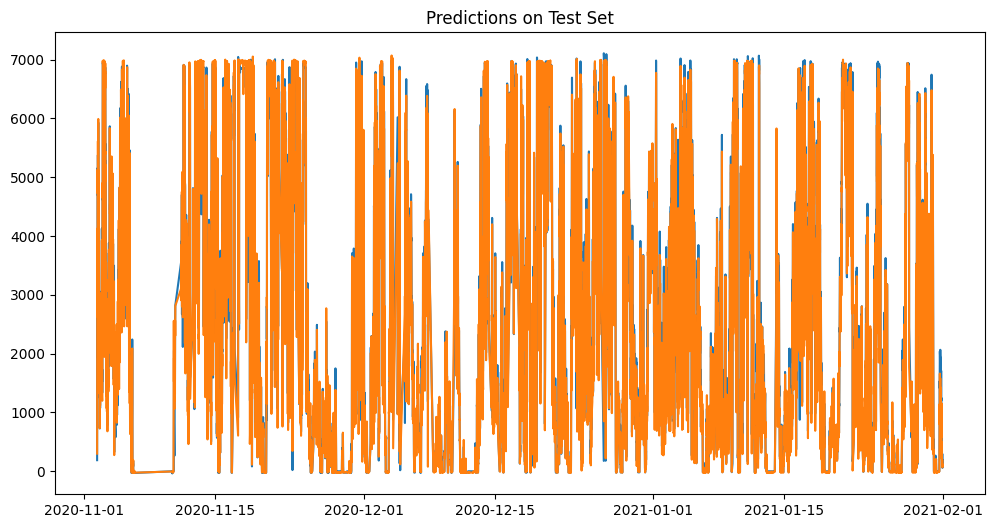

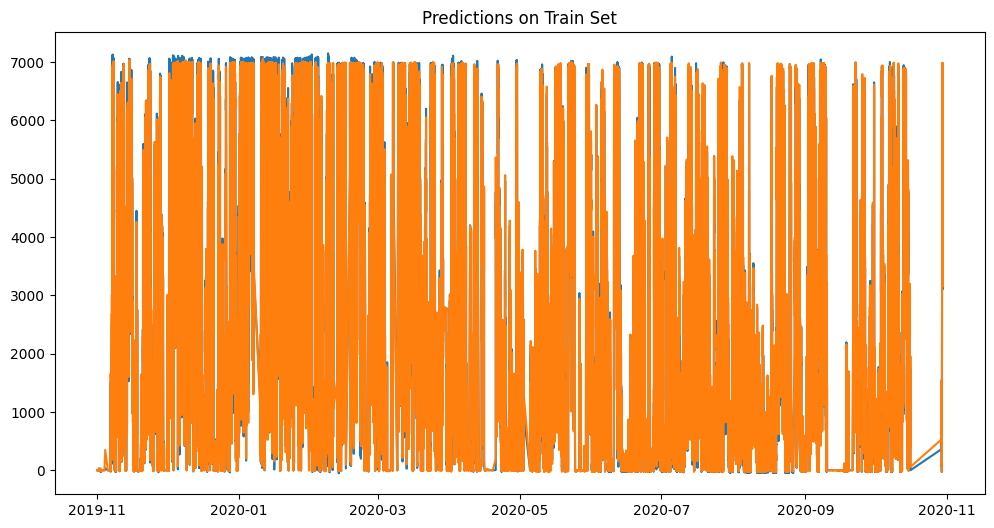

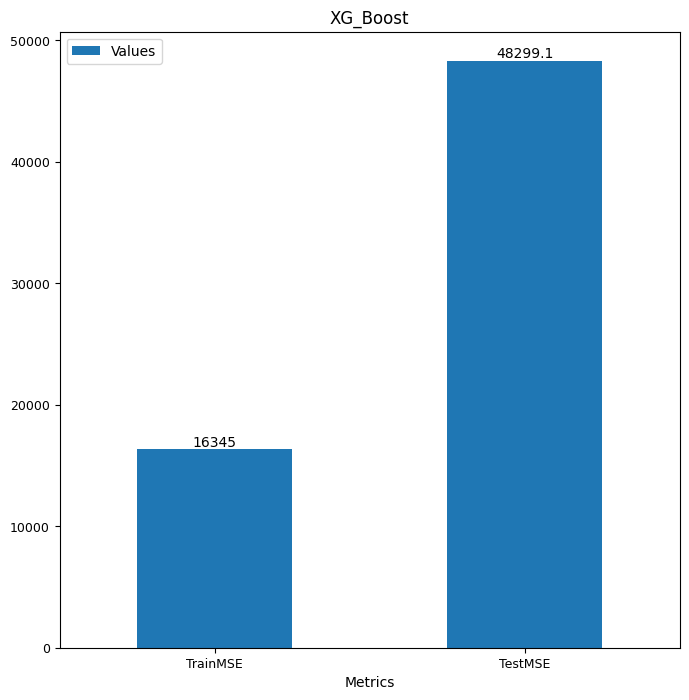

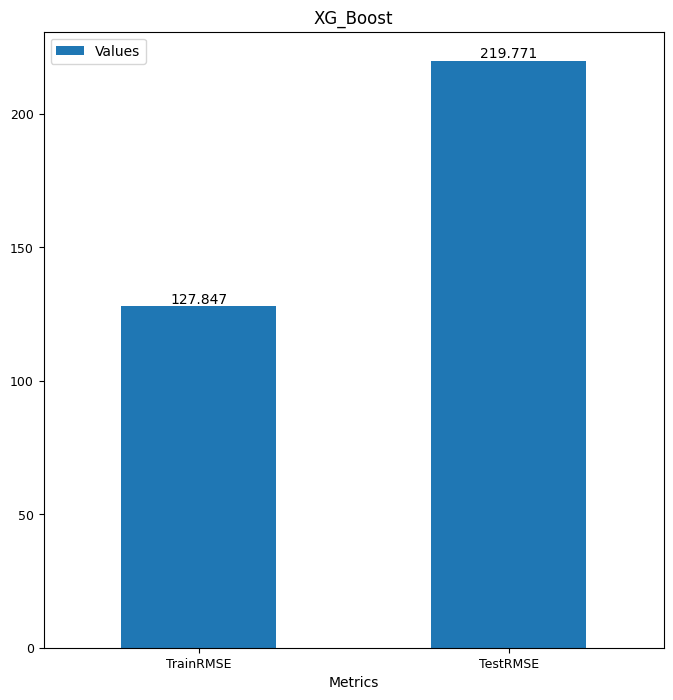

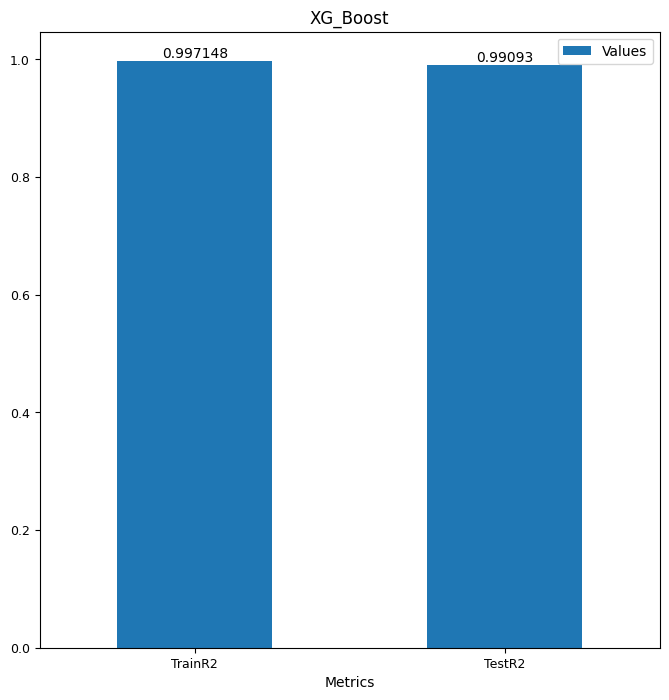

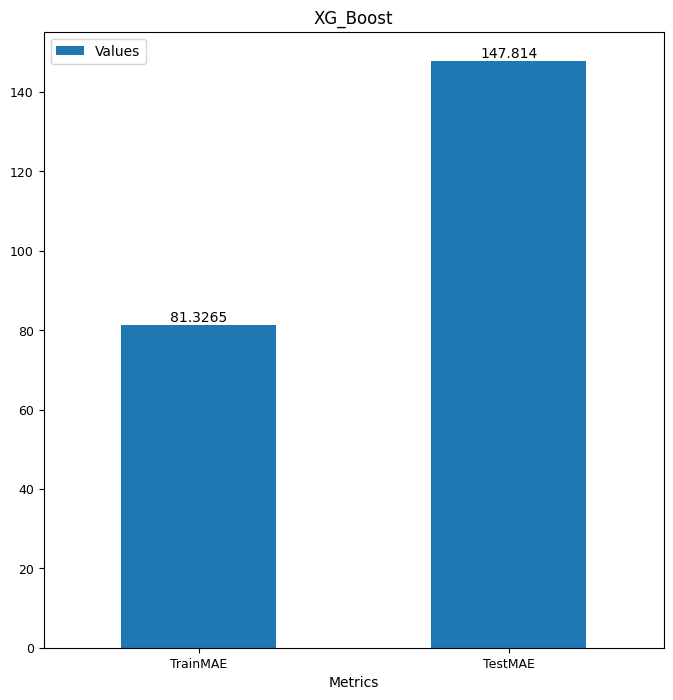

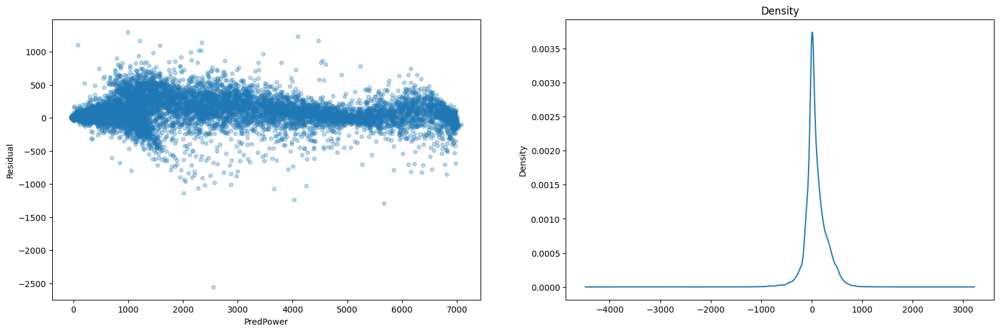


2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_temp_orig-data


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 13672.759252224028
TrainRMSE: 116.9305744971093
TrainR2: 0.997614211659362
TrainMAE: 73.76345832953177
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.8, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None, gpu_id=None,
                             

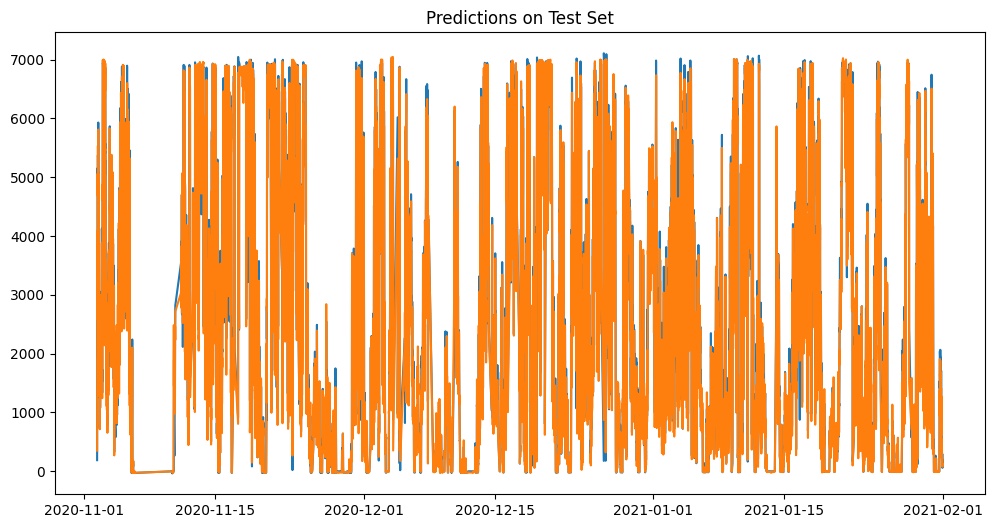

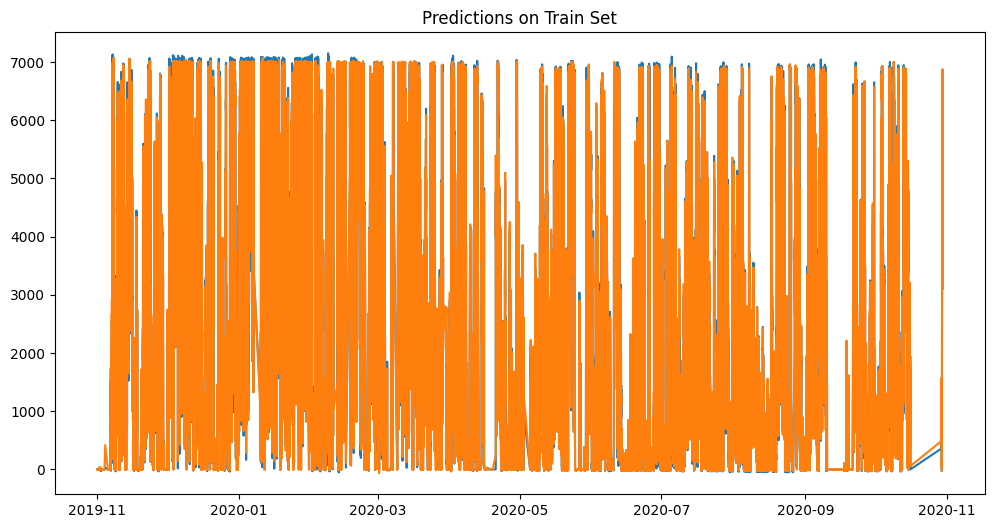

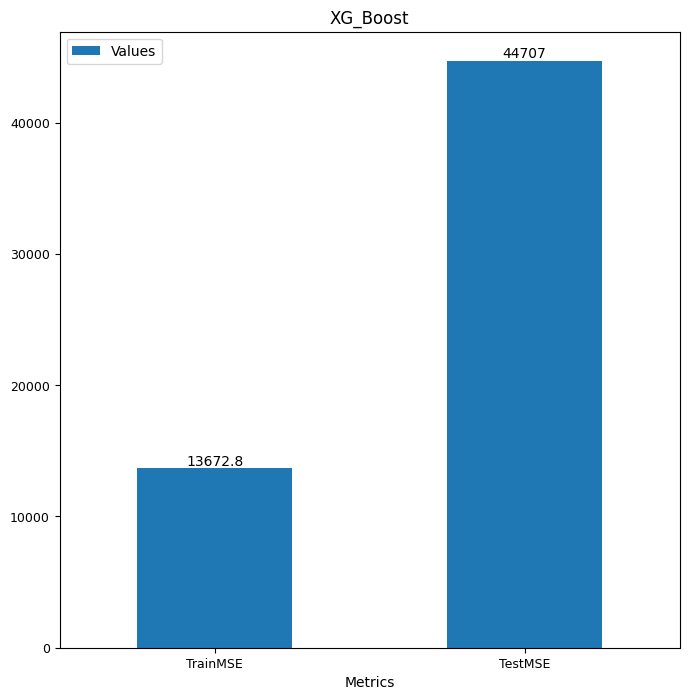

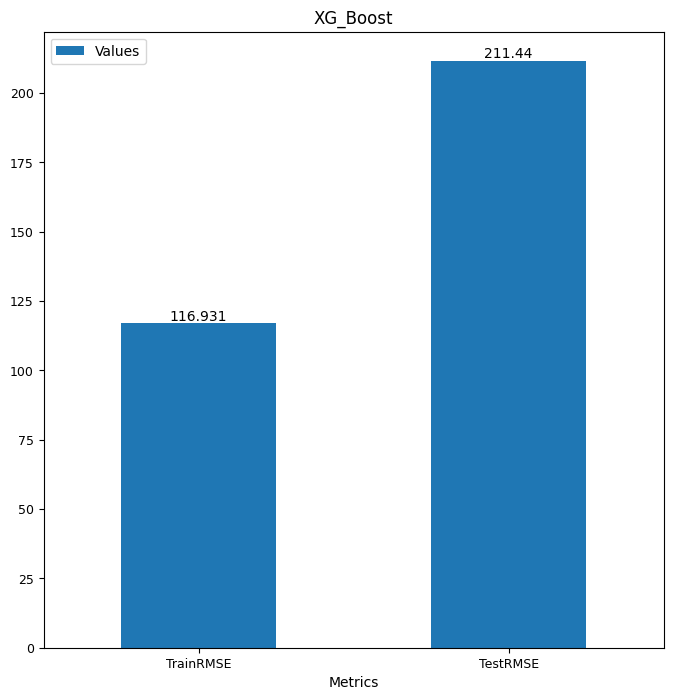

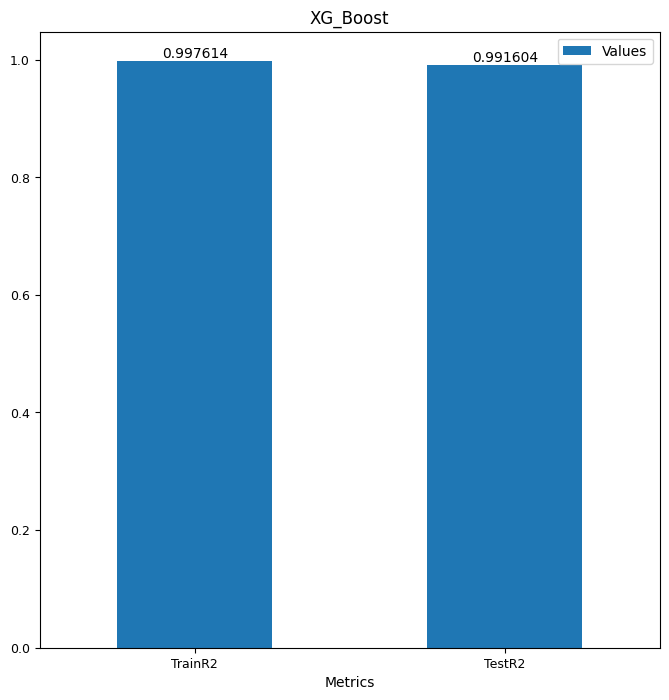

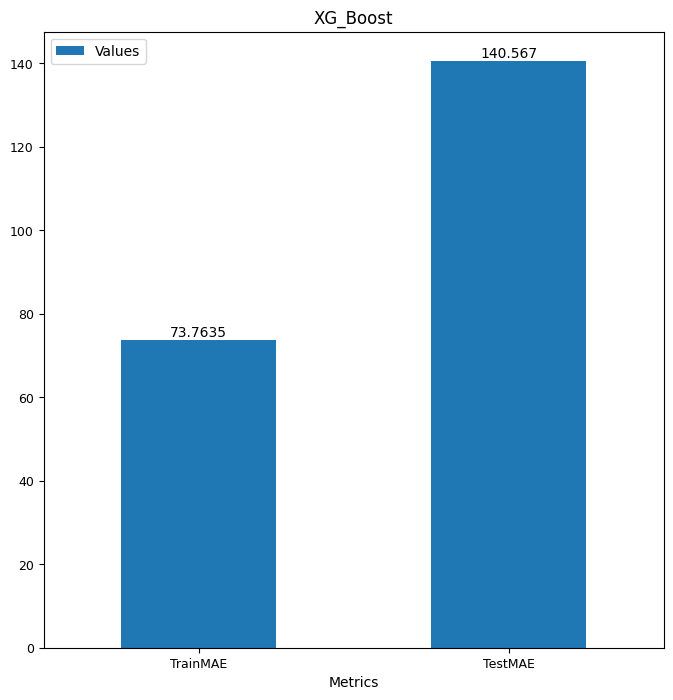

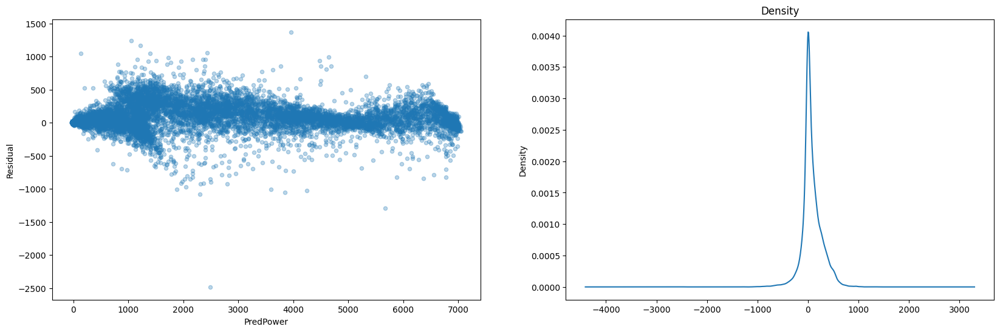


2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_pres_orig-data


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 21576.67205157267
TrainRMSE: 146.88999983515785
TrainR2: 0.9962350413942938
TrainMAE: 92.55963972098249
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.30000000000000004, base_score=None,
                              booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None, gpu_id=None,
            

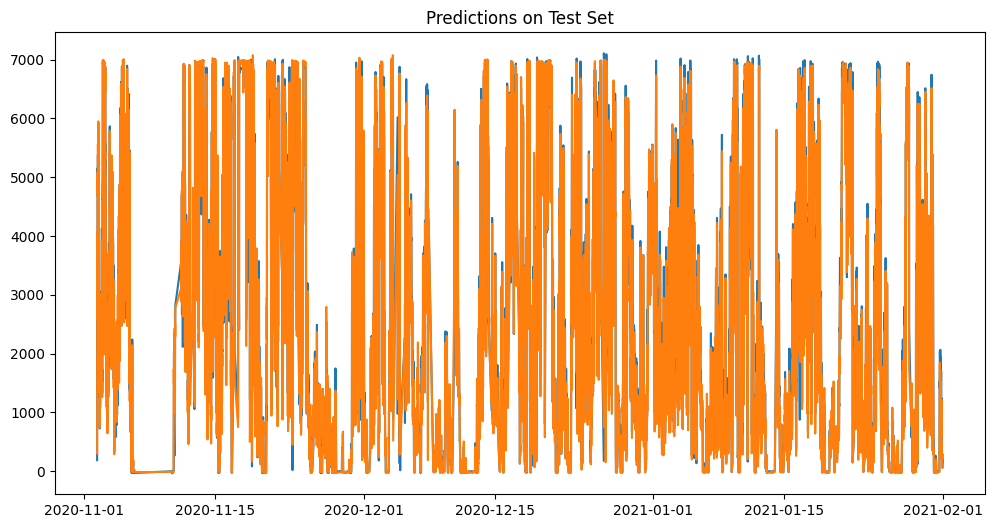

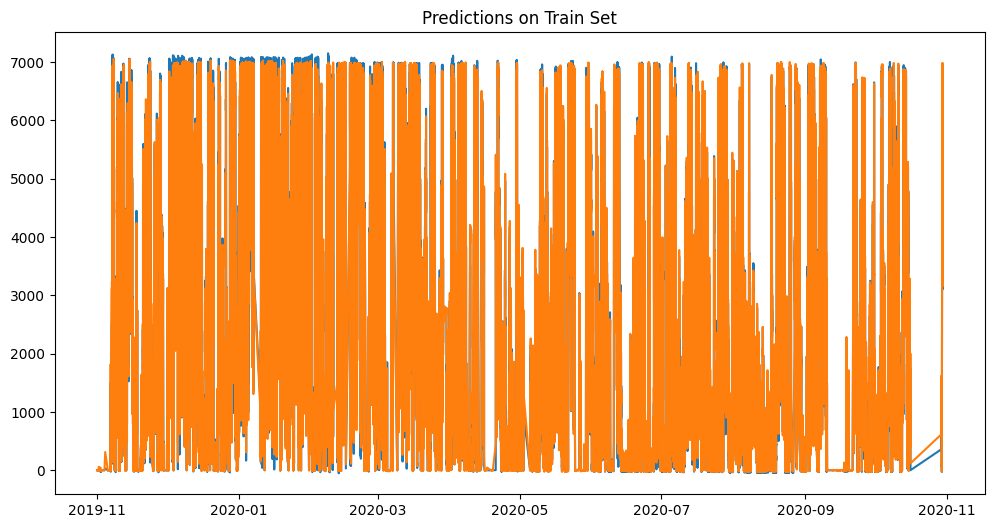

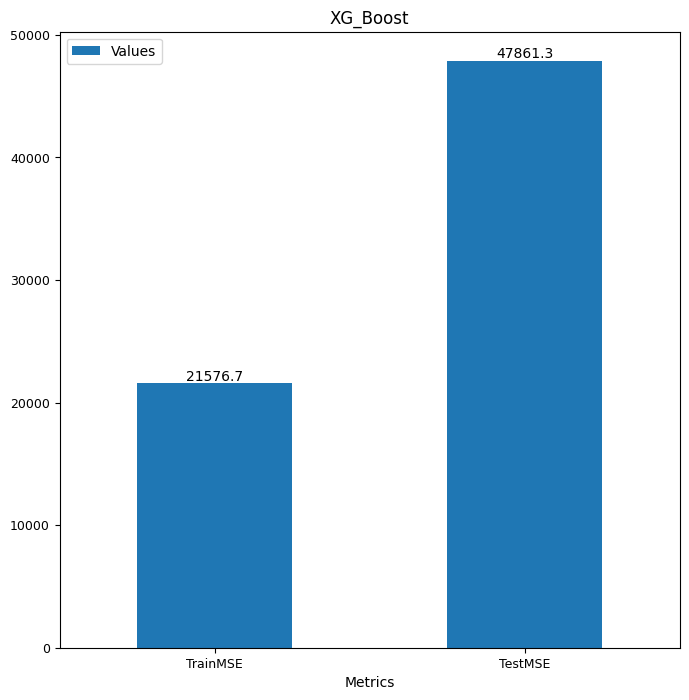

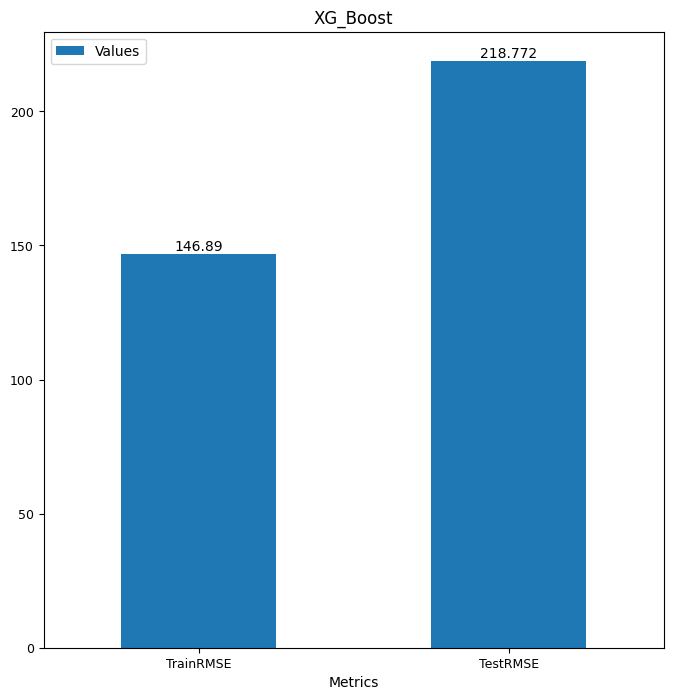

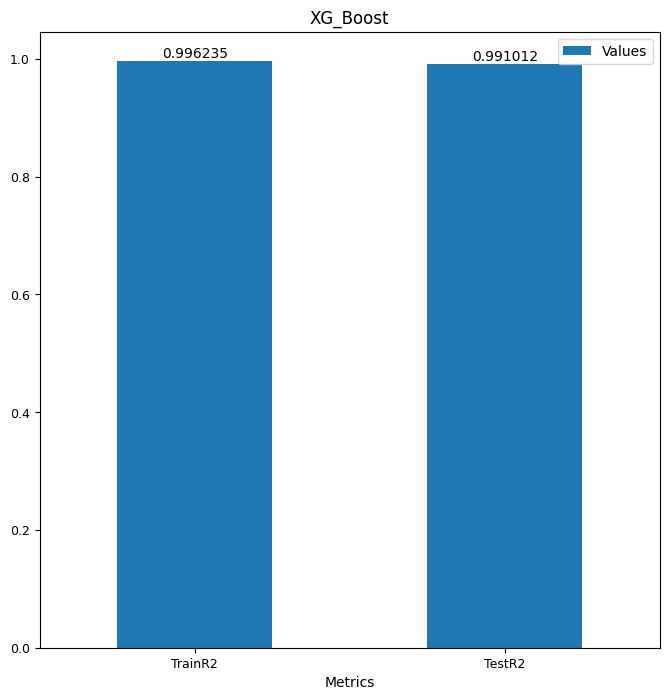

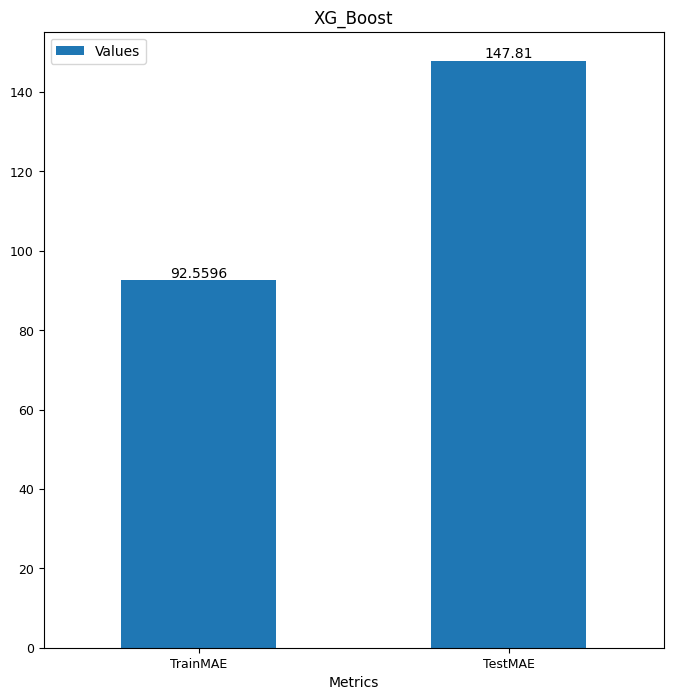

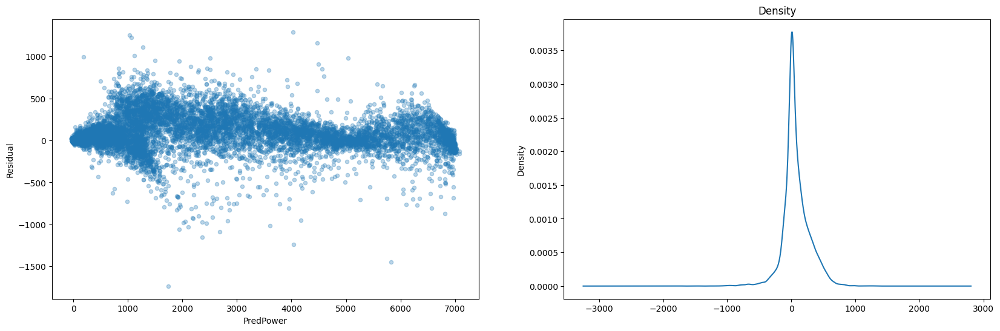


2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_temp_pres_orig-data


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 12551.441949321219
TrainRMSE: 112.03321806197133
TrainR2: 0.9978098726593161
TrainMAE: 70.40732139421405
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.8, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None, gpu_id=None,
                      

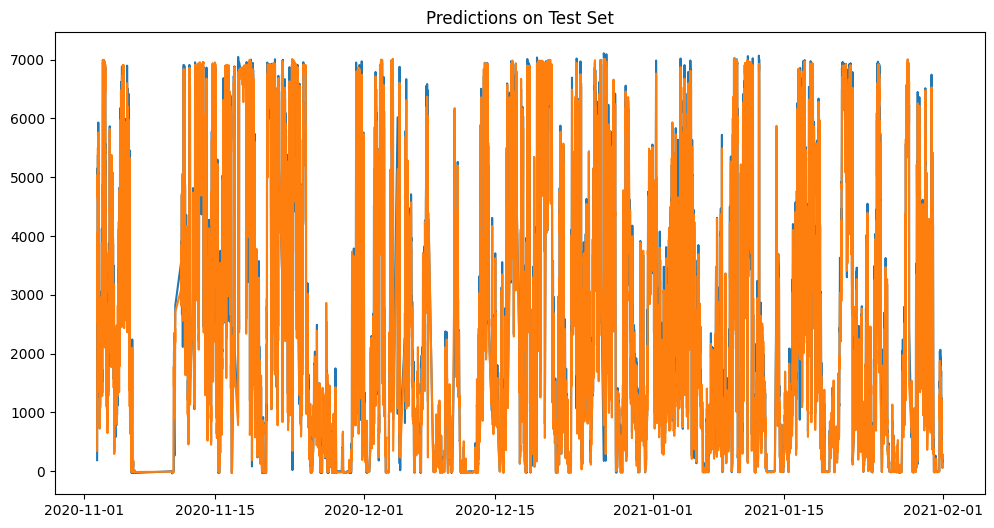

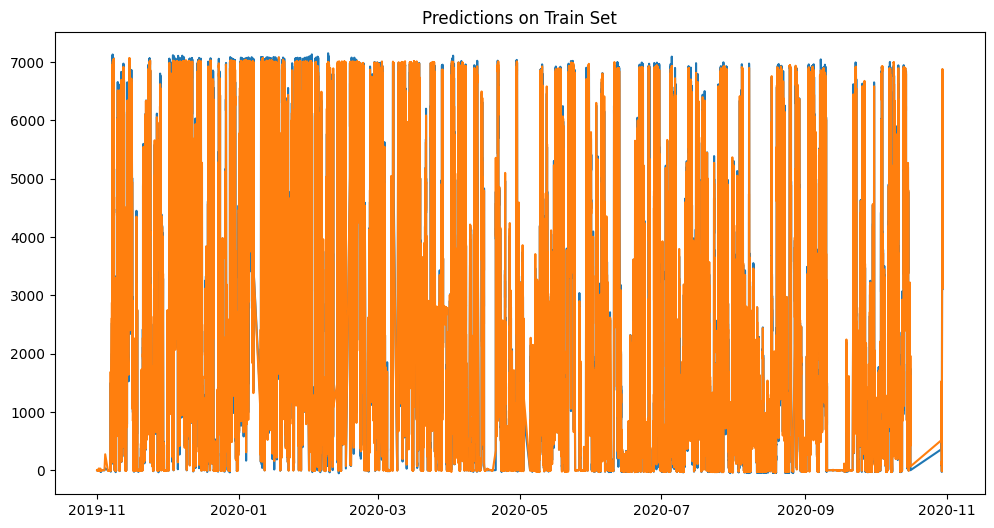

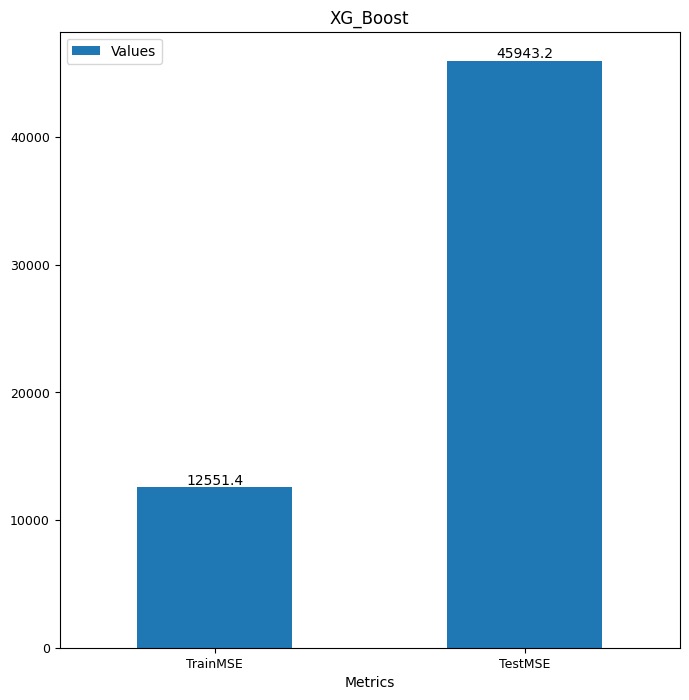

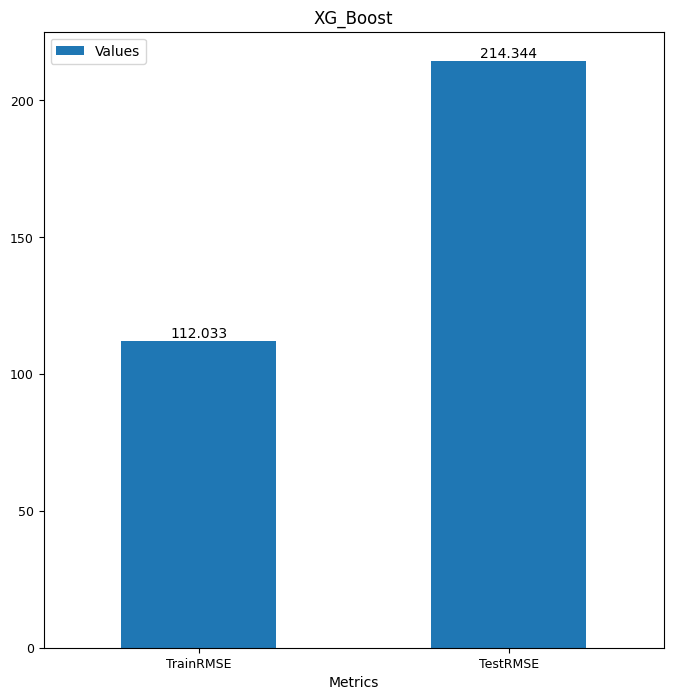

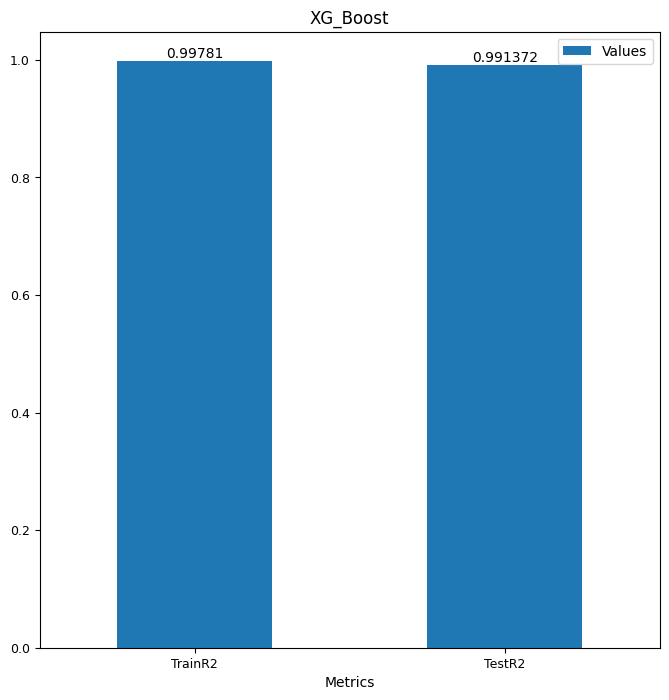

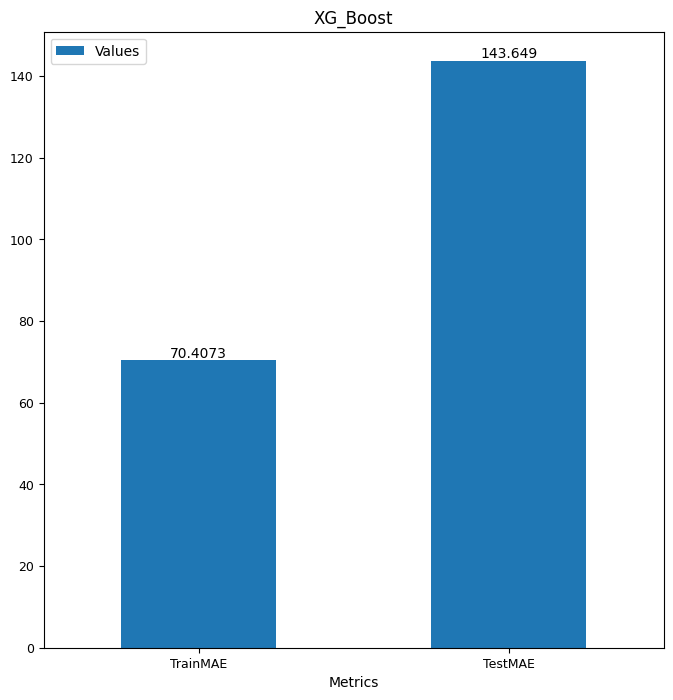

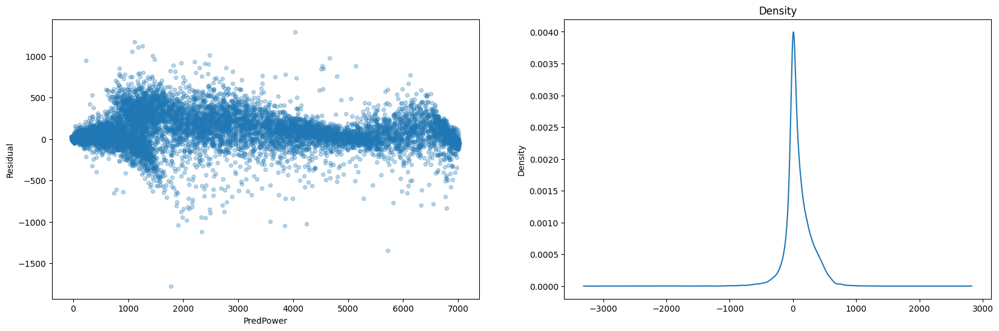

west-ocean
direction-split...
west-ocean
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_intial_features_orig-data_west-ocean


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 16056.896065495133
TrainRMSE: 126.71580826990424
TrainR2: 0.9973336607427077
TrainMAE: 87.74426929289369
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.8, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=N

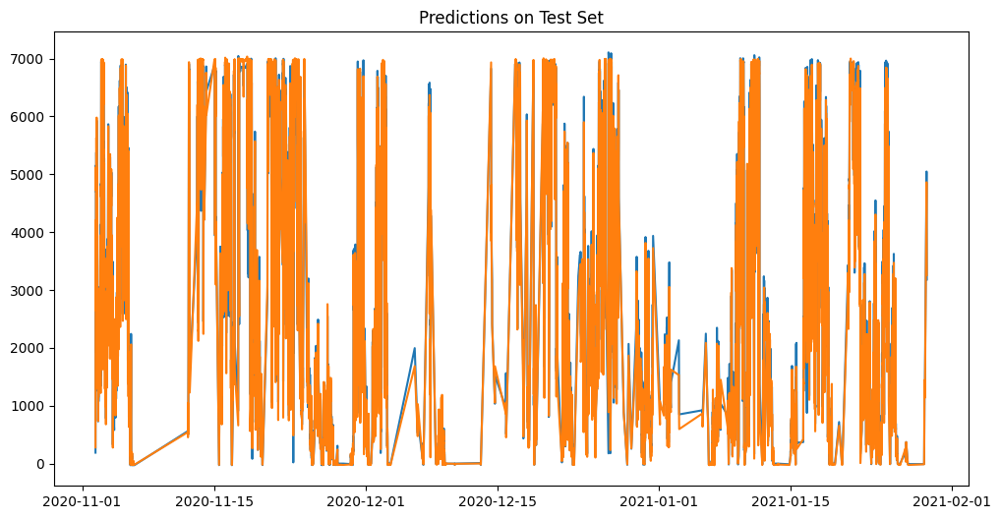

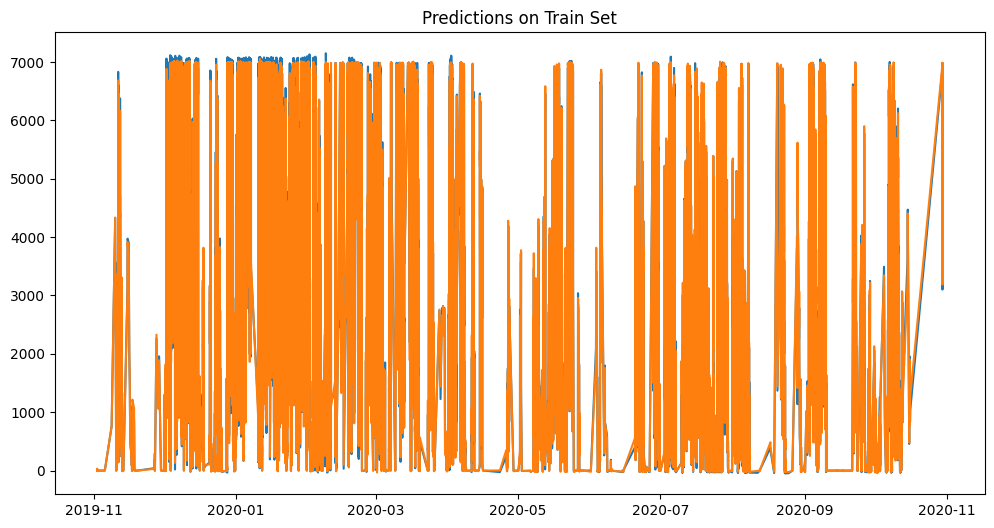

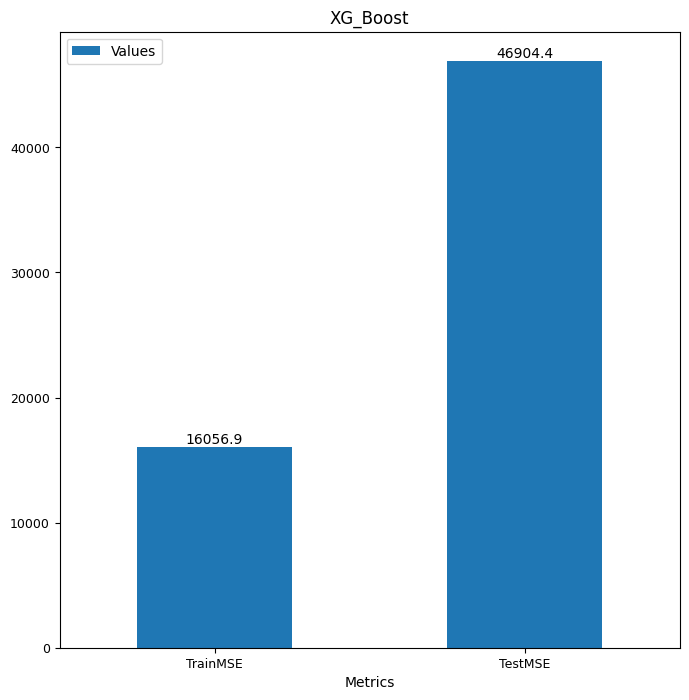

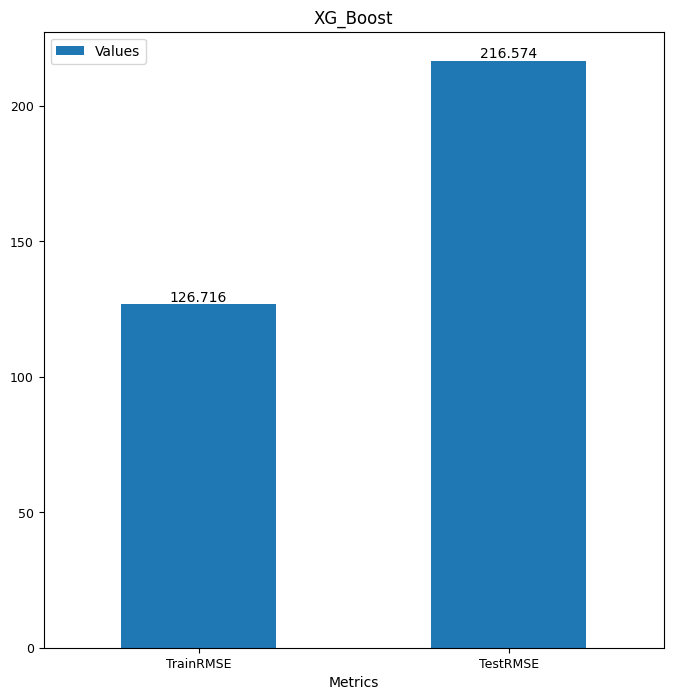

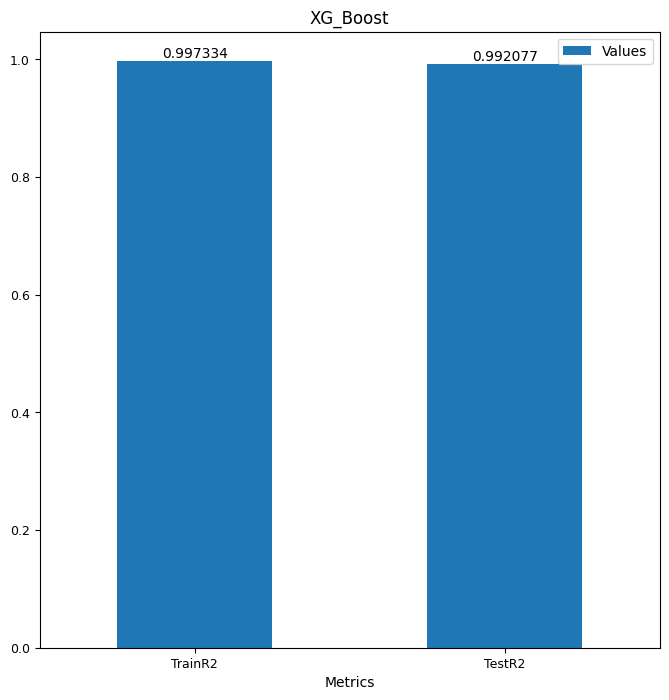

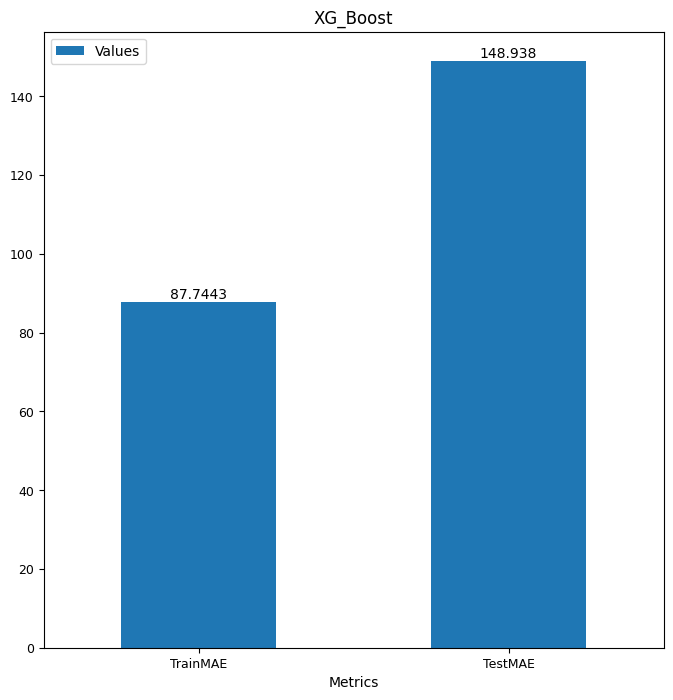

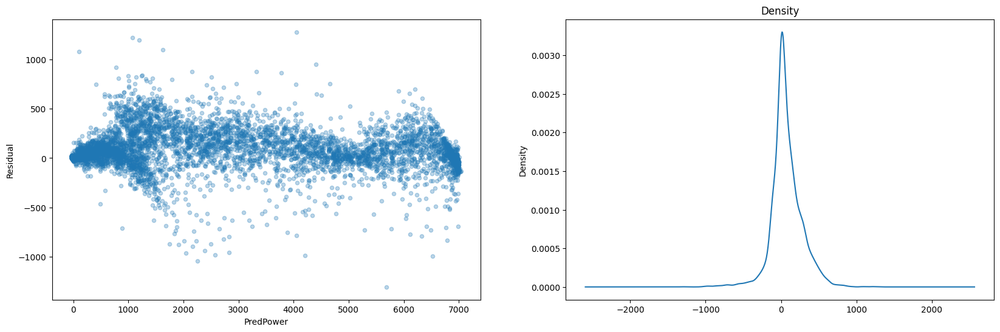

west-ocean
direction-split...
west-ocean
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_temp_orig-data_west-ocean


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 12224.116473817381
TrainRMSE: 110.56272642178006
TrainR2: 0.99797011567448
TrainMAE: 75.45598649096091
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.8, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gam

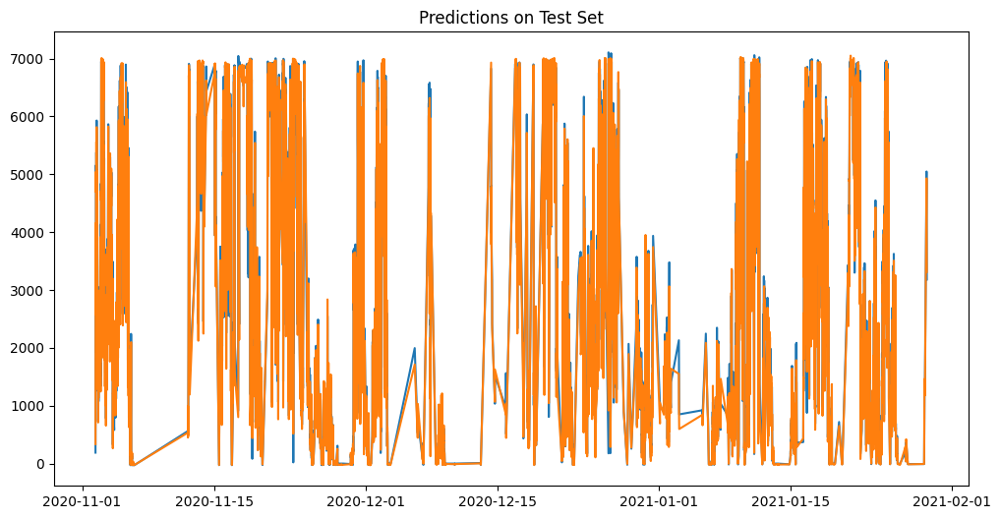

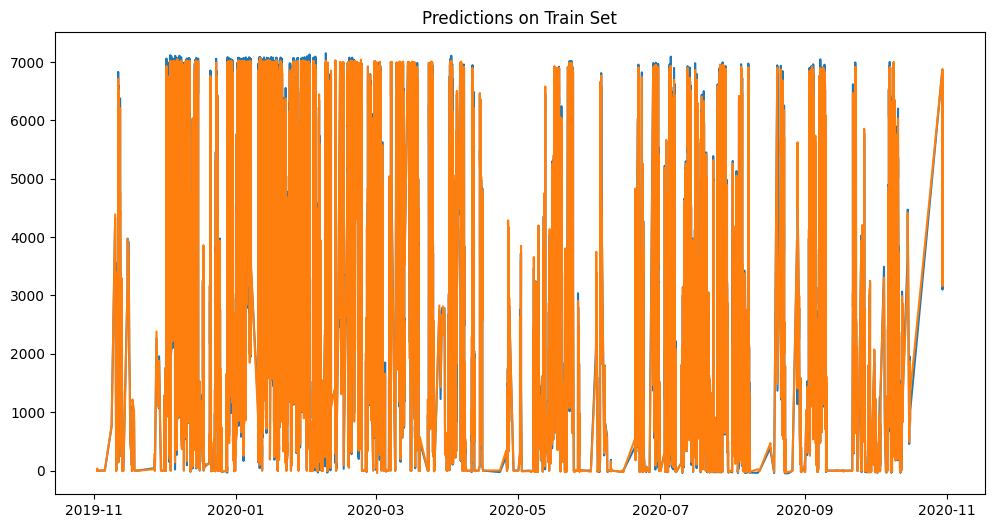

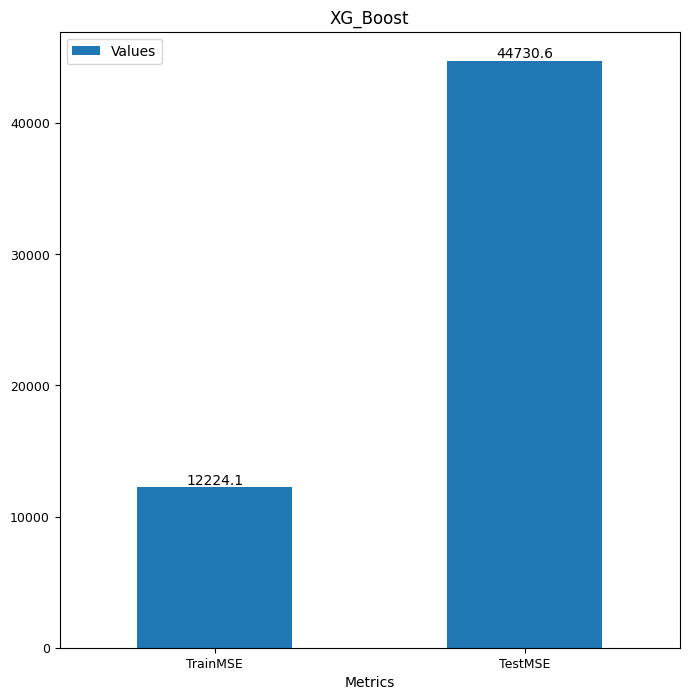

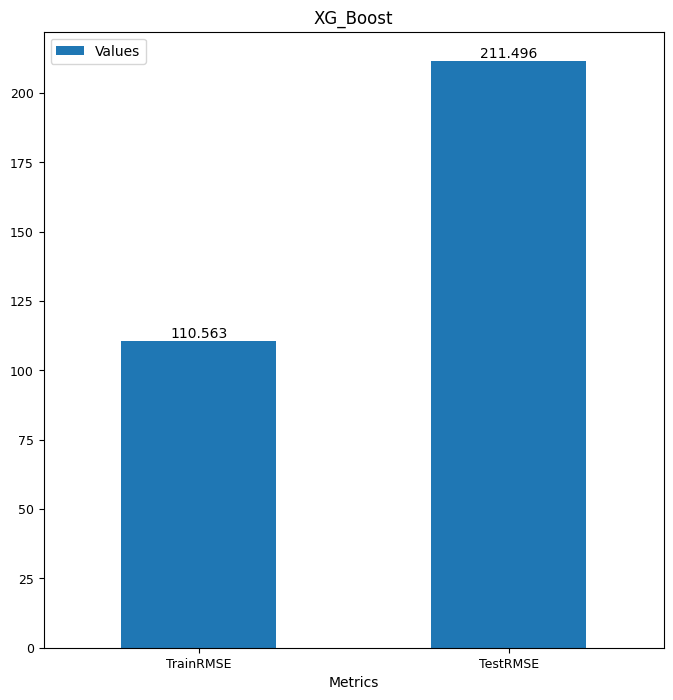

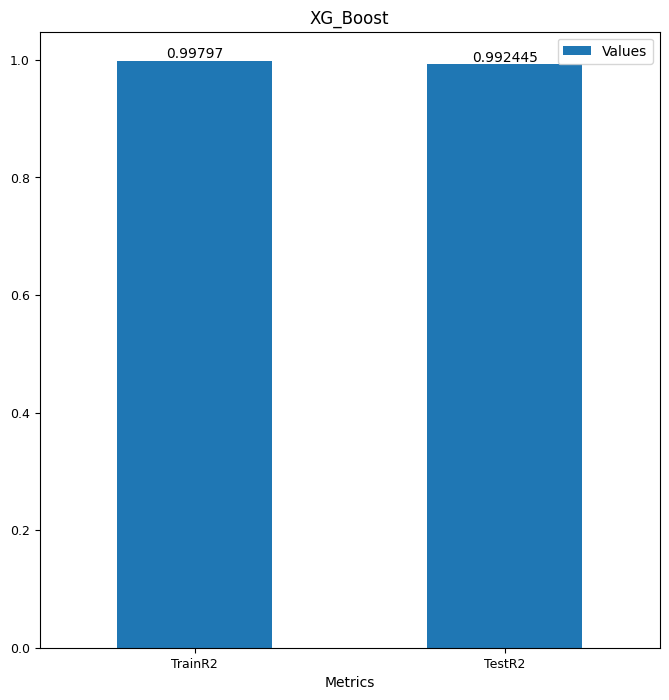

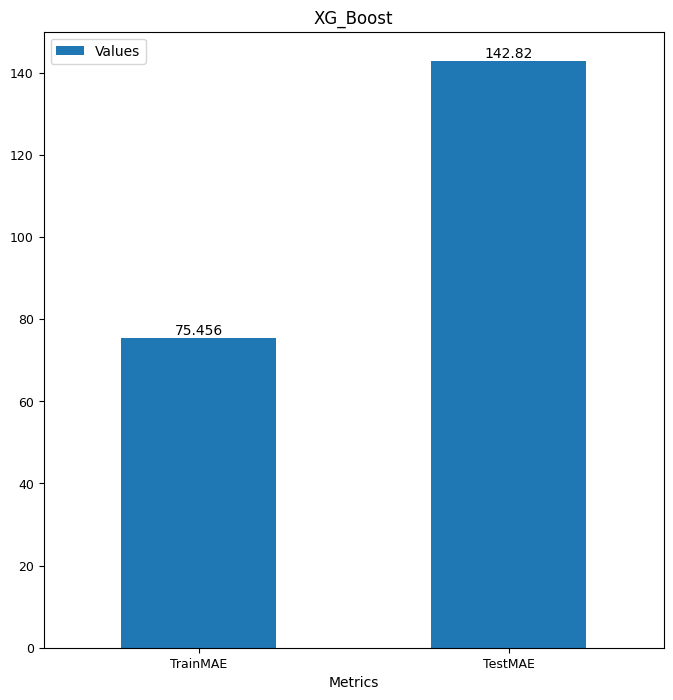

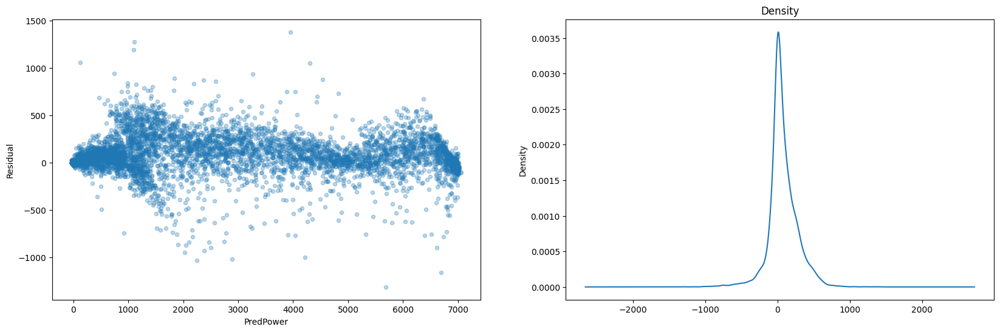

west-ocean
direction-split...
west-ocean
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_pres_orig-data_west-ocean


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 13702.744521310791
TrainRMSE: 117.05872253408026
TrainR2: 0.9977245810460011
TrainMAE: 79.89152787884298
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.8, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, g

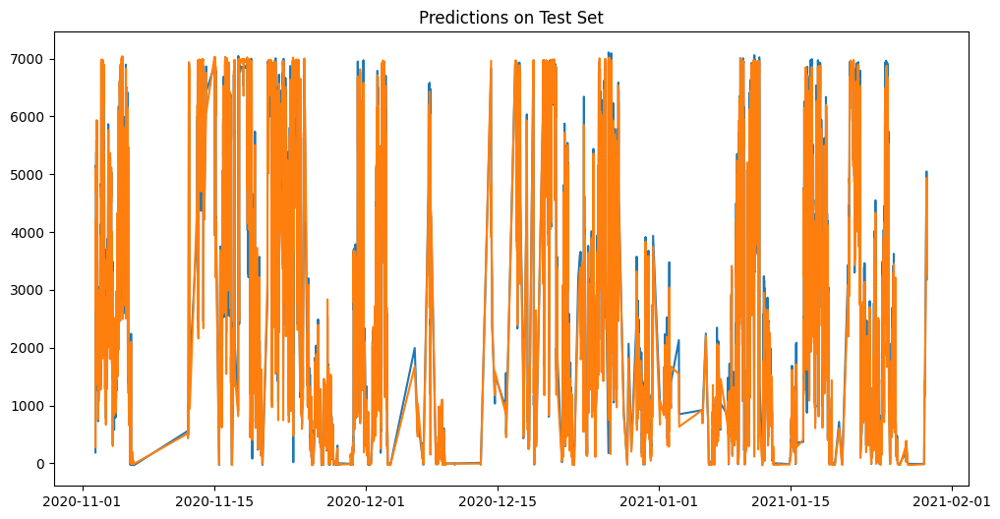

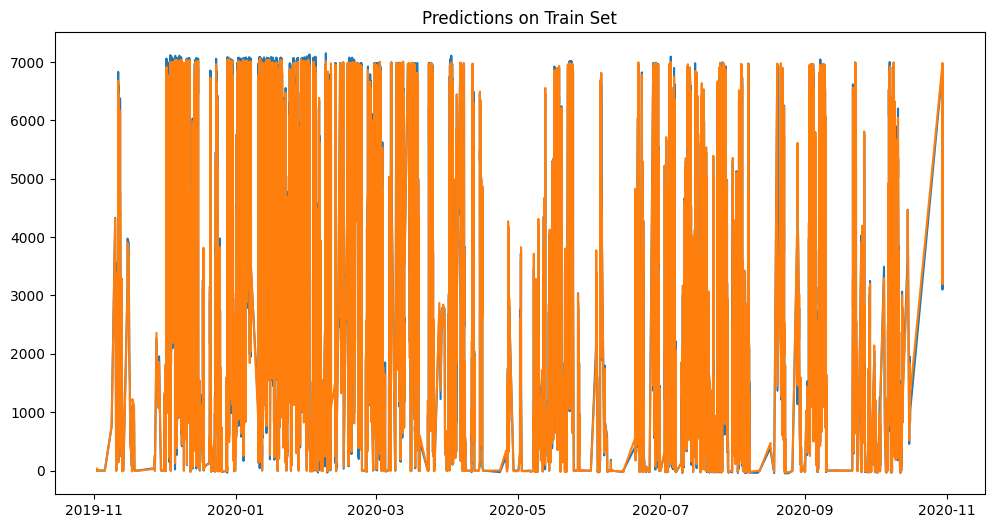

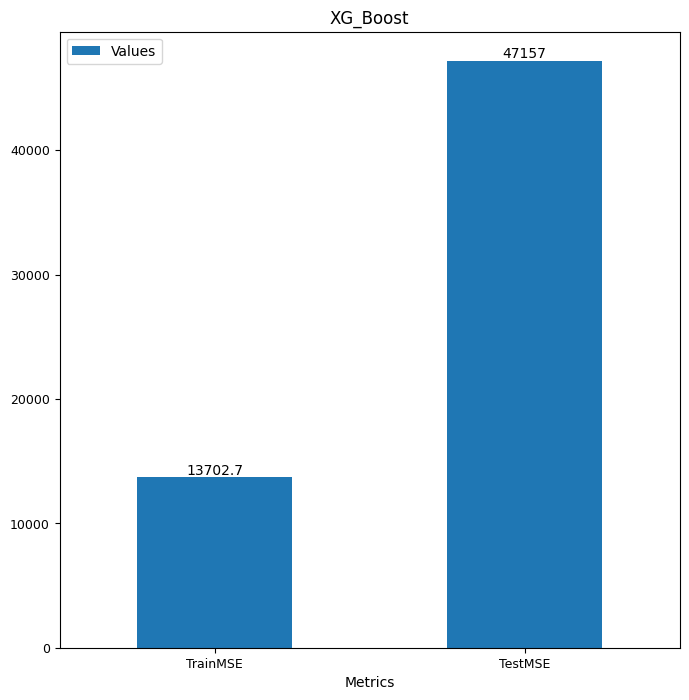

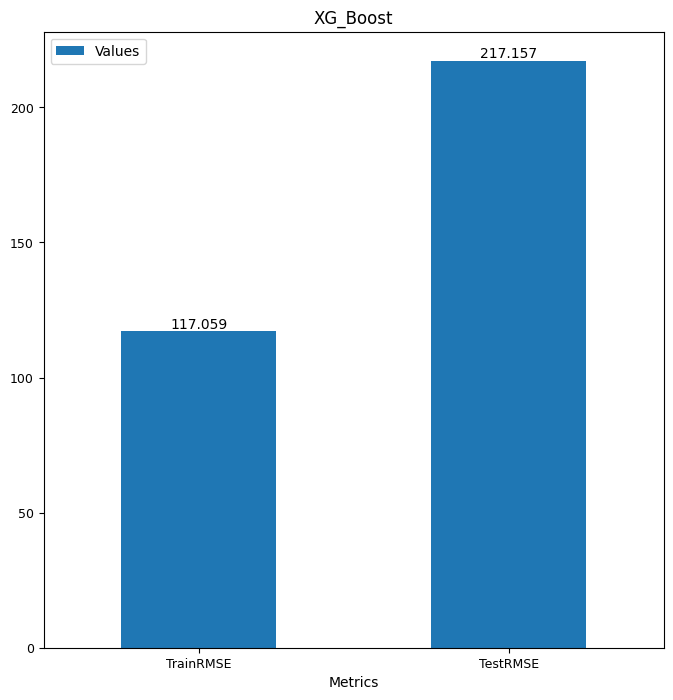

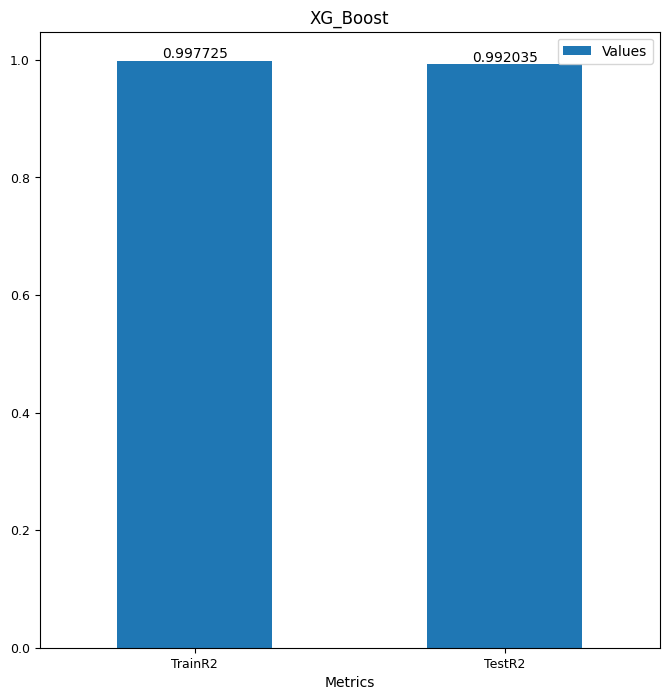

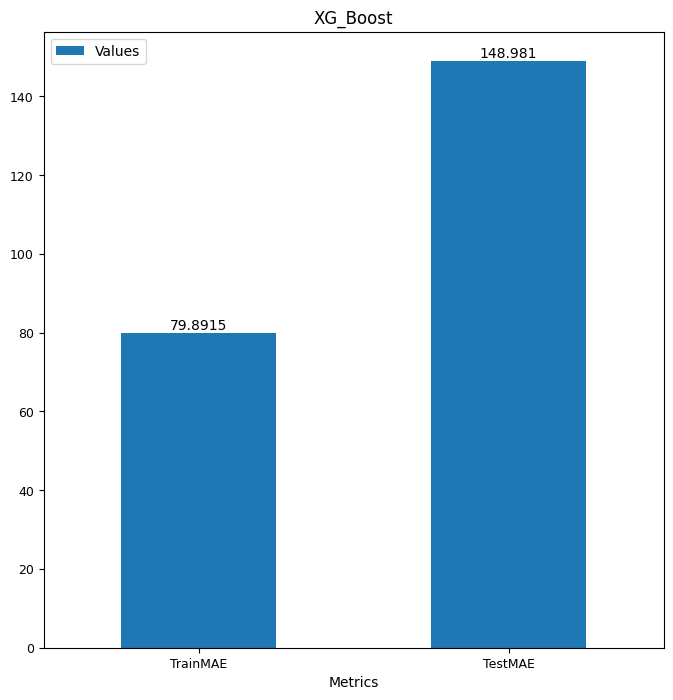

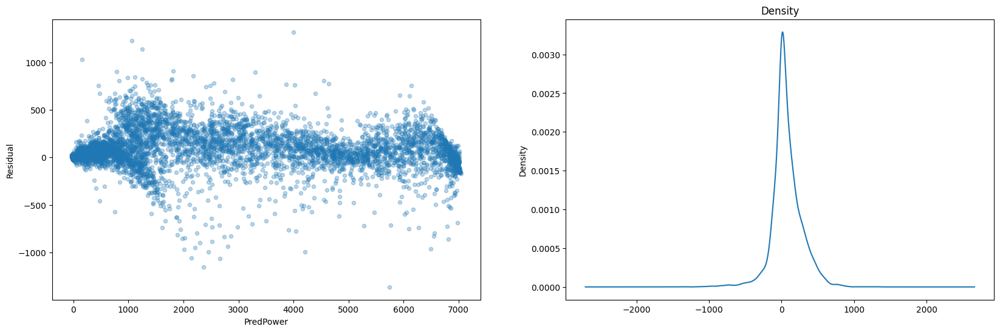

west-ocean
direction-split...
west-ocean
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_temp_diff_orig-data_west-ocean


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 13290.091273914917
TrainRMSE: 115.28265816641685
TrainR2: 0.9977931044734863
TrainMAE: 79.24635215650629
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.8, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=No

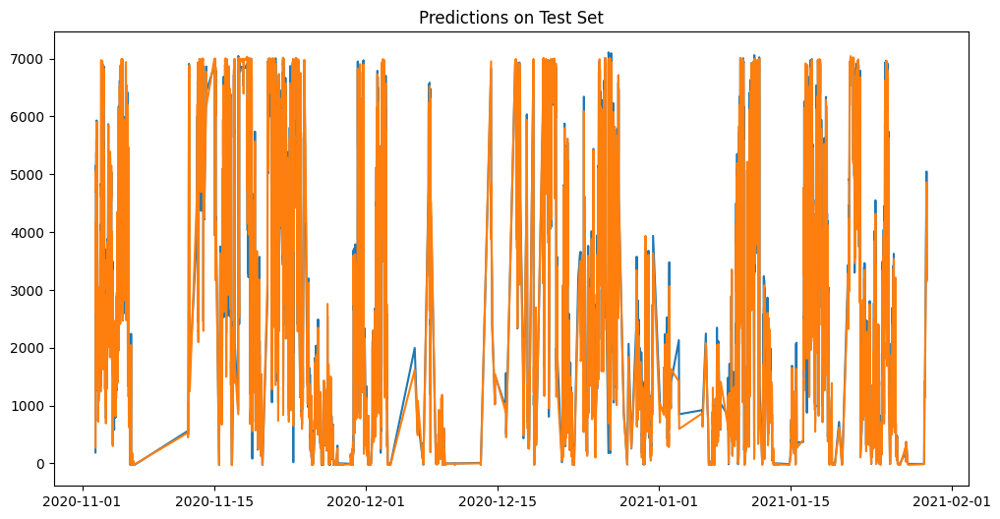

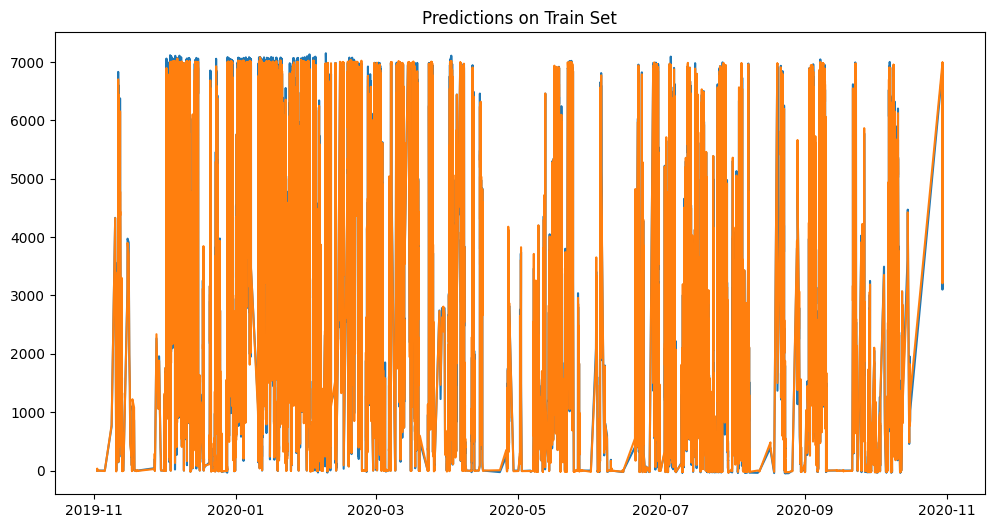

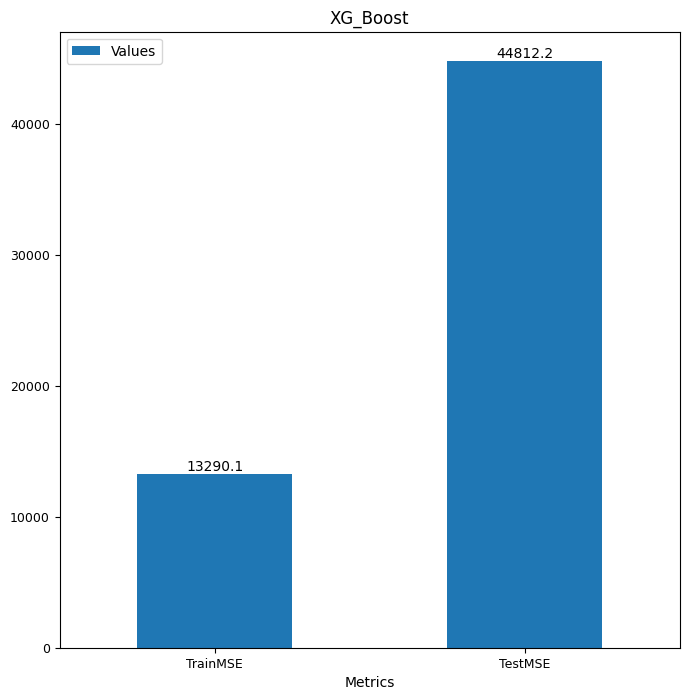

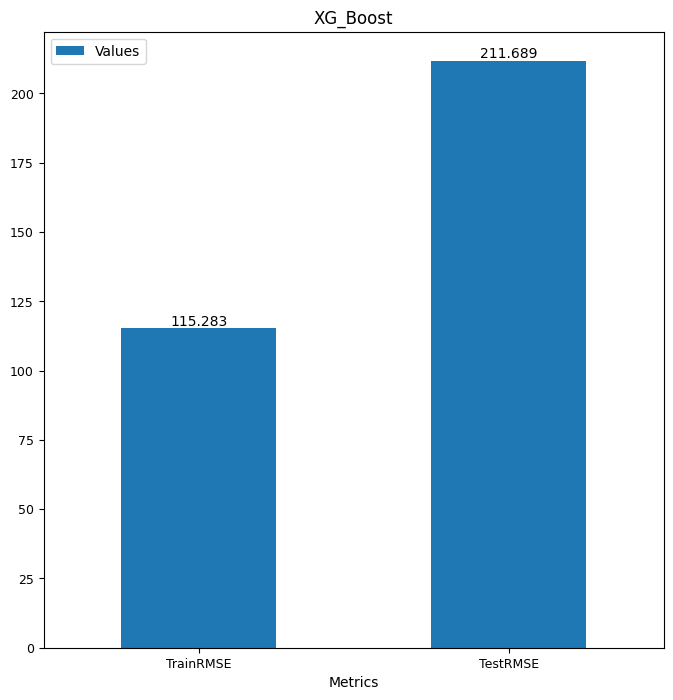

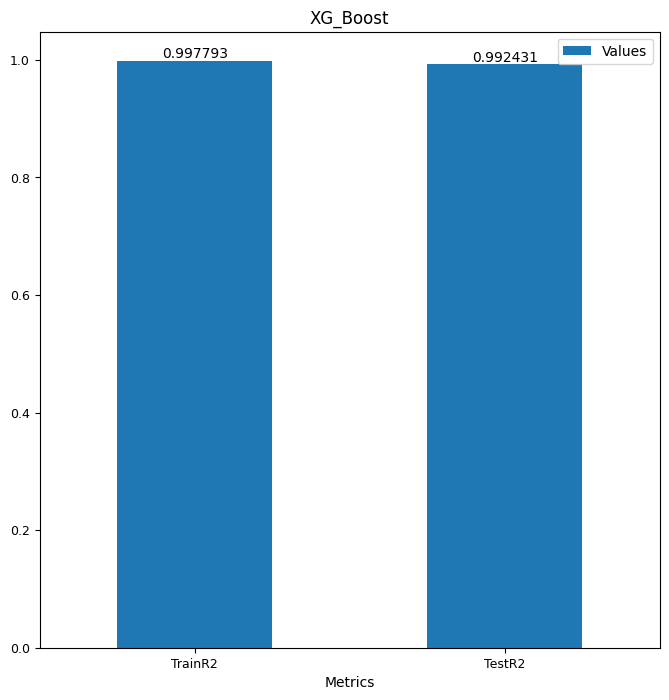

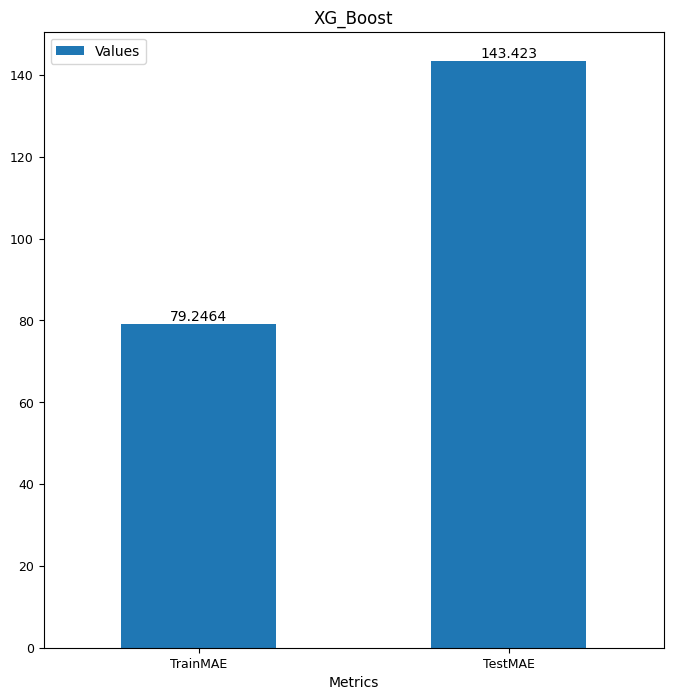

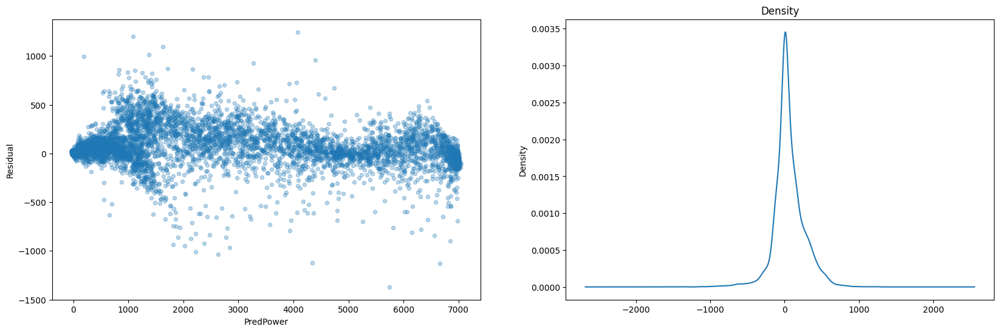

west-ocean
direction-split...
west-ocean
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_t2m_d2m_orig-data_west-ocean


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 11052.78988795892
TrainRMSE: 105.1322495144041
TrainR2: 0.9981646211409316
TrainMAE: 71.70851214211383
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.8, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, 

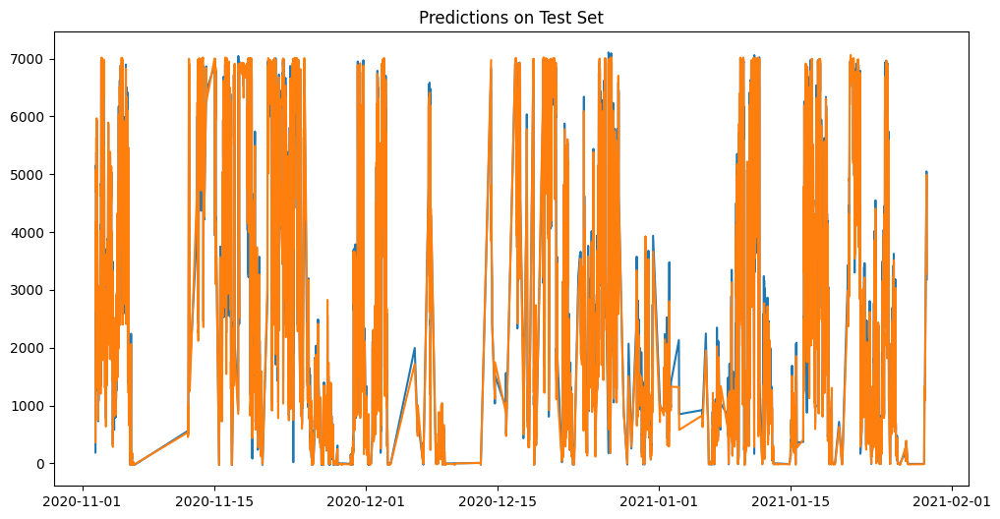

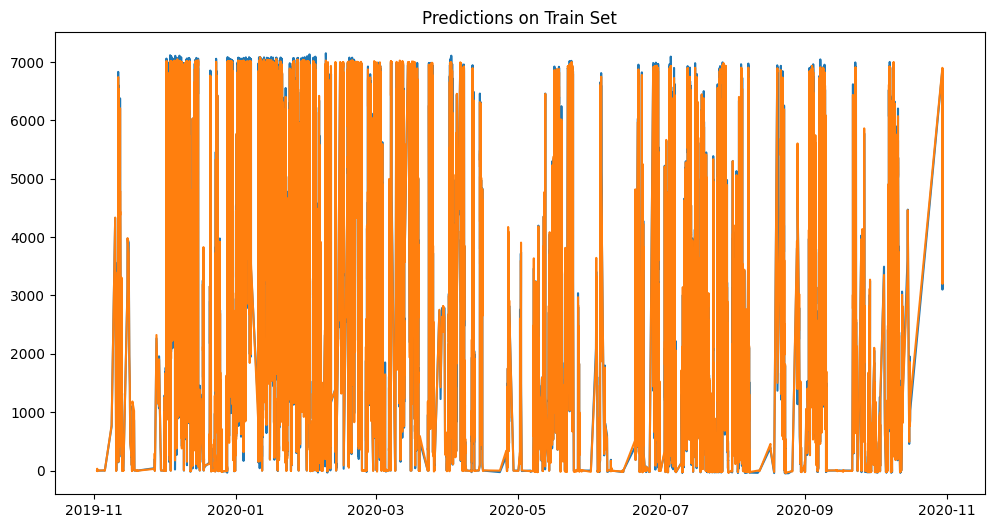

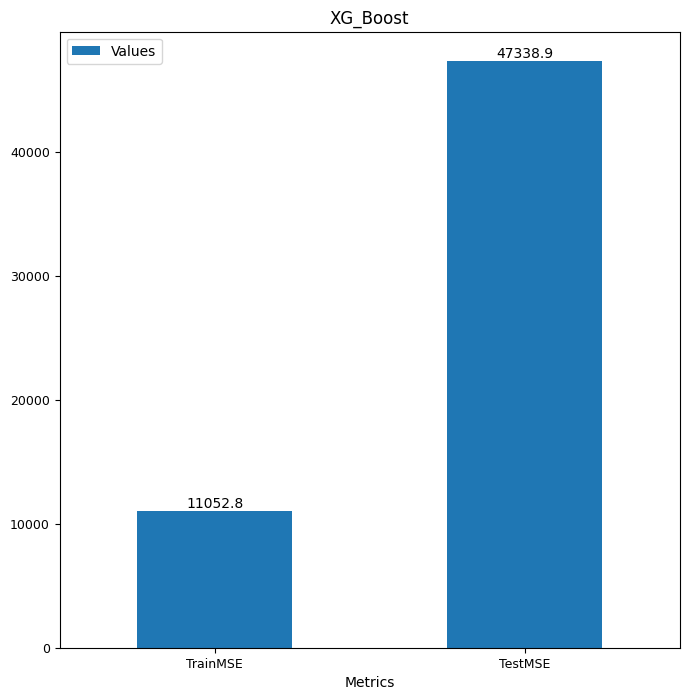

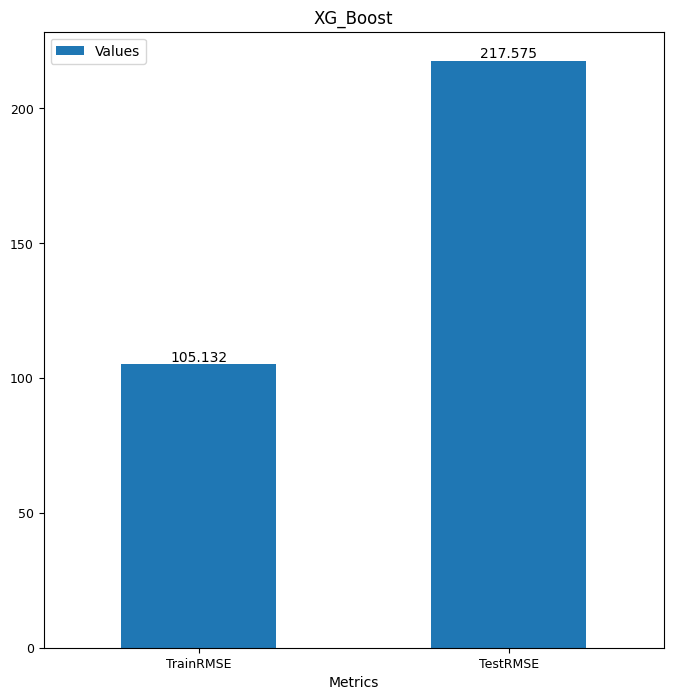

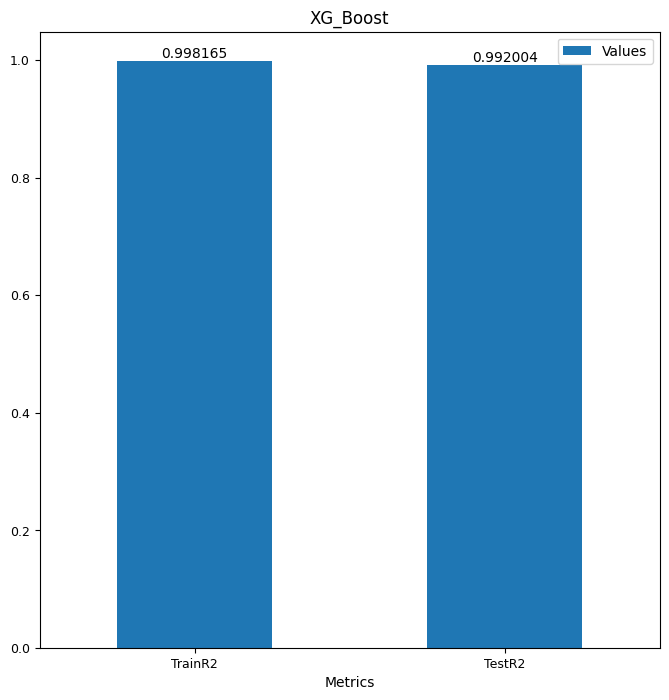

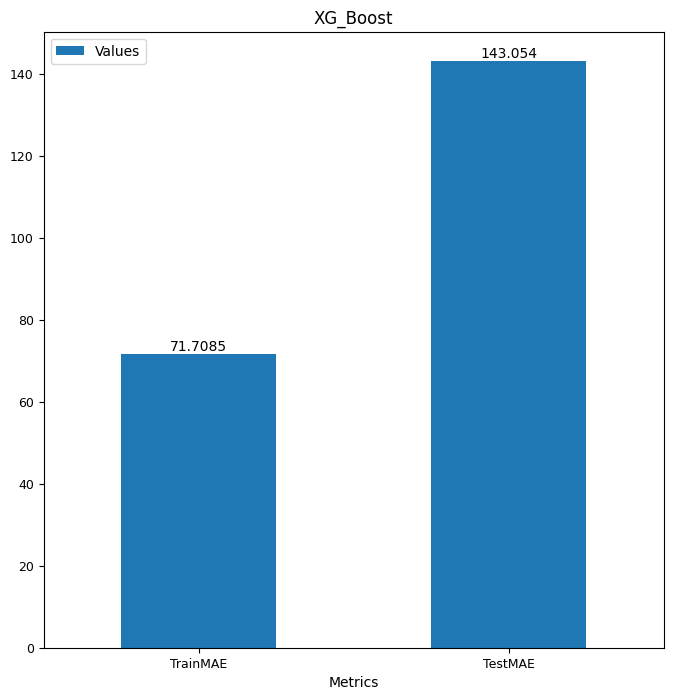

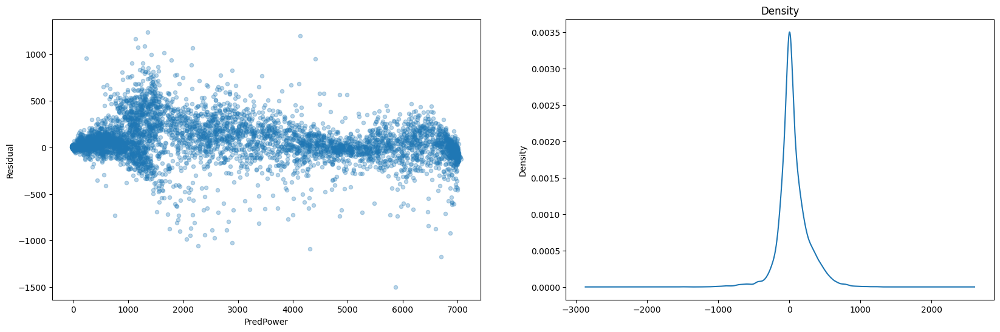

west-ocean
direction-split...
west-ocean
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_rh_orig-data_west-ocean


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 20710.62468699619
TrainRMSE: 143.9118643024132
TrainR2: 0.9965608825378991
TrainMAE: 98.03734272902578
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.8, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma

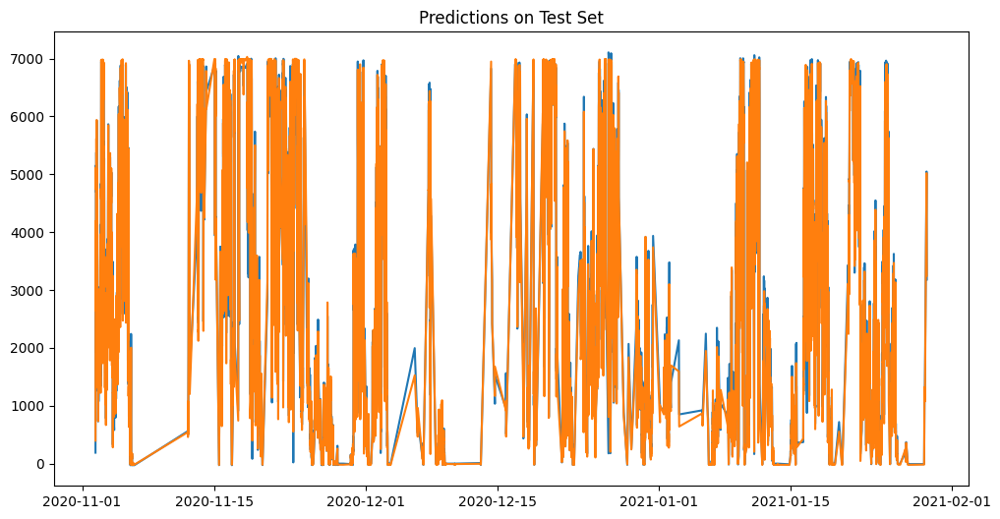

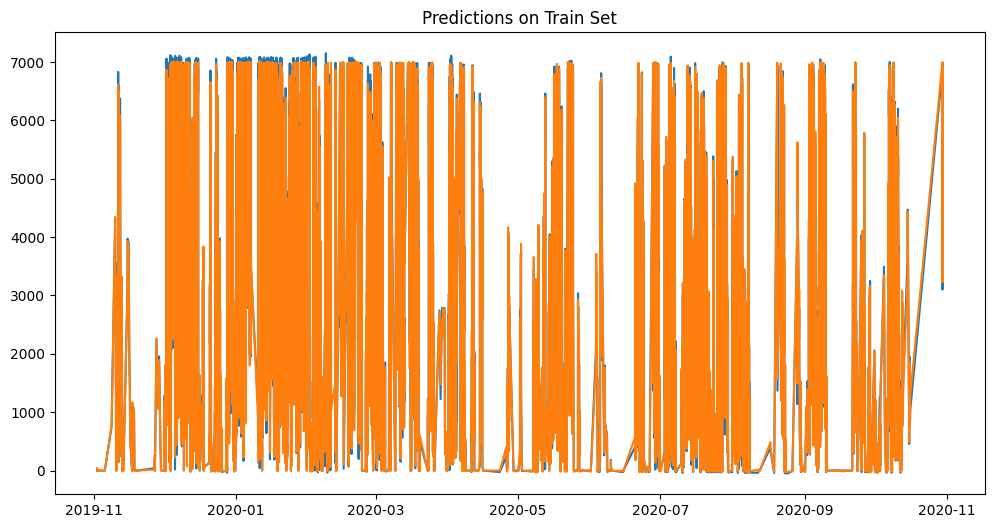

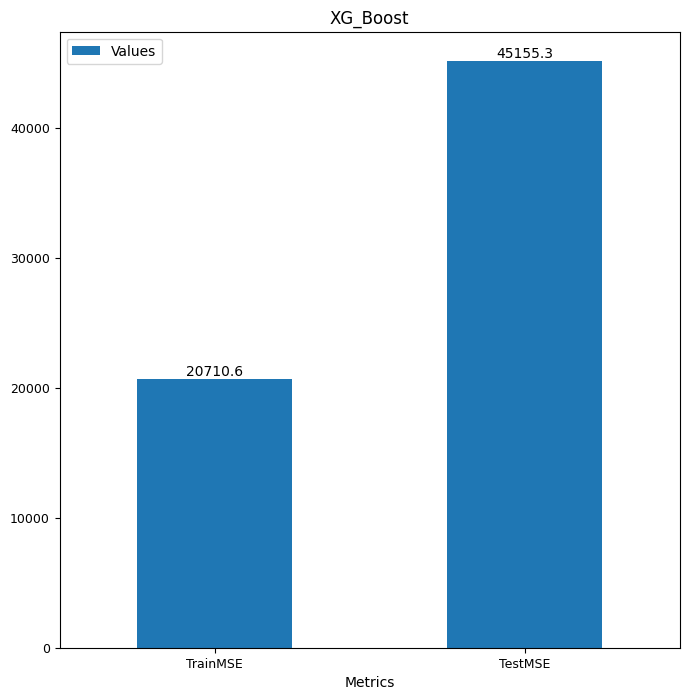

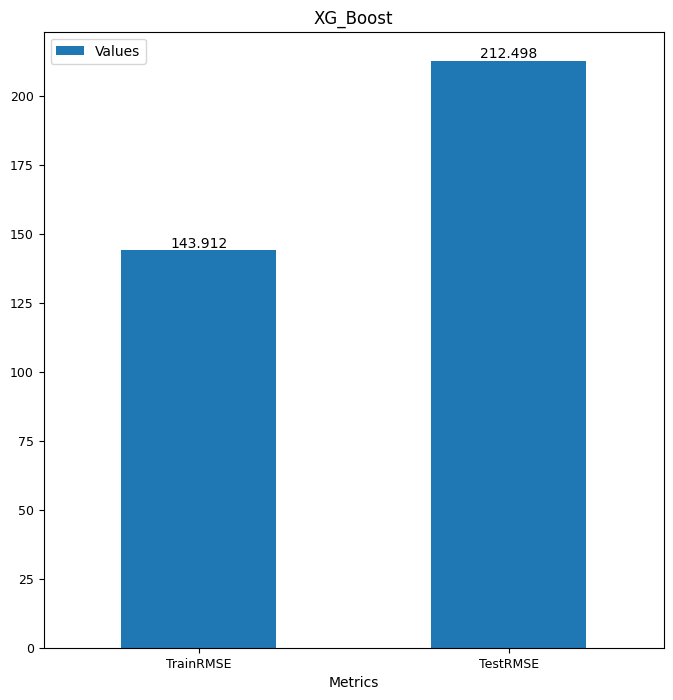

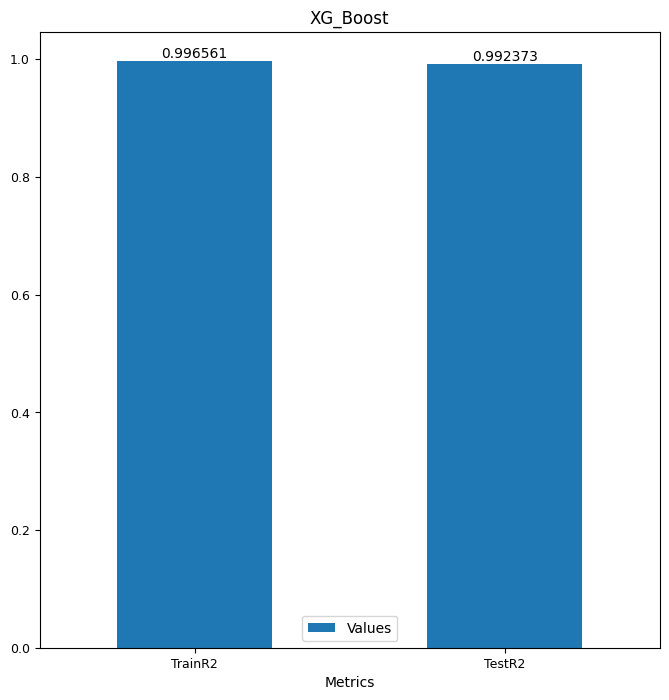

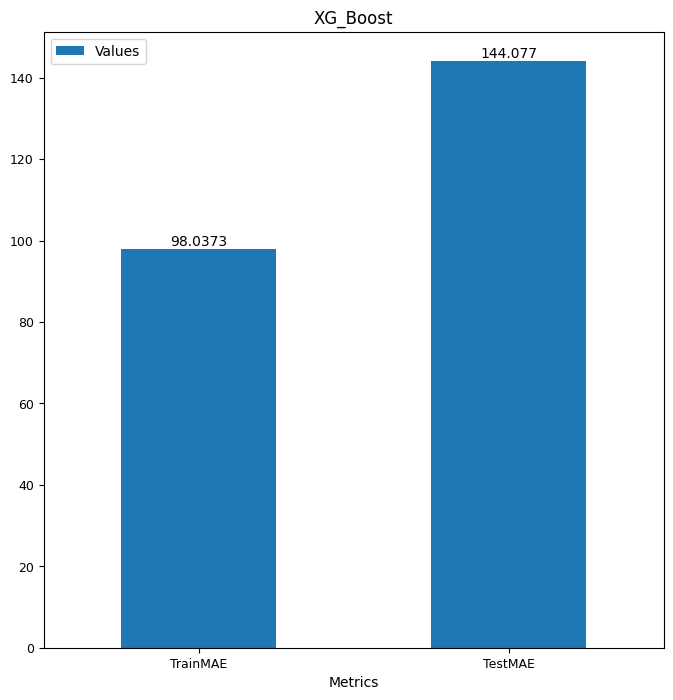

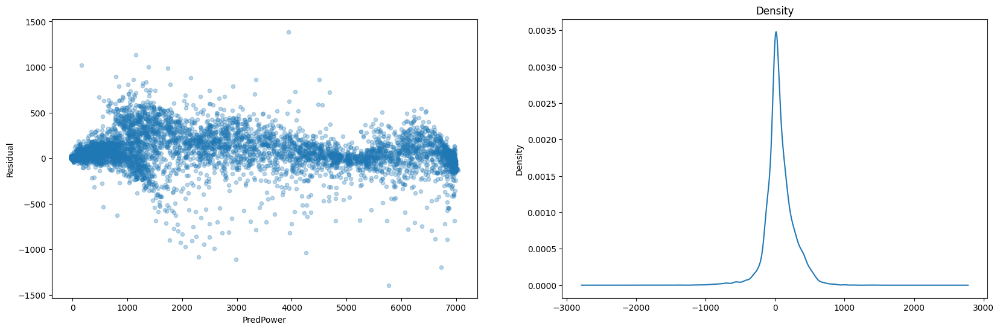

west-ocean
direction-split...
west-ocean
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_temp_press_temp_diff_rh_orig-data_west-ocean


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 16591.135879214908
TrainRMSE: 128.80658321380514
TrainR2: 0.997244947171771
TrainMAE: 86.70728738661039
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.8, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              fea

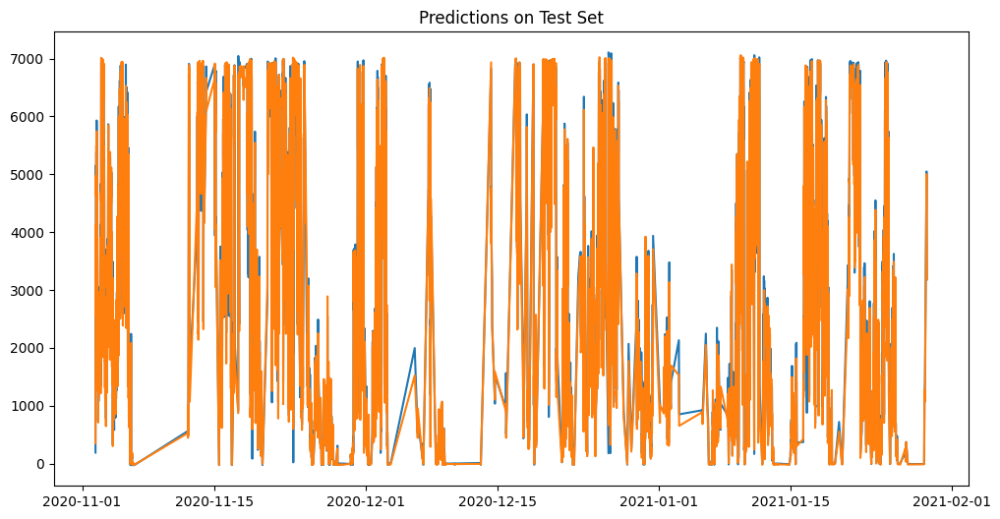

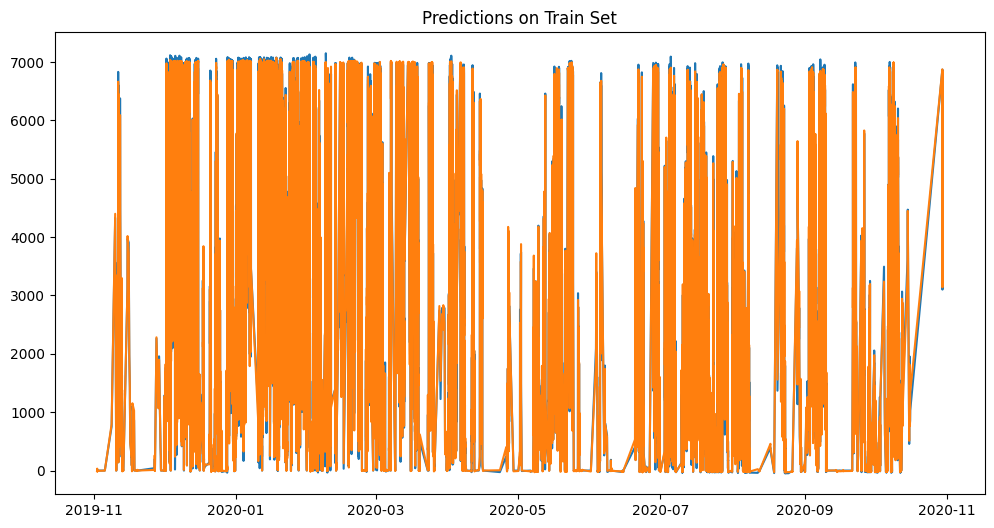

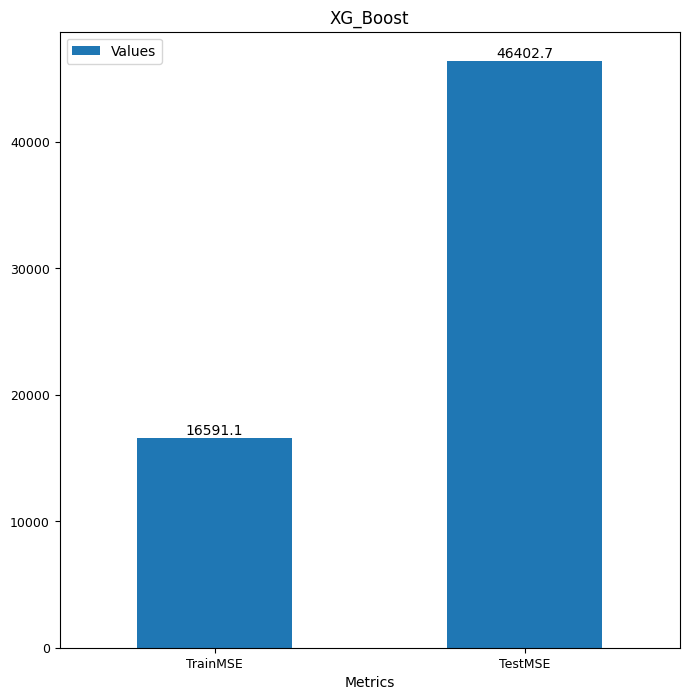

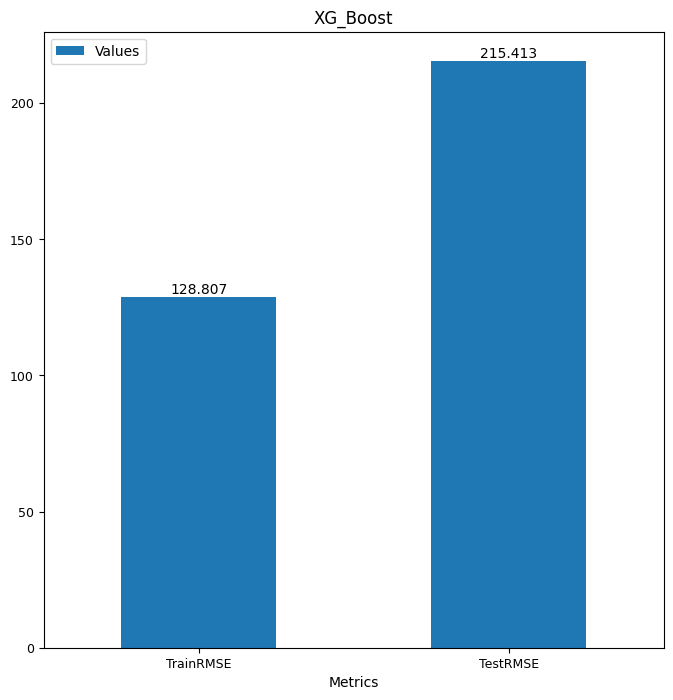

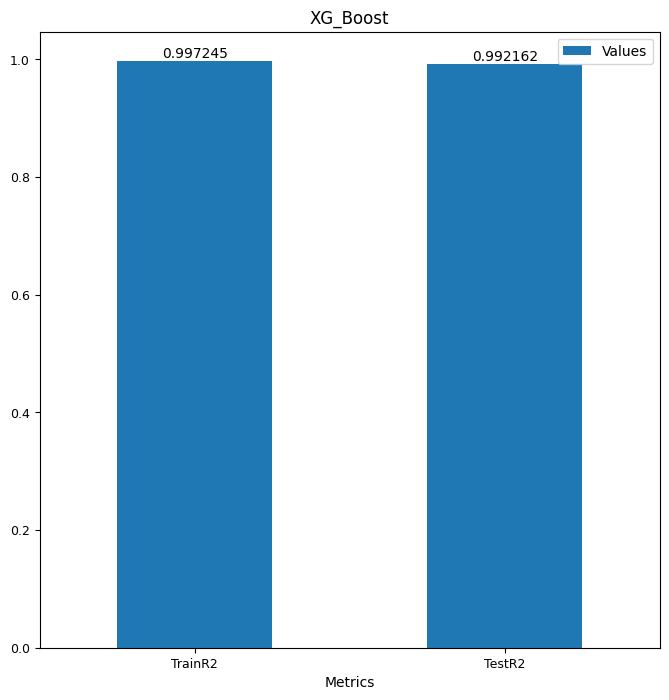

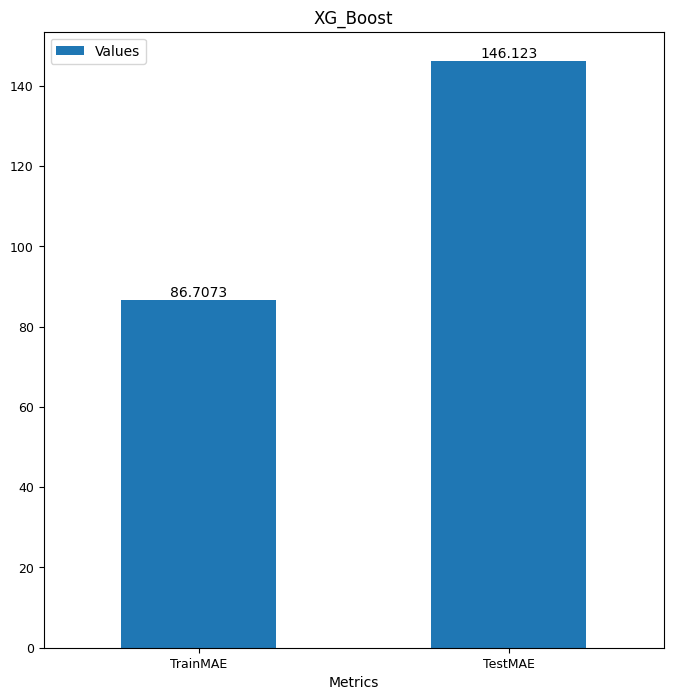

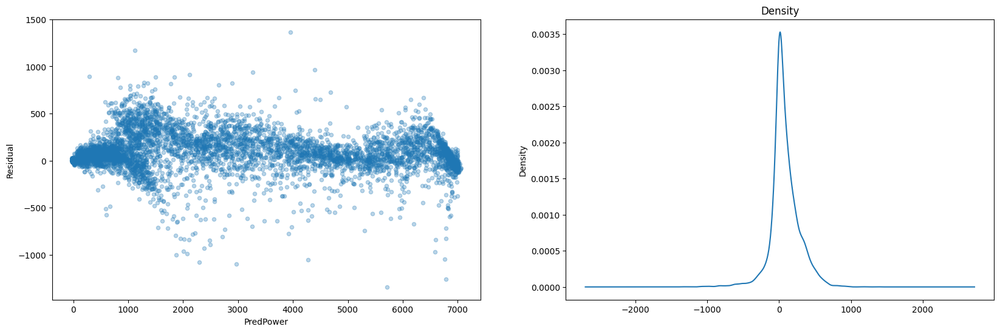

west-ocean
direction-split...
west-ocean
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_temp_press_temp_diff_t2m_d2m_orig-data_west-ocean


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 15205.157091337109
TrainRMSE: 123.30919305281788
TrainR2: 0.9974750968617746
TrainMAE: 83.91152879668363
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.30000000000000004, base_score=None,
                              booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
           

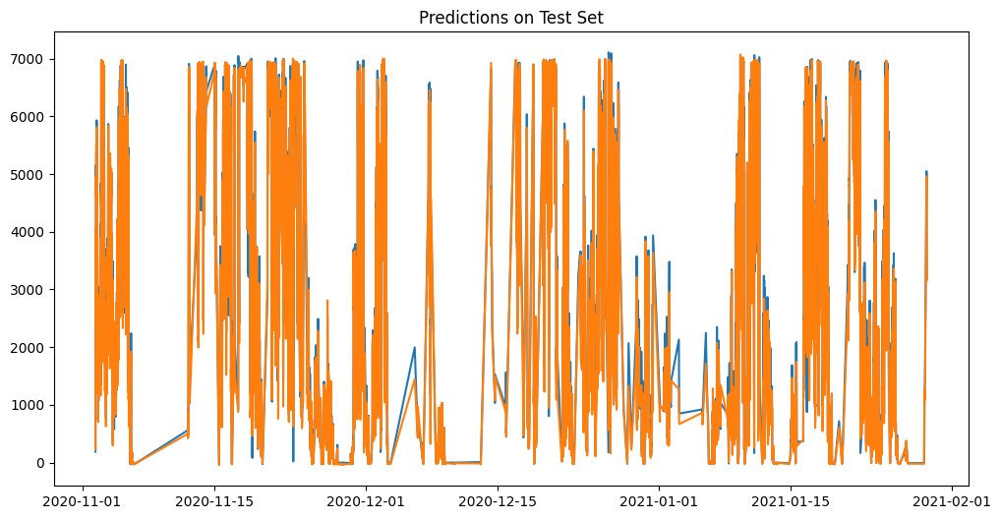

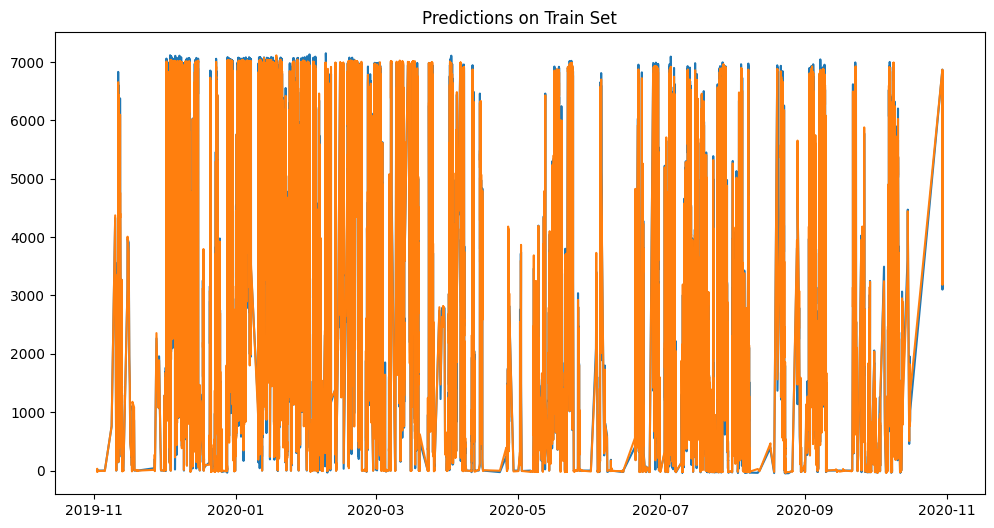

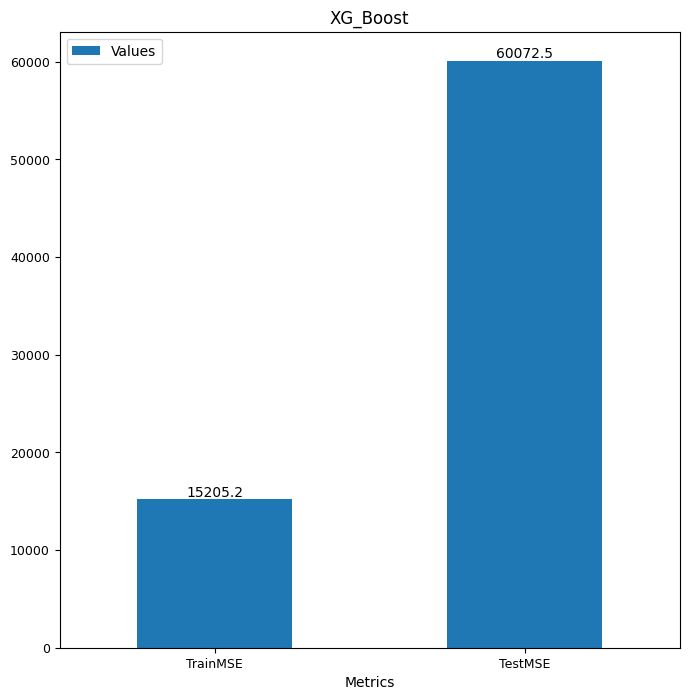

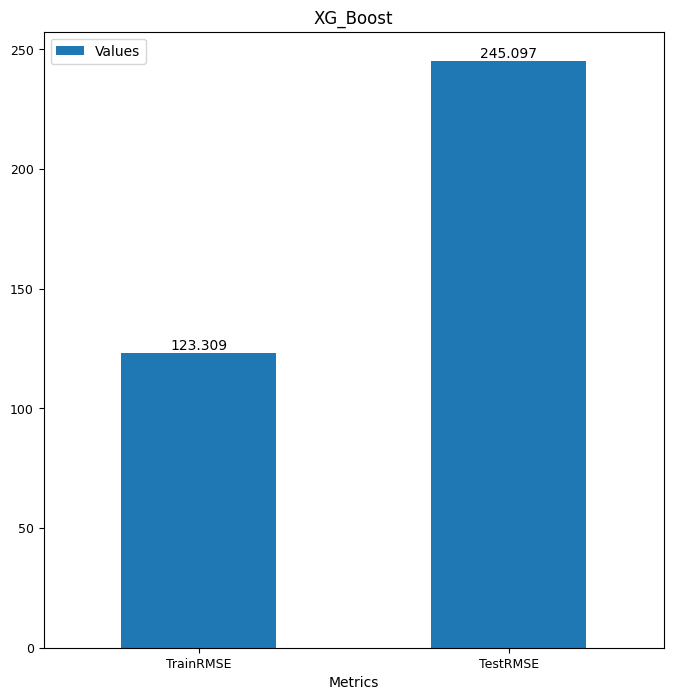

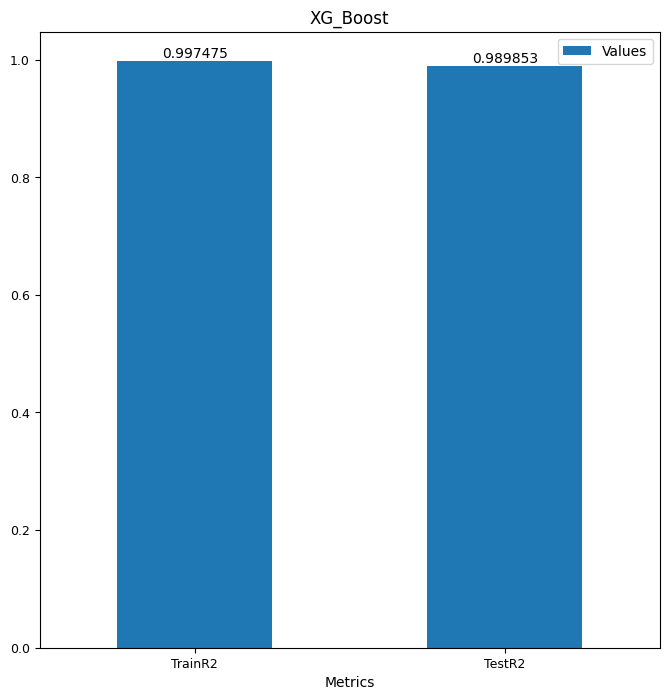

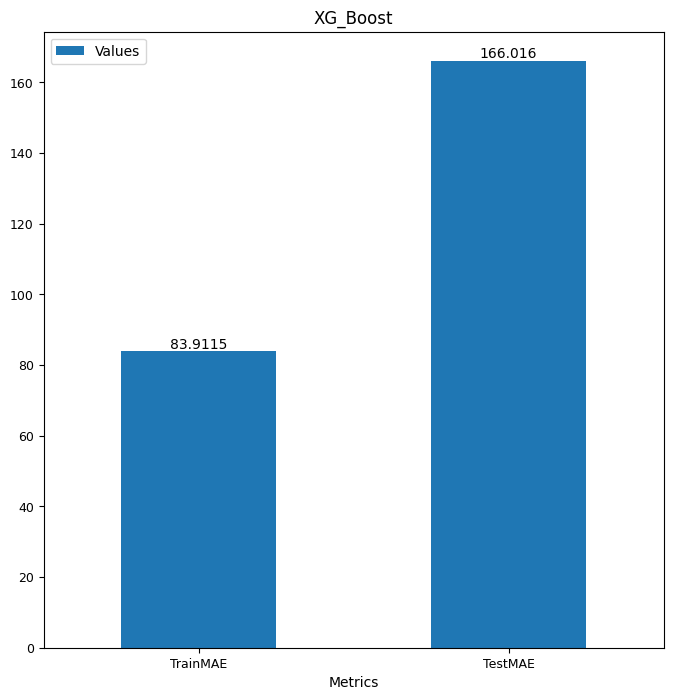

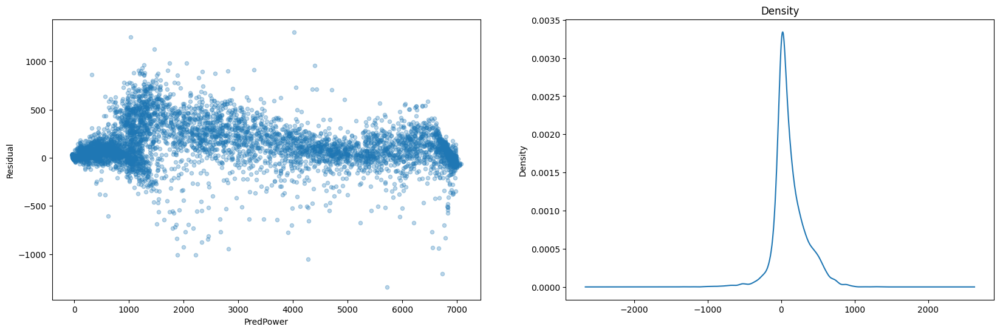

east-sea
direction-split...
east-sea
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_intial_features_orig-data_east-sea


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 20781.365535412457
TrainRMSE: 144.15743316045987
TrainR2: 0.9949036189247007
TrainMAE: 81.64787370076405
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.2, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None, g

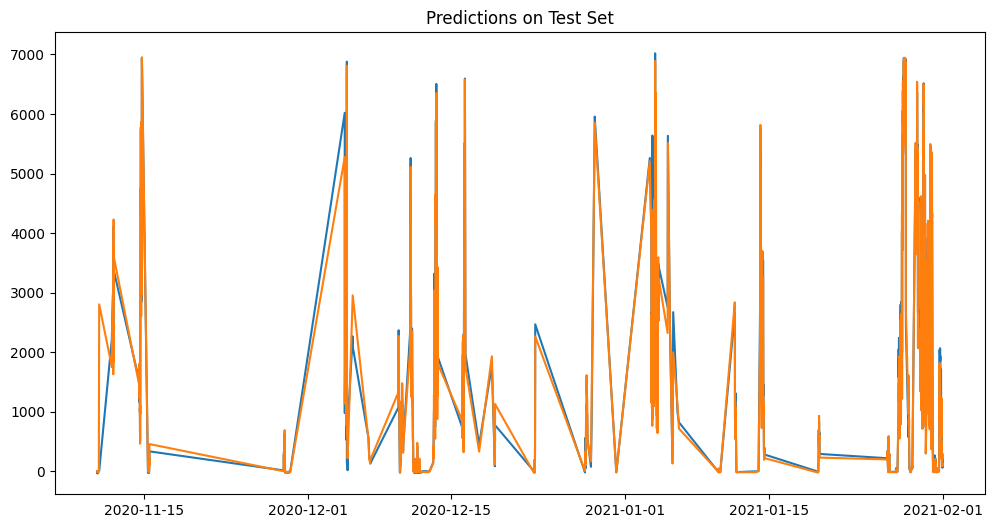

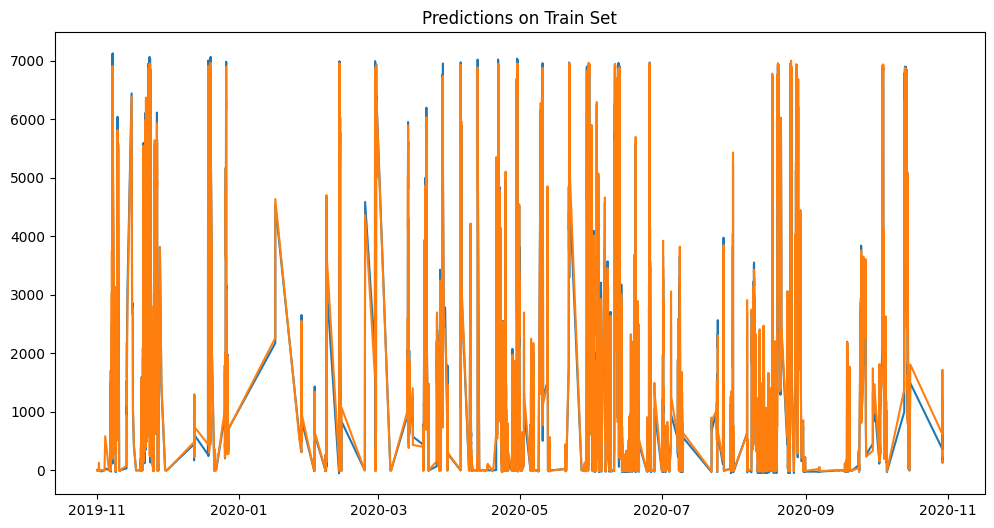

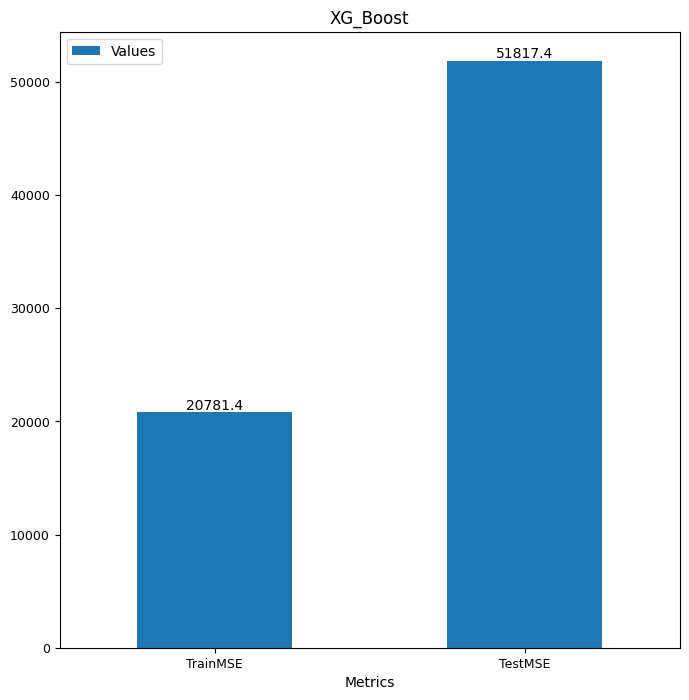

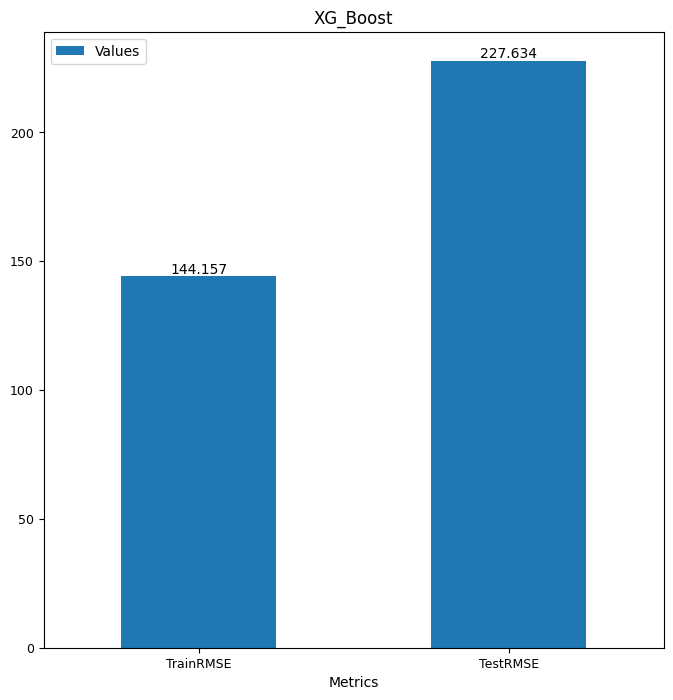

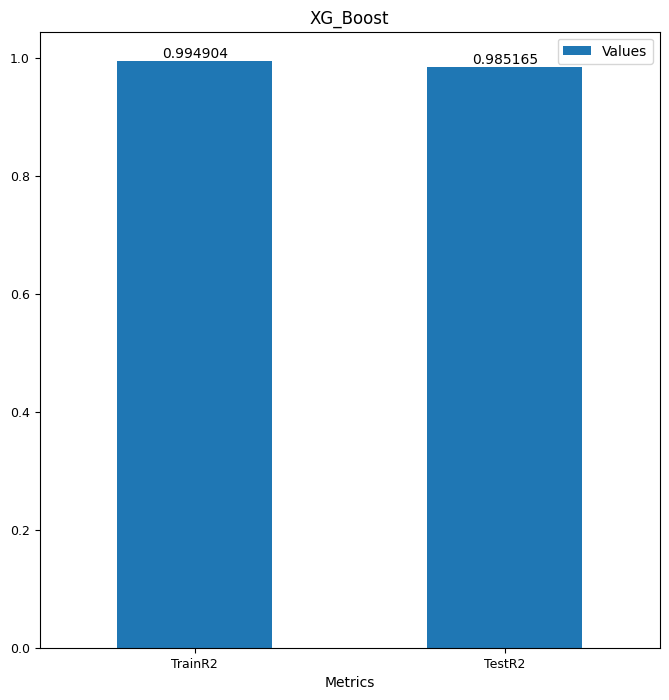

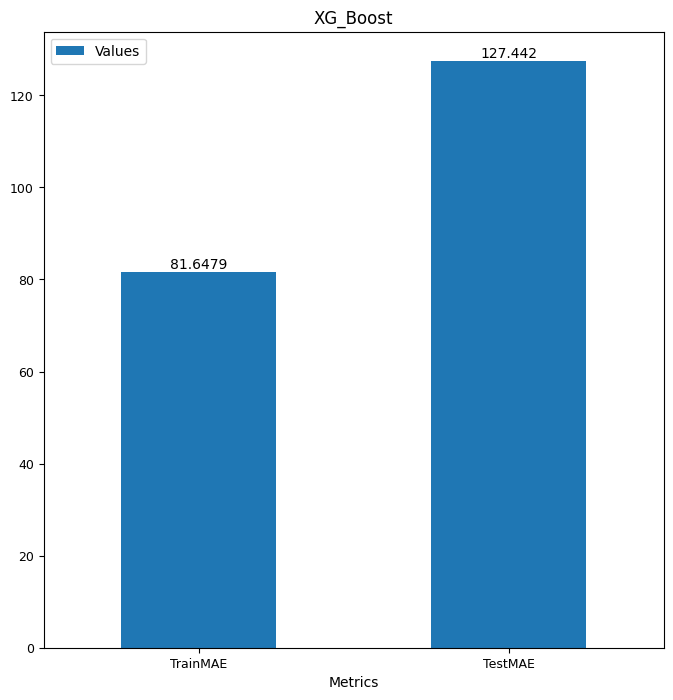

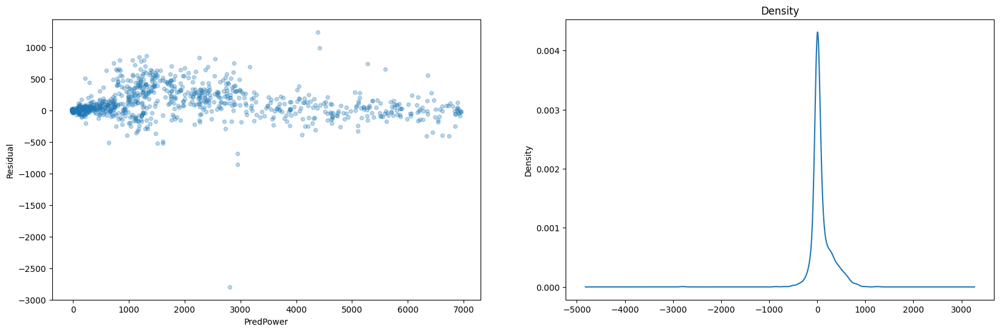

east-sea
direction-split...
east-sea
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_temp_orig-data_east-sea


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 19145.52401573206
TrainRMSE: 138.367351697328
TrainR2: 0.995304789470923
TrainMAE: 78.20068792243522
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.30000000000000004, base_score=None,
                              booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=N

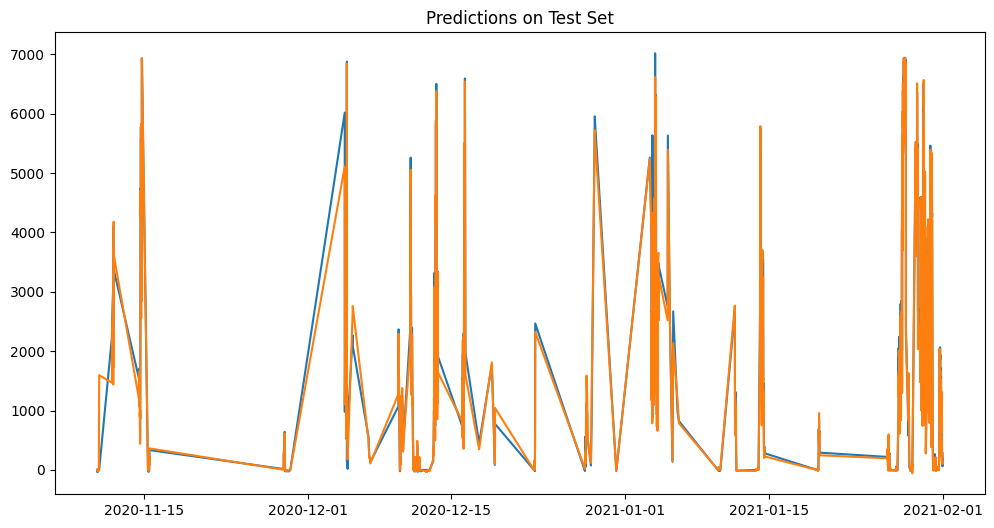

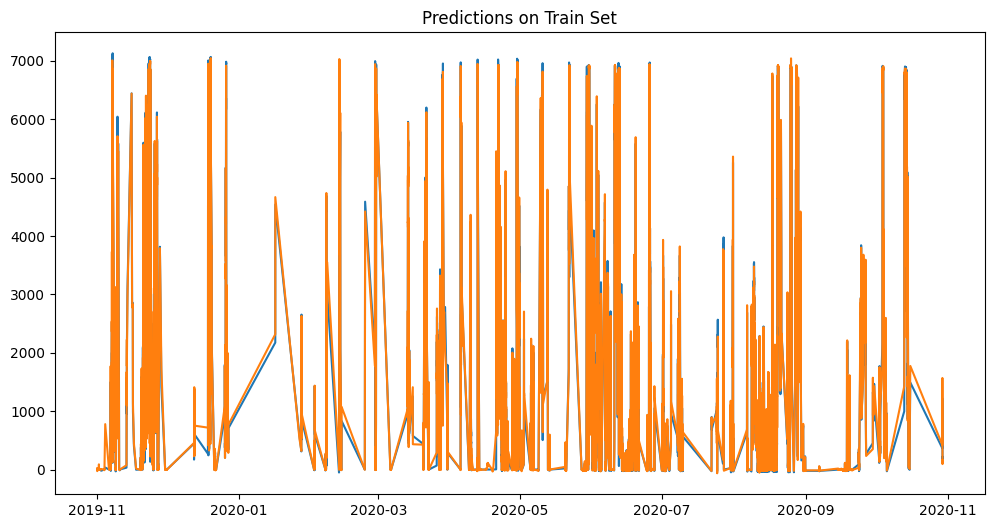

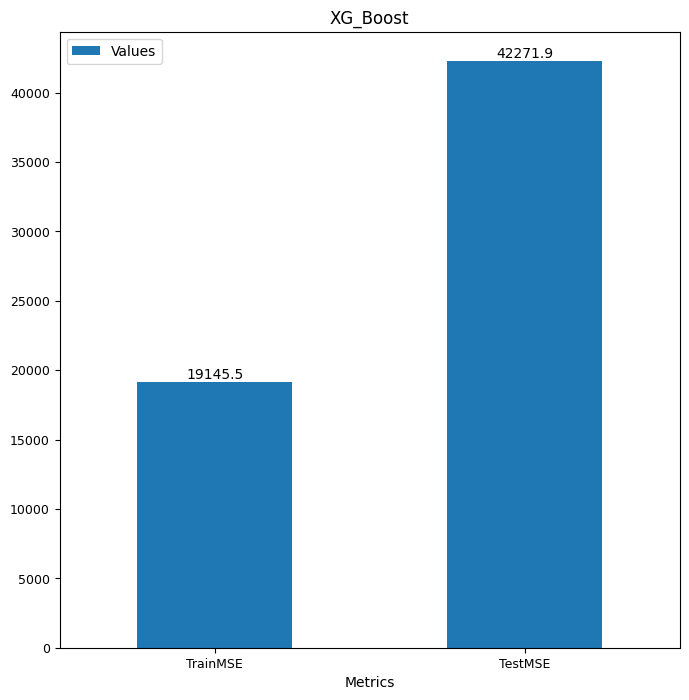

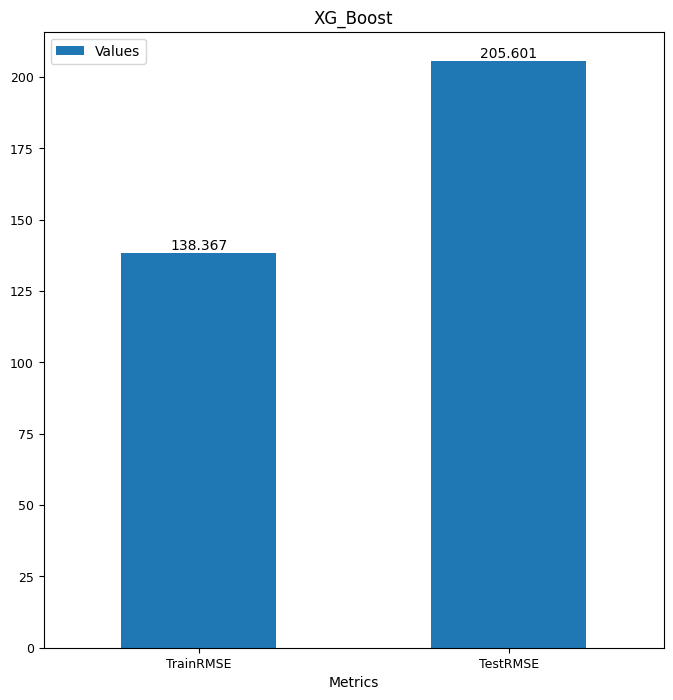

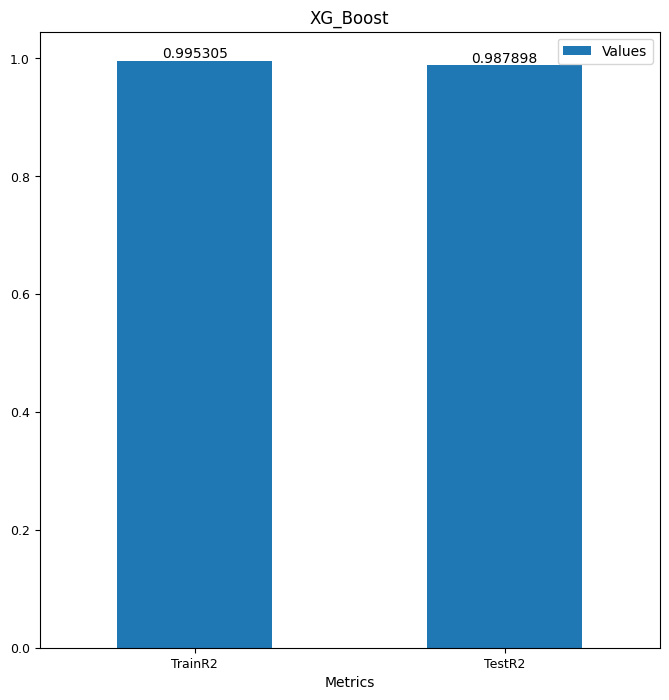

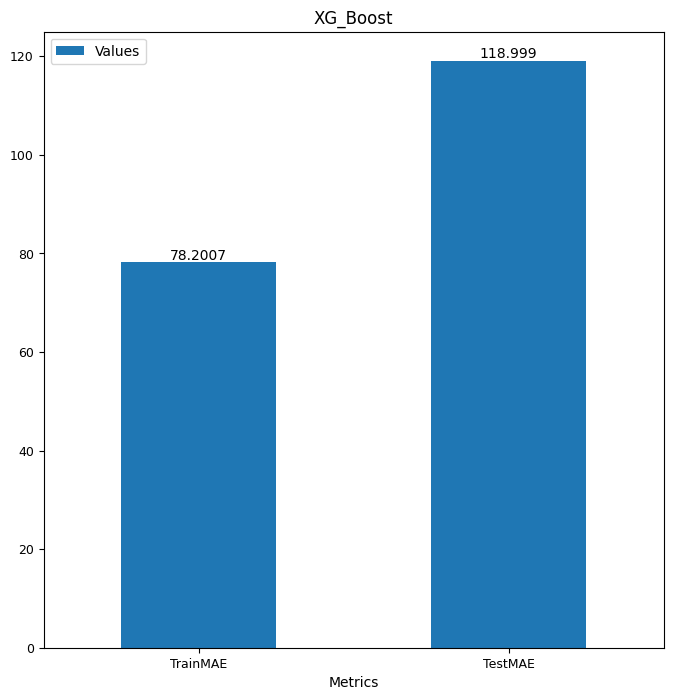

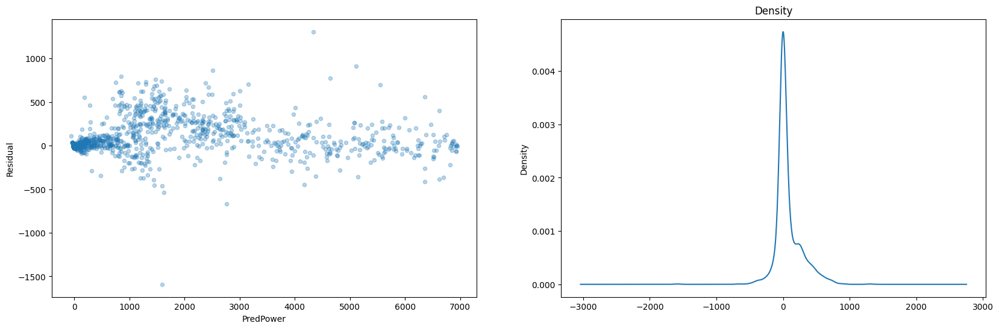

east-sea
direction-split...
east-sea
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_pres_orig-data_east-sea


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 26919.884062540554
TrainRMSE: 164.0728011053037
TrainR2: 0.993398220754464
TrainMAE: 98.80787493102358
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.6000000000000001, base_score=None,
                              booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=

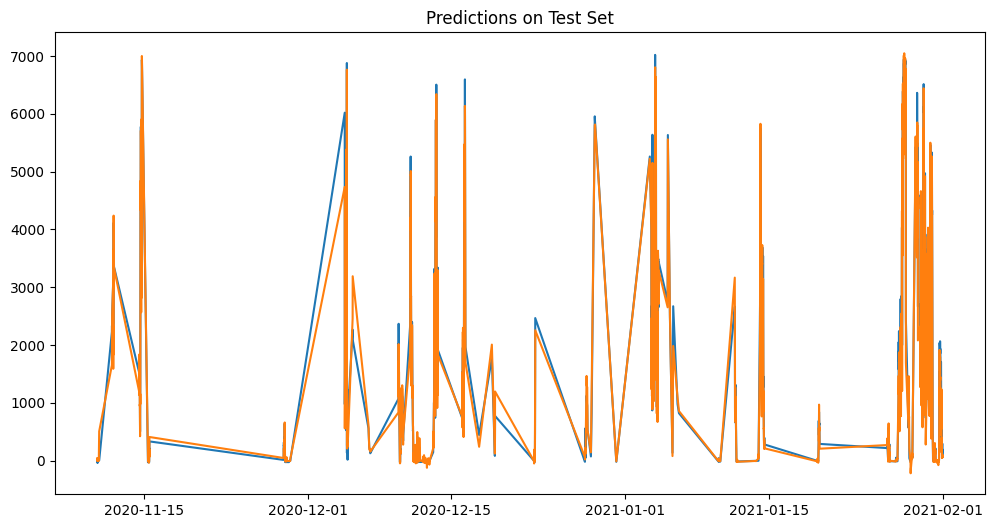

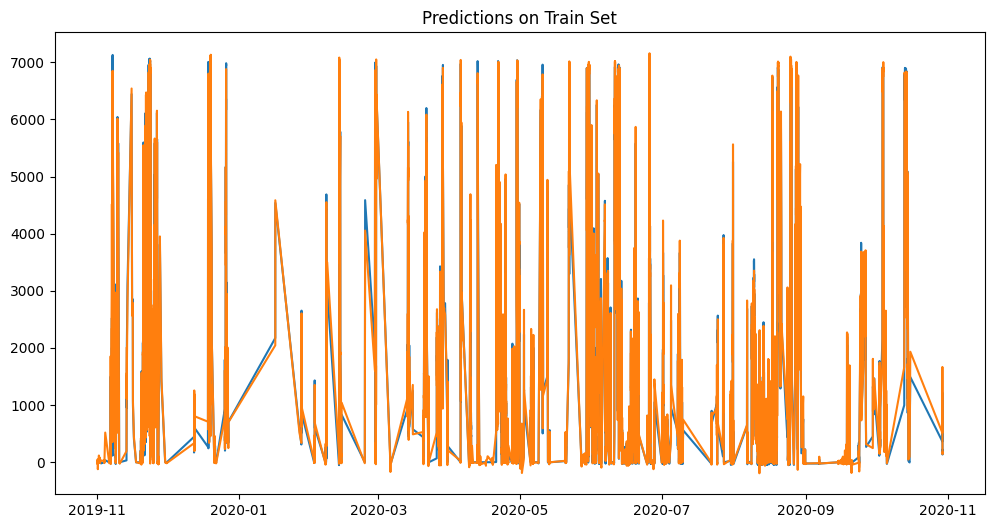

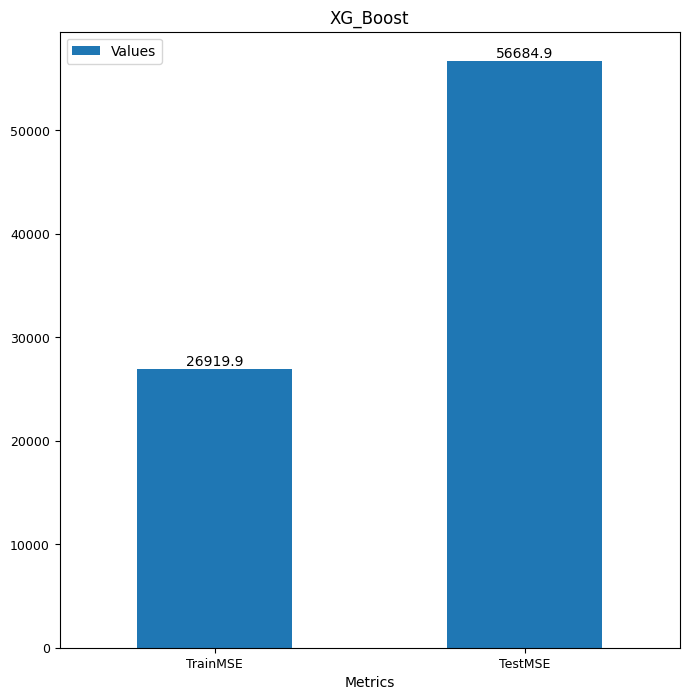

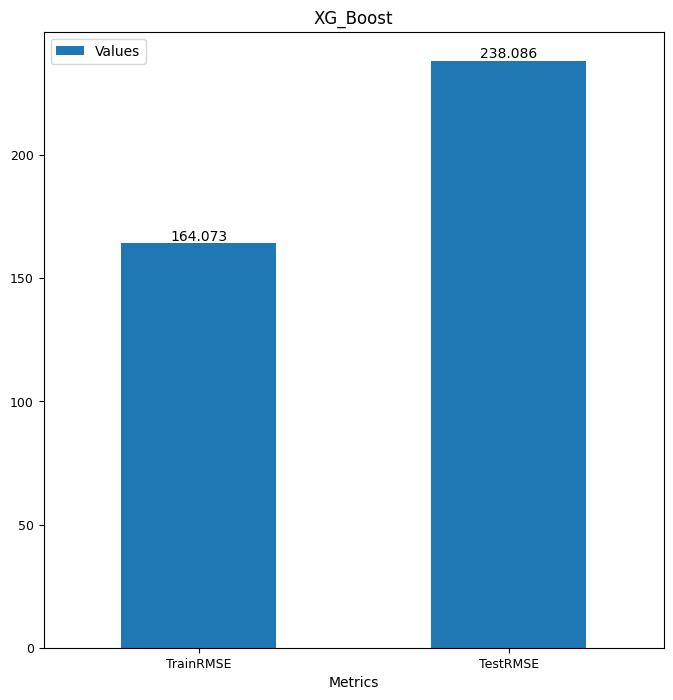

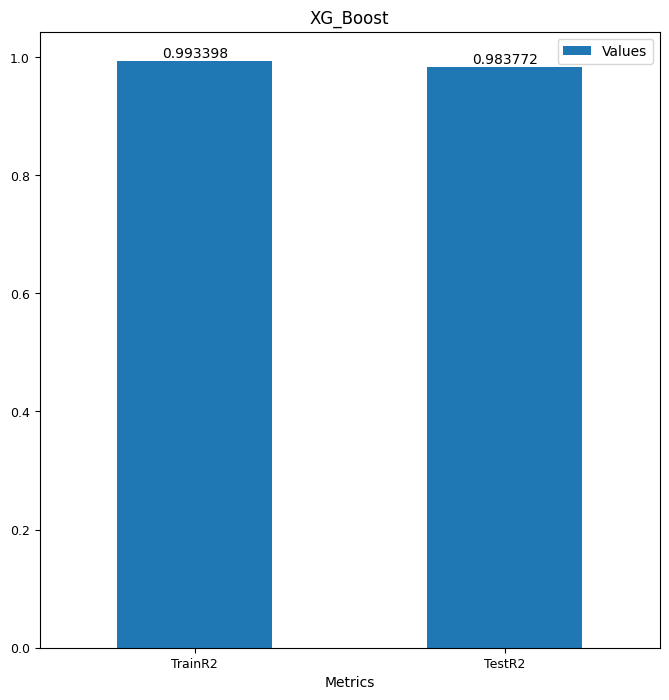

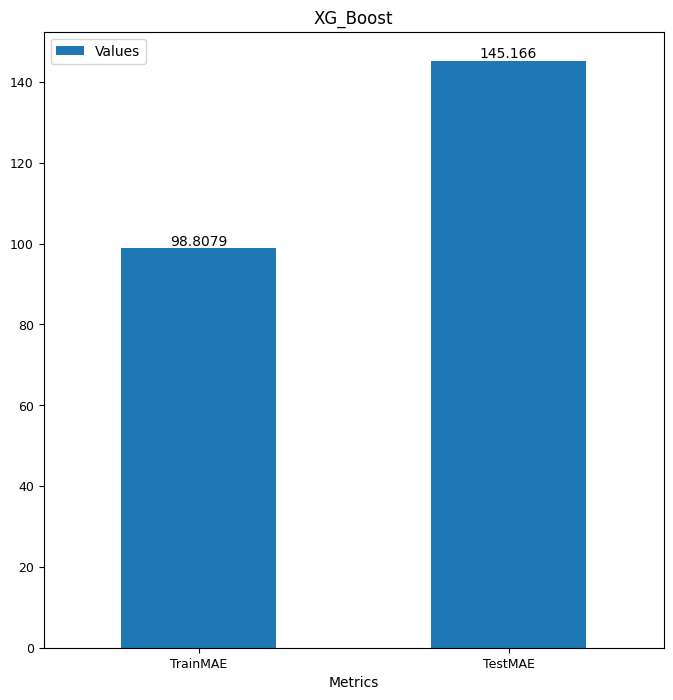

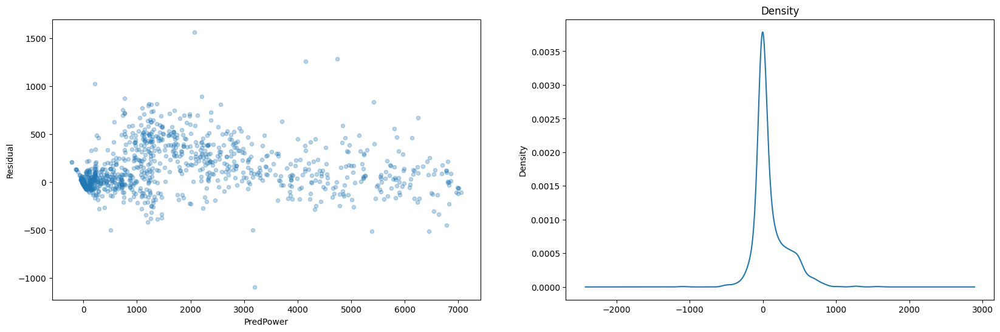

east-sea
direction-split...
east-sea
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_temp_diff_orig-data_east-sea


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 18912.805480276085
TrainRMSE: 137.5238360440694
TrainR2: 0.9953618609053266
TrainMAE: 79.51532199557104
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.2, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gam

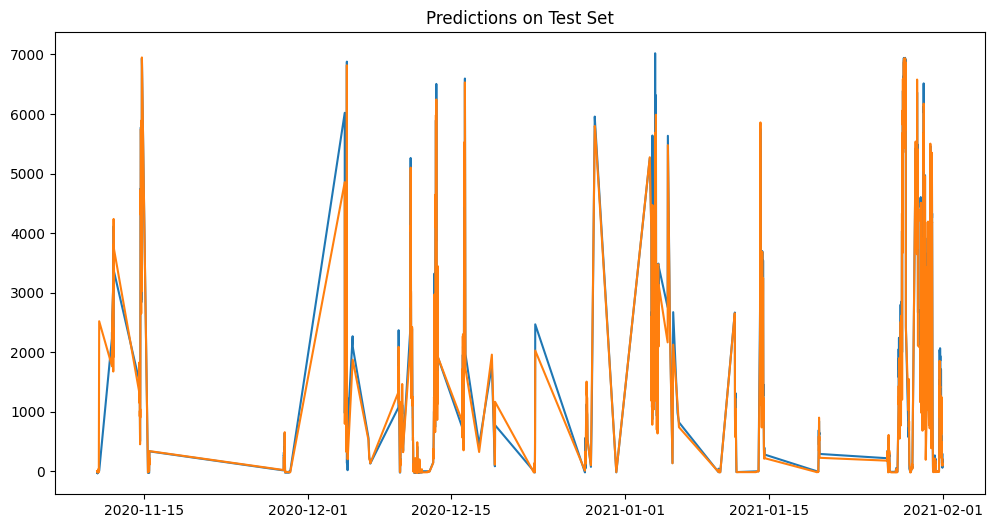

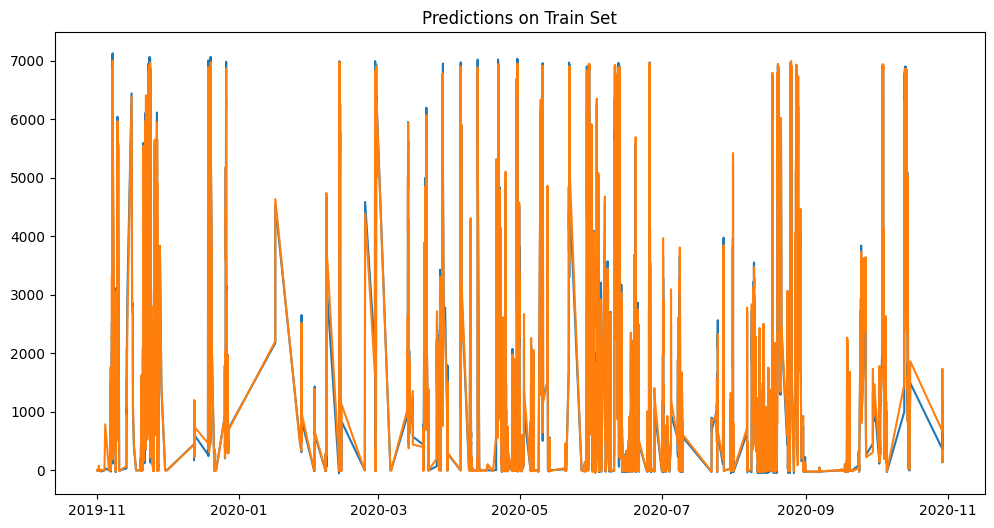

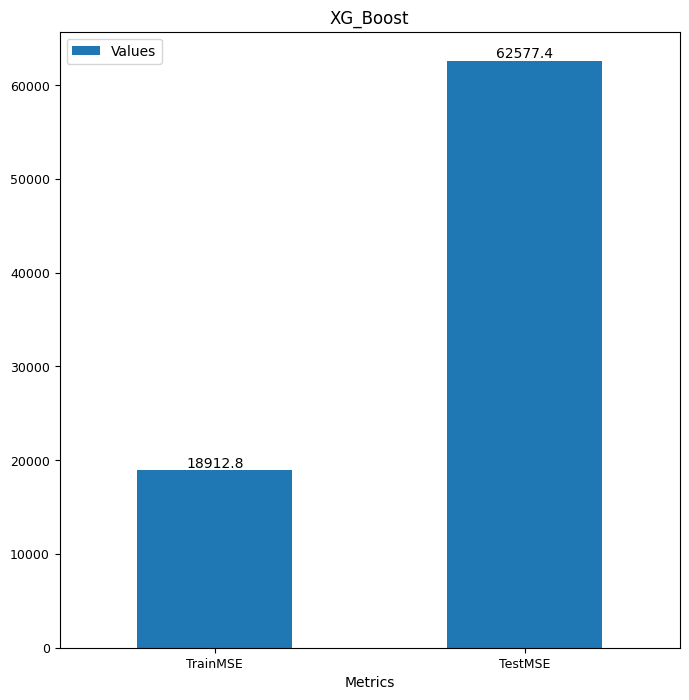

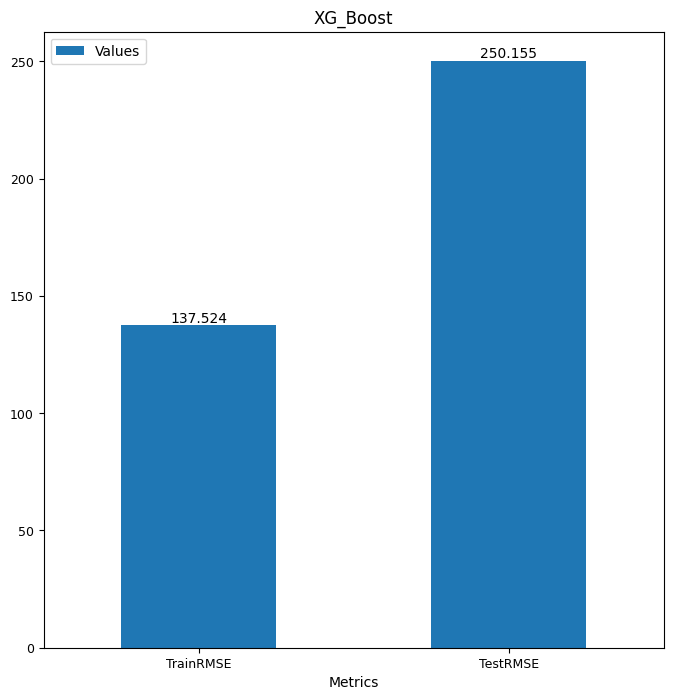

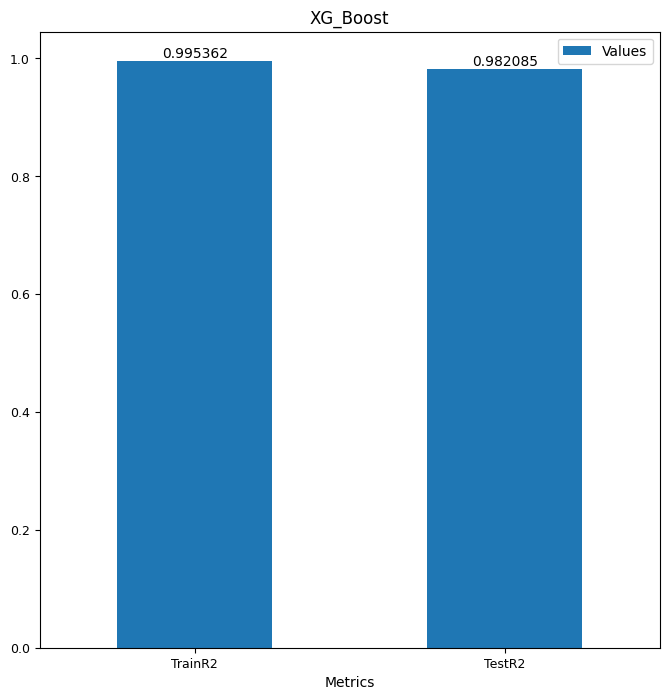

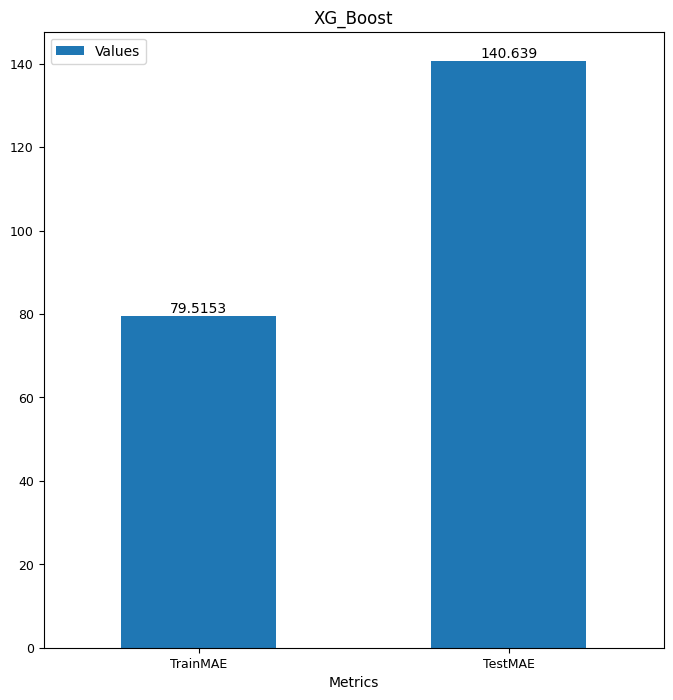

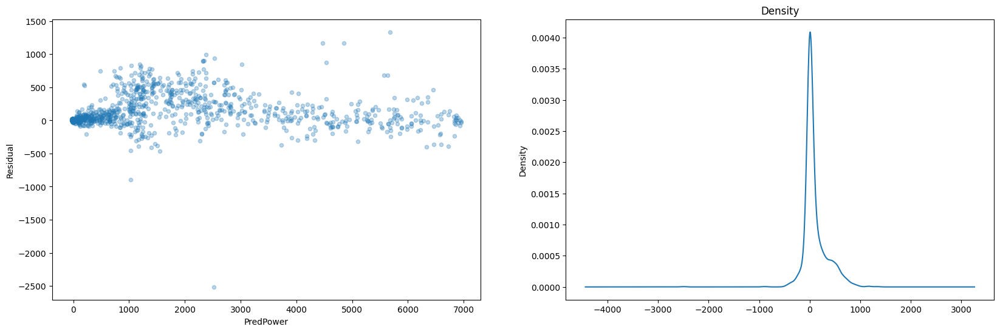

east-sea
direction-split...
east-sea
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_t2m_d2m_orig-data_east-sea


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 18764.045137930392
TrainRMSE: 136.98191536816236
TrainR2: 0.9953983425981294
TrainMAE: 77.65408276624193
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.30000000000000004, base_score=None,
                              booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_

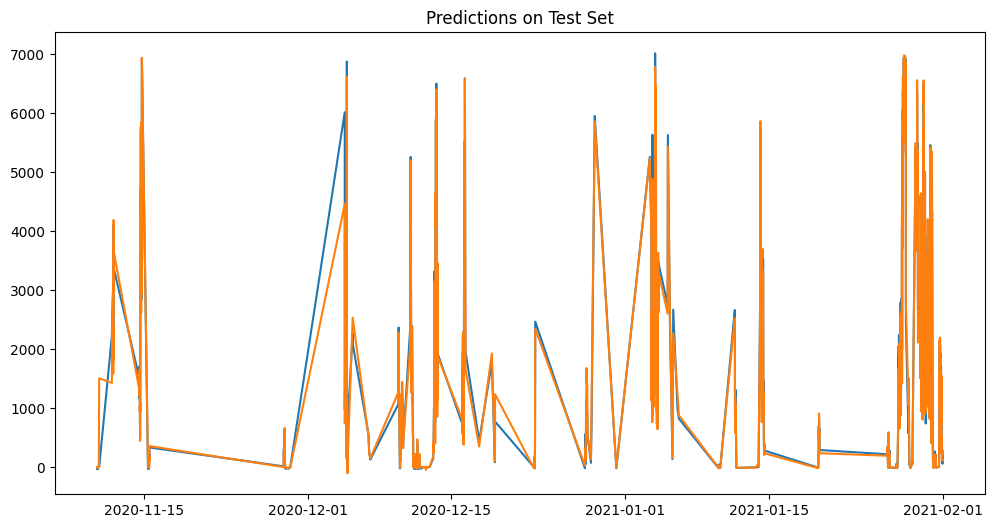

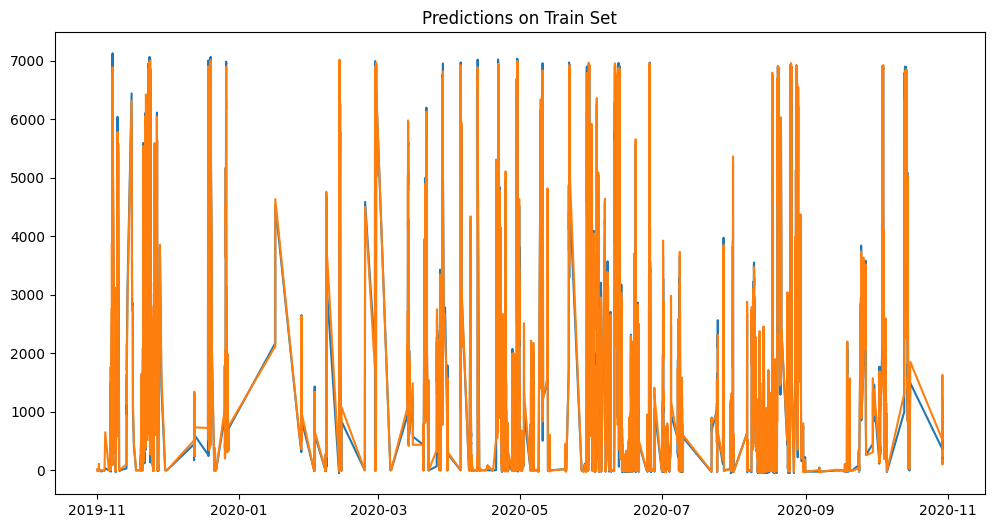

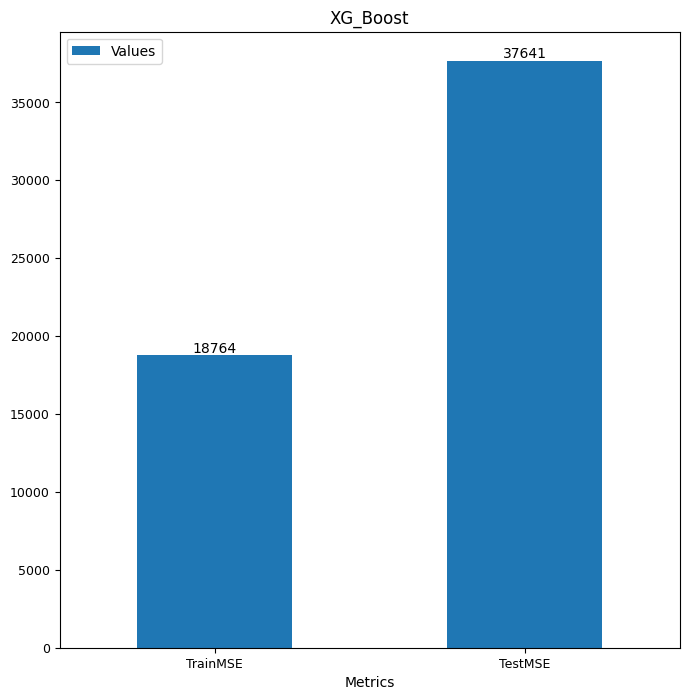

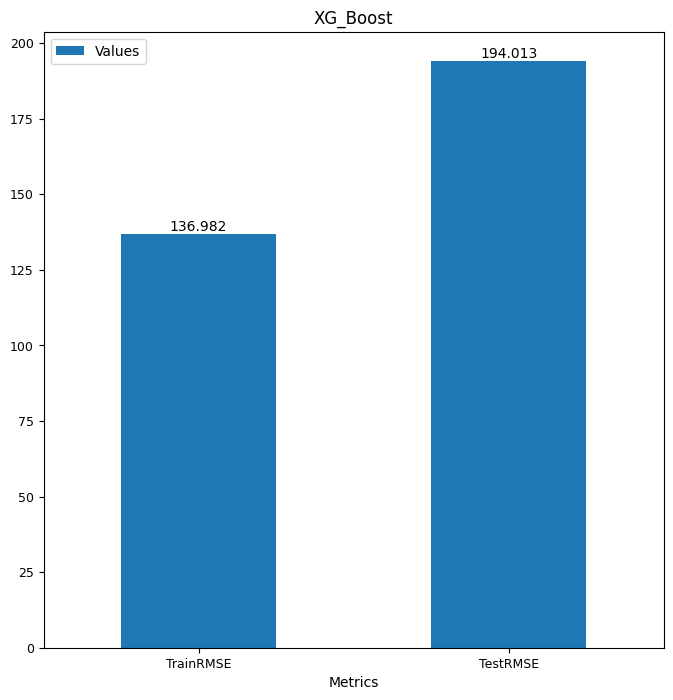

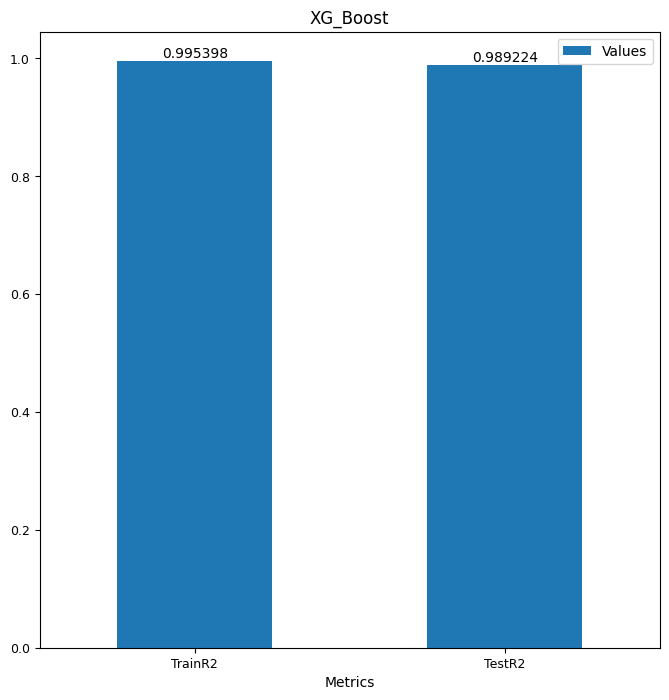

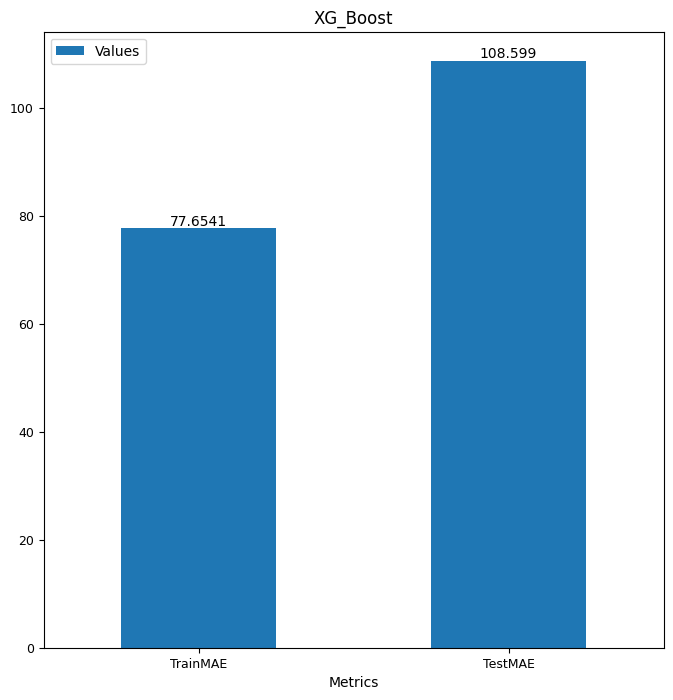

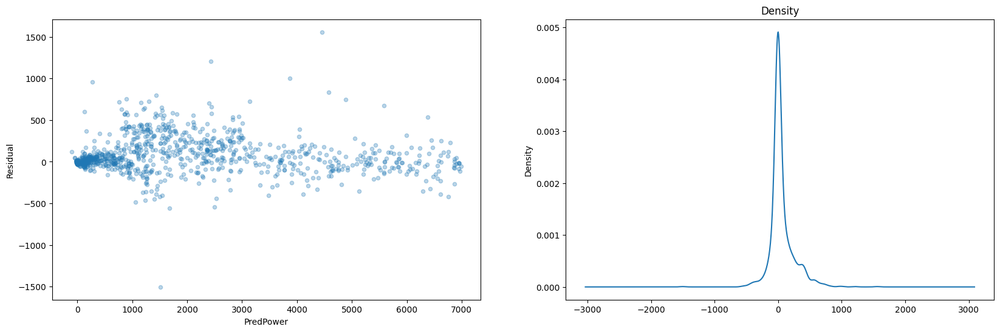

east-sea
direction-split...
east-sea
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_rh_orig-data_east-sea


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 20580.93241046736
TrainRMSE: 143.46056047035142
TrainR2: 0.9949527727487405
TrainMAE: 81.41247154290704
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.2, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None

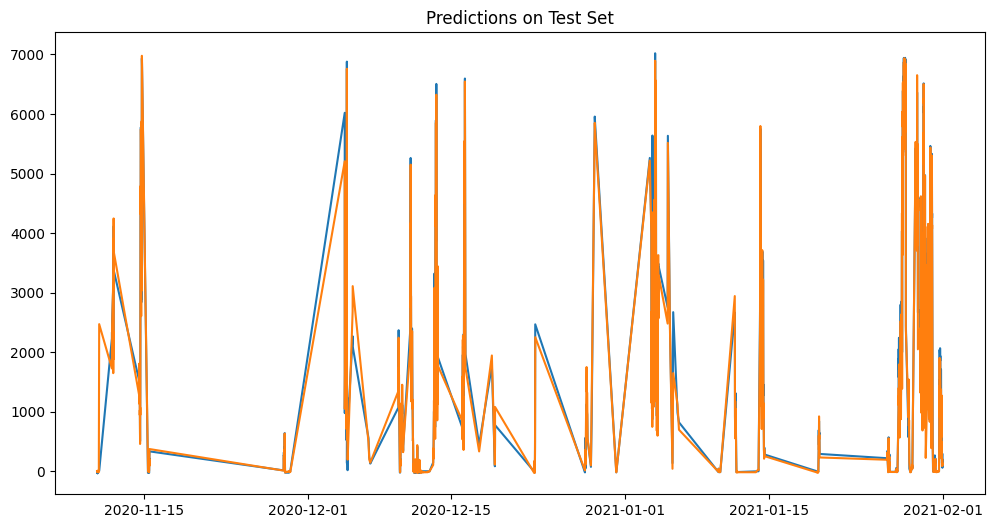

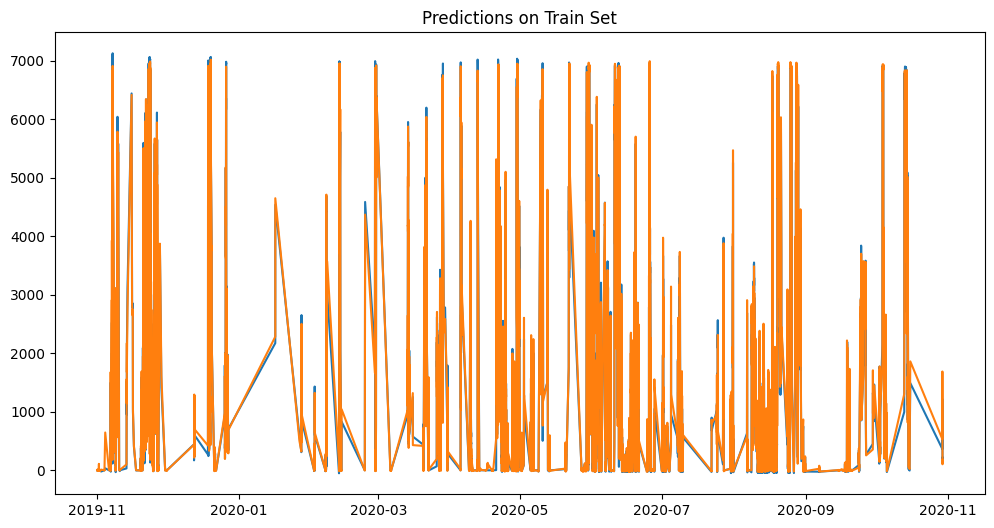

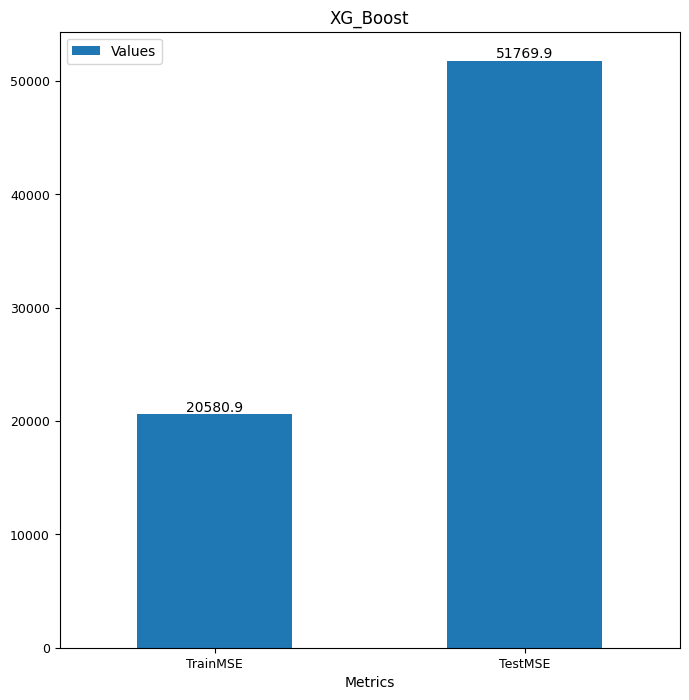

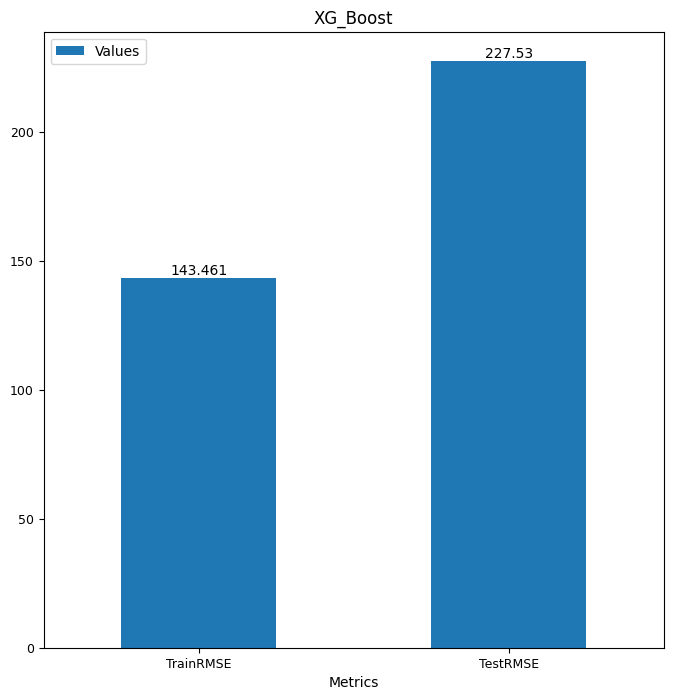

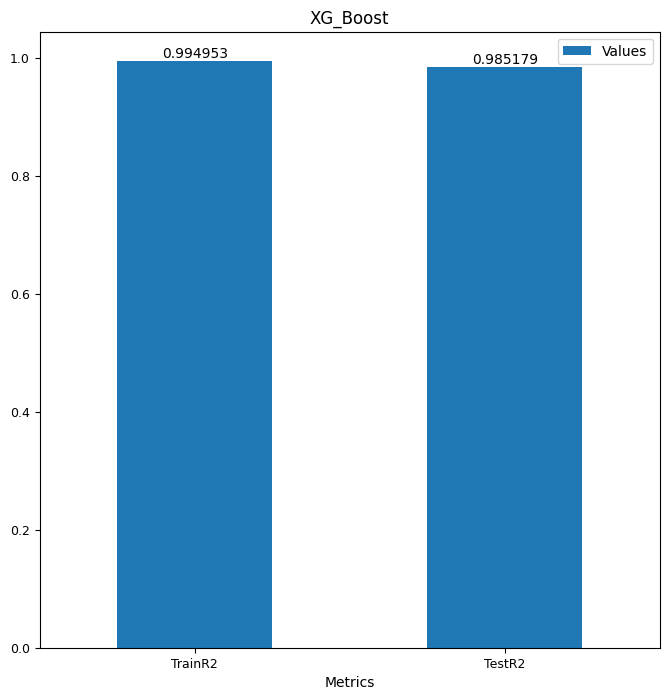

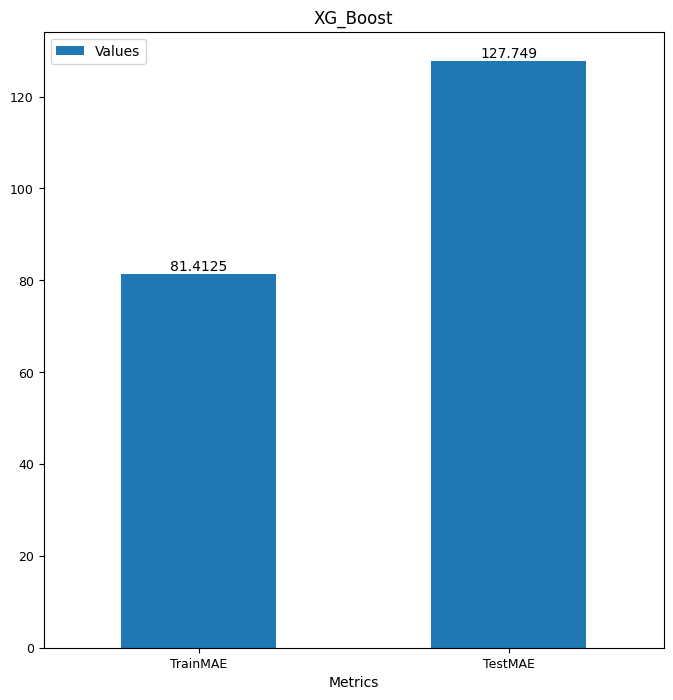

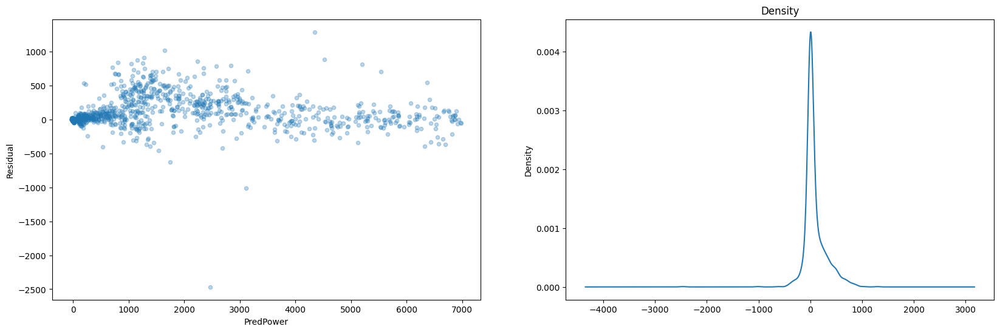

east-sea
direction-split...
east-sea
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_temp_press_temp_diff_rh_orig-data_east-sea


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 16611.318320369184
TrainRMSE: 128.8849033842567
TrainR2: 0.995926273074816
TrainMAE: 74.93518123392187
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.2, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_ty

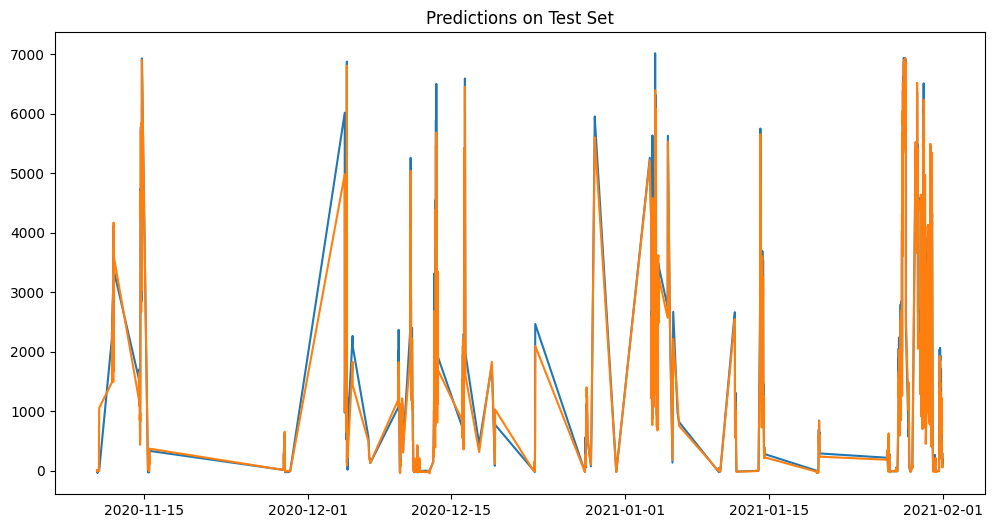

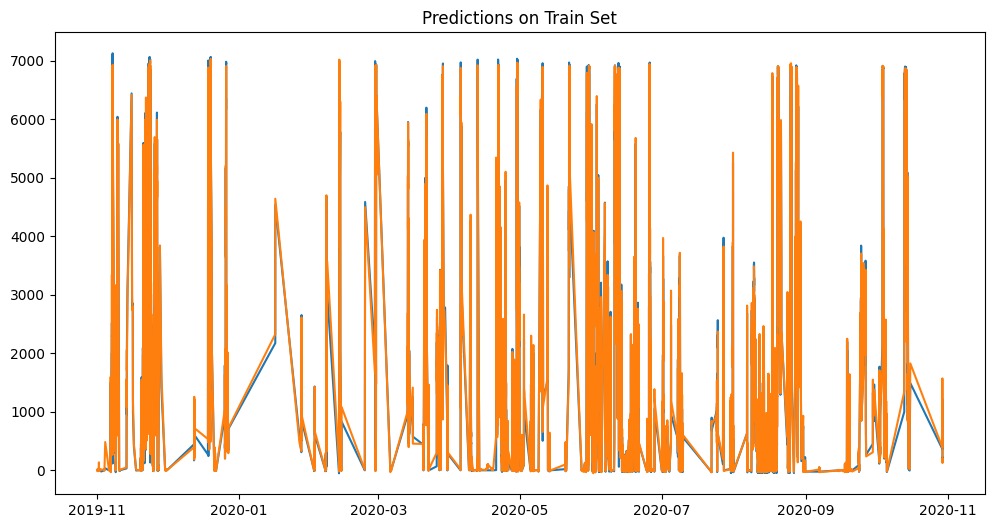

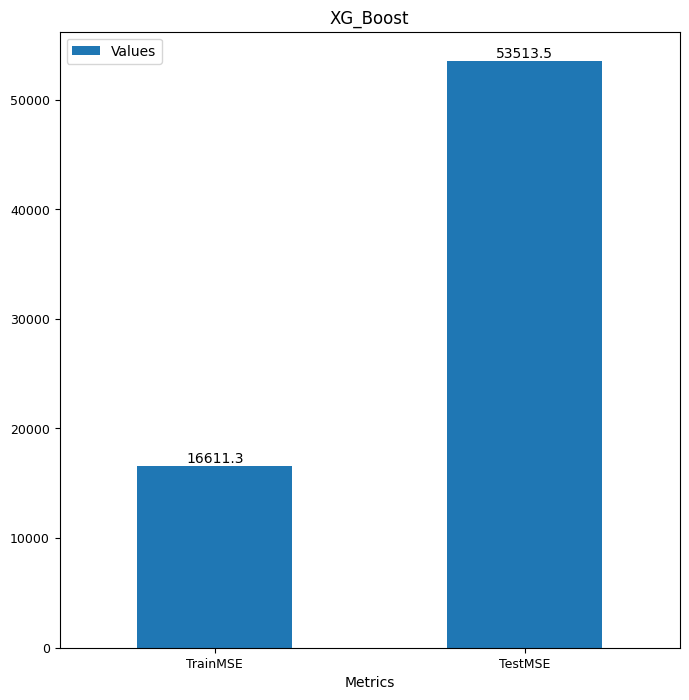

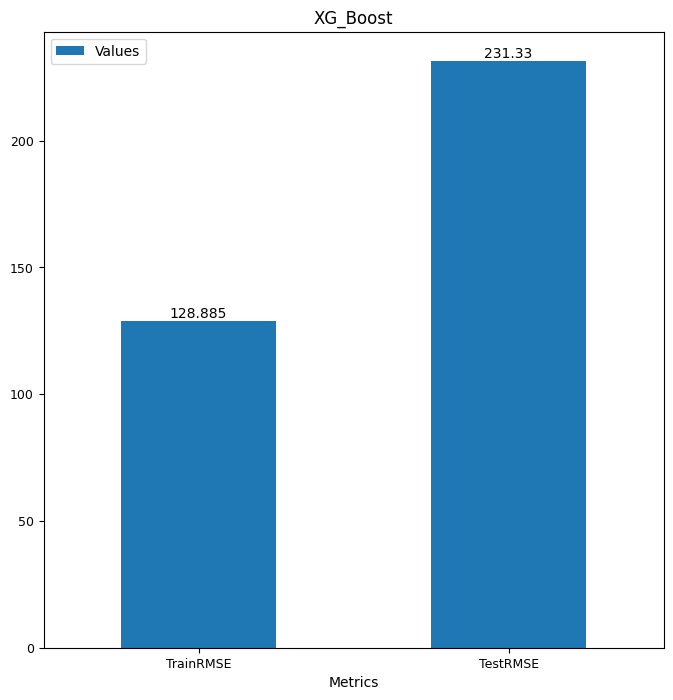

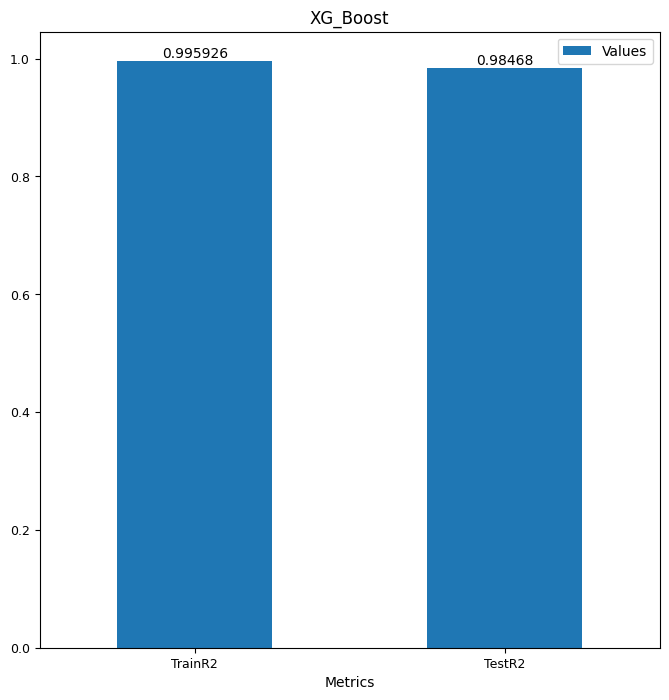

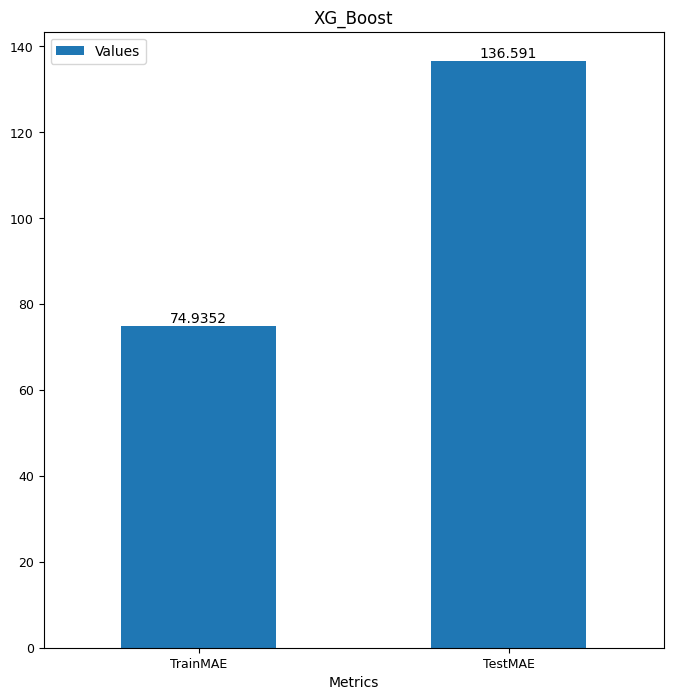

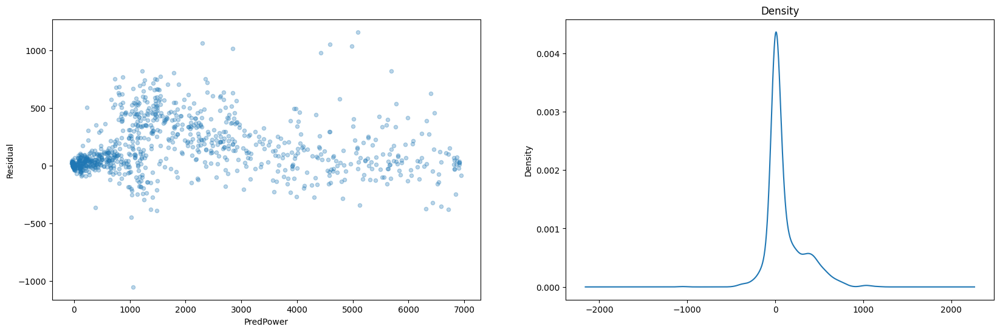

east-sea
direction-split...
east-sea
2020-11-01 00:00:00
2020-12-01 00:00:00
2021-01-01 00:00:00
2021-02-01 00:00:00
2021-03-01 00:00:00
2021-04-01 00:00:00
2021-05-01 00:00:00
2021-06-01 00:00:00
2021-07-01 00:00:00
2021-08-01 00:00:00
2021-09-01 00:00:00
2021-10-01 00:00:00


XG_Boost_initial_features_temp_press_temp_diff_t2m_d2m_orig-data_east-sea


Fitting 5 folds for each of 100 candidates, totalling 500 fits
TrainMSE: 15919.663129471486
TrainRMSE: 126.17314741842452
TrainR2: 0.996095893228964
TrainMAE: 73.02456338830746
Best model: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 XGBRegressor(alpha=0.2, base_score=None, booster=None,
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None, colsample_bytree=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feat

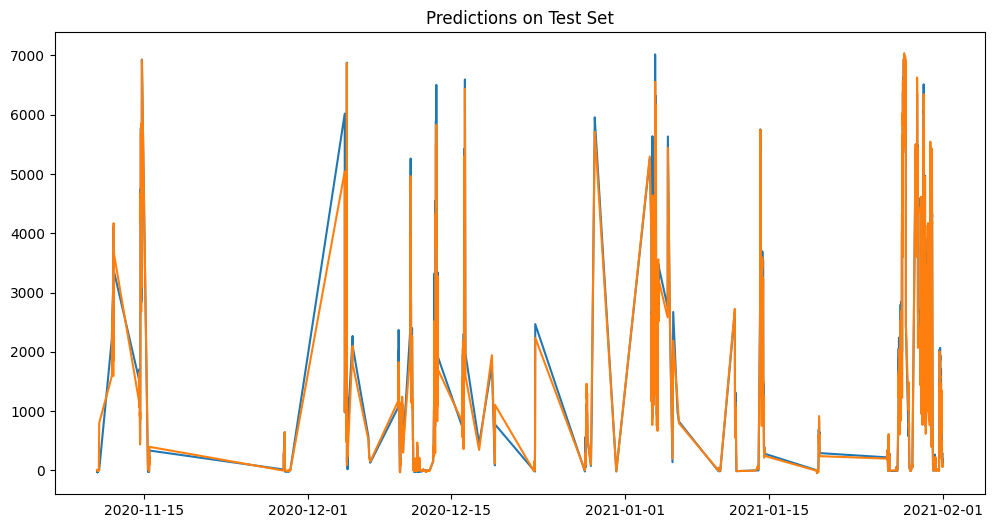

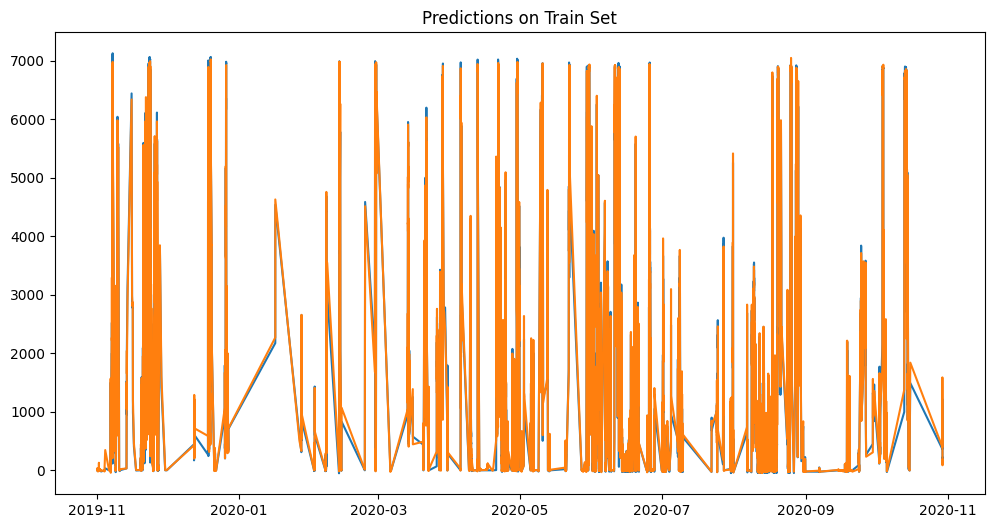

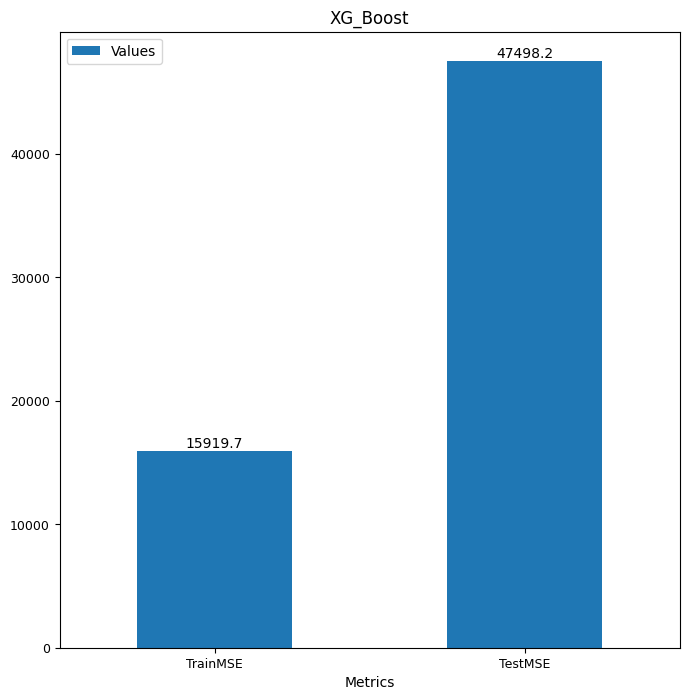

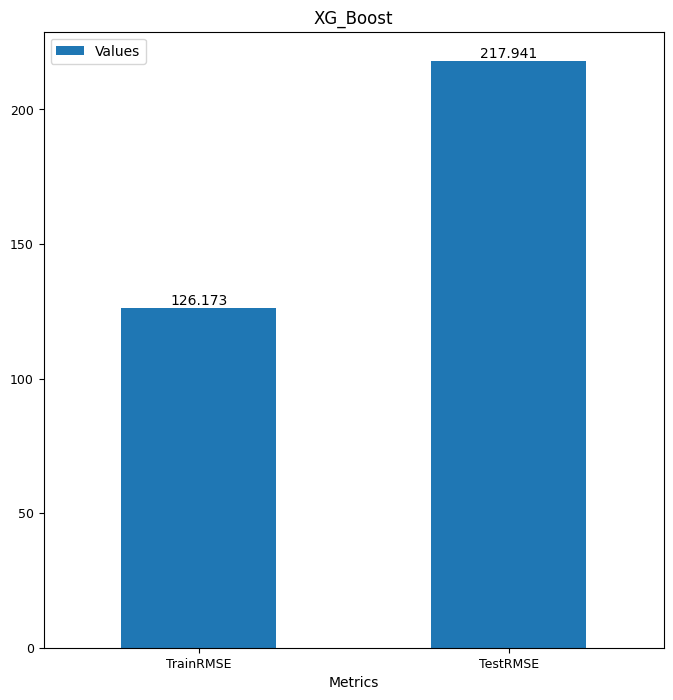

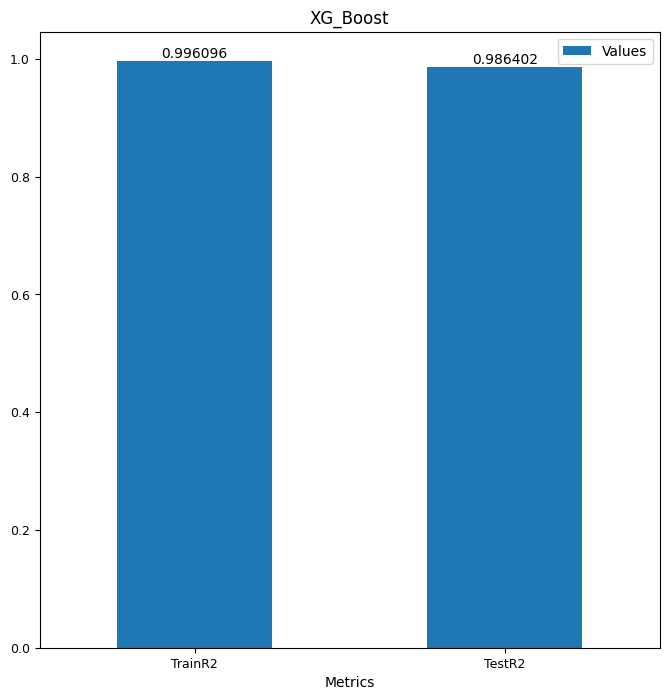

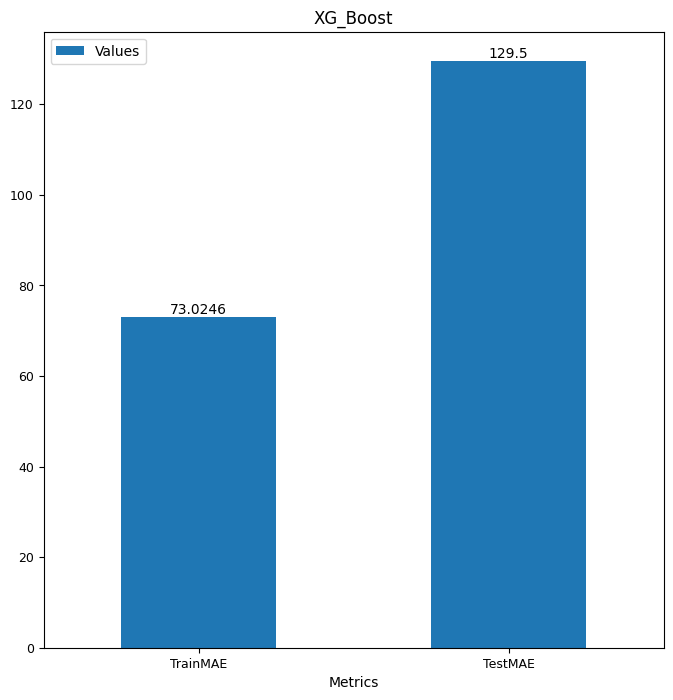

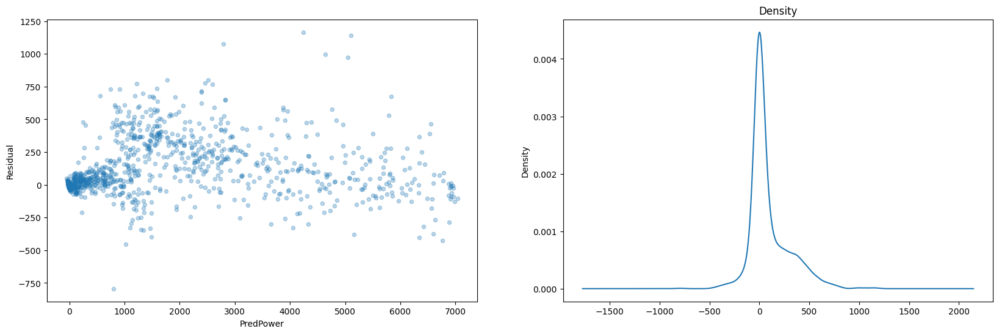

CPU times: user 42min 31s, sys: 1min 56s, total: 44min 27s
Wall time: 5h 30min 39s


In [ ]:
%%time
for comb in data_combinations:
  tune_and_predict(comb)

In [ ]:
mlflow.end_run() #end ml flow run manually if needed